# Classifying Confusion with RNN

This notebook holds our confusion classification pipeline for various RNN architectures. Experiments occur with no data augmentation.


In [1]:
import pickle
import os
import random
import shutil

import pandas as pd
import numpy as np
from imblearn.over_sampling import SMOTE 

import torch
from torch import nn
from torch import utils
from torch import autograd
from torchvision import datasets

from utils import pickle_loader
from utils import plot_metrics
from utils import get_train_val_split
from utils import check_metrics

from train import train

MANUAL_SEED = 1
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

np.random.seed(MANUAL_SEED)
random.seed(MANUAL_SEED)
torch.manual_seed(MANUAL_SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


MAX_SEQUENCE_LENGTH = 150
INPUT_SIZE = 14
HIDDEN_SIZE = 256
OUTPUT_SIZE = 2
BATCH_SIZE = 256

/ubc/cs/home/s/ssims/.local/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [2]:
class ConfusionRNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, batch_size, num_layers=1):
        super(ConfusionRNN, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.batch_size = batch_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers)
        self.out = nn.Linear(hidden_size, output_size)
        self.softmax = nn.LogSoftmax(1)


    def forward(self, input, hidden):
        input = input.permute(1,0,2) # change input shape to (max_seq_size,batch_size,input_features)
        output, hidden = self.rnn(input, hidden)
        output = self.softmax(self.out(output[0]))
        return output, hidden

    def initHidden(self, batch_size):
        return autograd.Variable(torch.zeros(self.num_layers, batch_size, self.hidden_size, device=device))

In [3]:
class ConfusionRNN(nn.Module):
    """
        Basic/Vanilla RNN.
    """
    def __init__(self, input_size, hidden_size, output_size, batch_size, num_layers=1):
        super(ConfusionRNN, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.batch_size = batch_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers)
        self.out = nn.Linear(hidden_size, output_size)
        self.softmax = nn.LogSoftmax(1)

    def forward(self, inputs, hidden):
        # change input shape to (max_seq_size,batch_size,input_features):
        inputs = inputs.permute(1, 0, 2)
        output, hidden = self.rnn(inputs, hidden)
        output = self.softmax(self.out(output[0]))
        return output, hidden

    def init_hidden(self, batch_size):
        """ Initializes the hidden state with zero tensors.
        """
        return autograd.Variable(torch.zeros(self.num_layers, batch_size,
                                             self.hidden_size, device=DEVICE))

In [4]:
class ConfusionLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, batch_size, num_layers=1):
        super(ConfusionLSTM, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.batch_size = batch_size
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_size=input_size, hidden_size=hidden_size,
                            num_layers=num_layers)
        self.out = nn.Linear(hidden_size, output_size)
        self.softmax = nn.LogSoftmax(1)


    def forward(self, inputs, hidden):
        # change input shape to (max_seq_size,batch_size,input_features):
        inputs = inputs.permute(1, 0, 2)
        output, hidden = self.lstm(inputs, hidden)
        output = self.softmax(self.out(output[0]))
        return output, hidden

    def init_hidden(self, batch_size):
        """ Initializes the hidden state and cell state with zero tensors.
        """
        return (autograd.Variable(torch.zeros(self.num_layers, batch_size,
                                              self.hidden_size, device=DEVICE)),
                autograd.Variable(torch.zeros(self.num_layers, batch_size,
                                              self.hidden_size, device=DEVICE)))

In [5]:
class ConfusionGRU(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, batch_size, num_layers=1):
        super(ConfusionGRU, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.batch_size = batch_size
        self.num_layers = num_layers
        self.gru = nn.GRU(input_size=input_size, hidden_size=hidden_size,
                          num_layers=num_layers)
        self.out = nn.Linear(hidden_size, output_size)
        self.softmax = nn.LogSoftmax(1)


    def forward(self, inputs, hidden):
        # change input shape to (max_seq_size,batch_size,input_features):
        inputs = inputs.permute(1, 0, 2)
        output, hidden = self.gru(inputs, hidden)
        output = self.softmax(self.out(output[0]))
        return output, hidden

    def init_hidden(self, batch_size):
        """ Initializes the hidden state with zero tensors.
        """
        return autograd.Variable(torch.zeros(self.num_layers, batch_size,
                                             self.hidden_size, device=DEVICE))


## Cross Validation

### The following cell implements 10-fold CV.

In [12]:
def cross_validate(model_type,
                   folds,
                   epochs,
                   criterion_type,
                   optimizer_type,
                   confused_path,
                   not_confused_path,
                   print_every,
                   plot_every,
                   hidden_size,
                   num_layers,
                   early_stopping=False,
                   early_stopping_patience=10,
                   rate_decay=False,
                   rate_decay_patience=5,
                   initial_learning_rate=0.001,
                   verbose=False):
    """
        Perform Cross Validation on the model with k-folds.

        Args:
            model_type (string): the type of RNN to use. Must be 'lstm' or 'gru'
            folds: value of k for k-fold CV
            epochs (int): the max number of epochs to train the model for each fold
            criterion_type (string): the name loss function to use for training.
            optimizer_type (string): the name of learning algorithm to use for training.
            confused_path (string): the path to the folder containing the
                confused data samples
            not_confused_path (string): the path to the folder containing the
                not_confused data samples
            print_every (int): the number of batches to train for before
                printing relevant stats
            plot_every (int): the number of batches to train for before
                recording relevant stats, which will be plotted after each fold
            hidden_size (int):
            num_layers (int):
            early_stopping (boolean): if True, training will stop after
                early_stopping_patience epochs without improvement
            early_stopping_patience (int): number of epochs without improvement
                that can pass before training is stopped
            rate_decay (boolean): if True, learning rate will decrease by half
                each rate_decay_patience epochs without improvement
            rate_decay_patience (int): number of epochs without improvement
                before reducing learning rate
            initial_learning_rate (float): the first and highest rate used
            verbose (boolean): if True, function will print additional stats

        Returns: (list,list,list)
            cv_val_accs (list): validation accuracy for each fold
            cv_val_sensis (list): validation sensitivity for each fold
            cv_val_specifs (list): validation specificity for each fold

    """

    confused_file_names = os.listdir(confused_path)
    not_confused_file_names = os.listdir(not_confused_path)
    if '.DS_Store' in confused_file_names:
        confused_file_names.remove('.DS_Store')
    if '.DS_Store' in not_confused_file_names:
        not_confused_file_names.remove('.DS_Store')

    infile = open('grouped_10_fold_split_list_2.pickle', 'rb')
    split = pickle.load(infile)
    infile.close()

    
    
    
    
    
    train_confused_splits = split[0]
    val_confused_splits = split[1]
    train_not_confused_splits = split[2]
    val_not_confused_splits = split[3]
    
    
    cv_val_accs = []
    cv_val_sensis = []
    cv_val_specifs = []

    cv_val_aucs = []
    
    for k in range(folds):
        print("\nFold ", k+1)
        
        # Get data item file names for this fold and downsample not_confused to balance training set
        train_confused = train_confused_splits[k]
        train_not_confused = random.sample(train_not_confused_splits[k], k=(len(train_confused)*3))
        val_confused = val_confused_splits[k]
        val_not_confused = val_not_confused_splits[k]
        
        print("Number of confused training items before SMOTE: ", len(train_confused))
        print("Number of not_confused training items before SMOTE: ", len(train_not_confused))

        y = np.zeros(shape=(len(train_confused+train_not_confused),))
        X = np.zeros(shape=(len(train_confused+train_not_confused), MAX_SEQUENCE_LENGTH*INPUT_SIZE))
        for i, item in enumerate(train_confused):
            x = pickle_loader(confused_path+item)
            x = np.reshape(x, MAX_SEQUENCE_LENGTH*INPUT_SIZE)
            X[i] = x

        for i, item in enumerate(train_not_confused):
            x = pickle_loader(not_confused_path+item)
            x = np.reshape(x, MAX_SEQUENCE_LENGTH*INPUT_SIZE)
            X[i+len(train_confused)] = x
            y[i+len(train_confused)] = 1
            
        sm = SMOTE(random_state=MANUAL_SEED)
        X_res, y_res = sm.fit_sample(X,y)

        print("confused items in training set: ", len(y_res[y_res==0]))
        print("not_confused items in training set: ", len(y_res[y_res==1]))

        print("confused items in validation set: ", len(val_confused))
        print("not_confused items in validation set: ", len(val_not_confused))
        
        if verbose:
            print("\nValidation confused items:\n")
            print(val_confused)
            print()
        
        local_train_confused_path = './dataset/augmented/train/confused/'
        local_val_confused_path = './dataset/augmented/val/confused/'
        local_train_not_confused_path = './dataset/augmented/train/not_confused/'
        local_val_not_confused_path = './dataset/augmented/val/not_confused/'

                # Remove any old directories
        if os.path.exists(local_train_confused_path):
            shutil.rmtree(local_train_confused_path)
        if os.path.exists(local_val_confused_path):
            shutil.rmtree(local_val_confused_path)
        if os.path.exists(local_train_not_confused_path):
            shutil.rmtree(local_train_not_confused_path)
        if os.path.exists(local_val_not_confused_path):
            shutil.rmtree(local_val_not_confused_path)
            
        # Make new temp directories
        os.makedirs(local_train_confused_path)
        os.makedirs(local_train_not_confused_path)
        for i in range(len(X_res)):
            if y_res[i] == 0:
                item = pd.DataFrame(np.reshape(X_res[i], (MAX_SEQUENCE_LENGTH,INPUT_SIZE)))
                item.to_pickle(local_train_confused_path+'smote_confused_item_'+str(i)+'.pkl')
            else:
                item = pd.DataFrame(np.reshape(X_res[i], (MAX_SEQUENCE_LENGTH,INPUT_SIZE)))
                item.to_pickle(local_train_not_confused_path+'smote_not_confused_item_'+str(i)+'.pkl')

        
        os.makedirs(local_val_confused_path)
        for i in val_confused:
            shutil.copy(src=confused_path+i,dst=local_val_confused_path+i)
        
        os.makedirs(local_val_not_confused_path)
        for i in val_not_confused:
            shutil.copy(src=not_confused_path+i,dst=local_val_not_confused_path+i)

        # Prepare training and validation data
        training_data = datasets.DatasetFolder('./dataset/augmented/train/',
                                               loader=pickle_loader,
                                               extensions='.pkl')

        training_data_loader = utils.data.DataLoader(training_data,
                                                     batch_size=BATCH_SIZE,
                                                     shuffle=True,
                                                     num_workers=1 if DEVICE.type == 'cuda' else 5,
                                                     pin_memory=True, drop_last=True)

        validation_data = datasets.DatasetFolder('./dataset/augmented/val/',
                                                 loader=pickle_loader,
                                                 extensions='.pkl')

        validation_data_loader = utils.data.DataLoader(validation_data,
                                                       batch_size=BATCH_SIZE,
                                                       shuffle=False,
                                                       num_workers=1 if DEVICE.type == 'cuda' else 5,
                                                       pin_memory=True, drop_last=True)
        print("Training data: ", training_data)
        print("Validation data: ", validation_data)
        torch.manual_seed(MANUAL_SEED)

        if model_type == 'lstm':
            model = ConfusionLSTM(input_size=INPUT_SIZE, hidden_size=hidden_size,
                                  output_size=OUTPUT_SIZE, batch_size=BATCH_SIZE,
                                  num_layers=num_layers)
            print(model)
        elif model_type == 'gru':
            model = ConfusionGRU(input_size=INPUT_SIZE, hidden_size=hidden_size,
                                 output_size=OUTPUT_SIZE, batch_size=BATCH_SIZE,
                                 num_layers=num_layers)
            print(model)

        else:
            model = ConfusionRNN(input_size=INPUT_SIZE, hidden_size=hidden_size,
                                 output_size=OUTPUT_SIZE, batch_size=BATCH_SIZE,
                                 num_layers=num_layers)
            print(model)

        model = model.to(DEVICE)
        #save fresh model to clear any old ones out
        torch.save(model.state_dict(), './'+ 'best_rnn'+'_fold_'+str(k) +'.pt')



        # Train and evaluate for the k'th fold
        model, \
        (training_accs, \
        validation_accs, \
        training_losses, \
        training_aucs, \
        validation_losses, \
        validation_recalls, \
        validation_specifs, \
        validation_aucs) = train(model=model,
                                 epochs=epochs,
                                 criterion_type=criterion_type,
                                 optimizer_type=optimizer_type,
                                 train_loader=training_data_loader,
                                 val_loader=validation_data_loader,
                                 print_every=print_every,
                                 plot_every=plot_every,
                                 early_stopping=early_stopping,
                                 early_stopping_patience=early_stopping_patience,
                                 rate_decay=rate_decay,
                                 rate_decay_patience=rate_decay_patience,
                                 initial_learning_rate=initial_learning_rate,
                                 model_name='best_rnn'+'_fold_'+str(k),
                                 verbose=True)

        plot_metrics(training_accs, training_losses, training_aucs,
                     validation_accs, validation_losses, validation_recalls,
                     validation_specifs, validation_aucs)

        # store metrics for last epoch of the current fold of CV
        cv_val_accs.append(validation_accs[-1])
        cv_val_sensis.append(validation_recalls[-1])
        cv_val_specifs.append(validation_specifs[-1])
        cv_val_aucs.append(validation_aucs[-1])

    #clean up temp directories
    shutil.rmtree(local_val_confused_path)
    shutil.rmtree(local_val_not_confused_path)
    shutil.rmtree(local_train_confused_path)
    shutil.rmtree(local_train_not_confused_path)

    if verbose:
        print("\n%d-fold CV accuracy: %f"% (folds, sum(cv_val_accs)/len(cv_val_accs)))
        print("%d-fold CV sensitivity: %f "% (folds, sum(cv_val_sensis)/len(cv_val_sensis)))
        print("%d-fold CV specificity: %f "% (folds, sum(cv_val_specifs)/len(cv_val_specifs)))
        print("%d-fold CV AUC: %f "% (folds, sum(cv_val_aucs)/len(cv_val_aucs)))
    return cv_val_accs, cv_val_sensis, cv_val_specifs, cv_val_aucs

## LSTM CV:


Fold  1
Number of confused training items before SMOTE:  284
Number of not_confused training items before SMOTE:  852
confused items in training set:  852
not_confused items in training set:  852
confused items in validation set:  56
not_confused items in validation set:  1228

Validation confused items:

['131a_H-CDV-5-1.pkl', '131a_H-CDV-5-2.pkl', '131a_H-CDV-5-3.pkl', '131a_H-CDV-5-4.pkl', '131a_H-SortTwoFactors-12-1.pkl', '131a_H-SortTwoFactors-12-2.pkl', '131a_H-SortTwoFactors-12-3.pkl', '131a_H-SortTwoFactors-12-4.pkl', '131b_V-SortTwoFactors-21-1.pkl', '131b_V-SortTwoFactors-21-2.pkl', '131b_V-SortTwoFactors-21-3.pkl', '131b_V-SortTwoFactors-21-4.pkl', '132a_V-CDV-2-1.pkl', '132a_V-CDV-2-2.pkl', '132a_V-CDV-2-3.pkl', '132a_V-CDV-2-4.pkl', '132a_V-SortOverall-21-1.pkl', '132a_V-SortOverall-21-2.pkl', '132a_V-SortOverall-21-3.pkl', '132a_V-SortOverall-21-4.pkl', '132a_V-SortOverall-9-1.pkl', '132a_V-SortOverall-9-2.pkl', '132a_V-SortOverall-9-3.pkl', '132a_V-SortOverall-9-4.pkl',

[epoch: 13, batches:     2] loss: 0.43527 | accuracy: 0.78516
[epoch: 13, batches:     4] loss: 0.44842 | accuracy: 0.75977
[epoch: 13, batches:     6] loss: 0.43335 | accuracy: 0.79297
Training accuracy for epoch:  0.779296875
validation accuracy:  0.60859375
validation loss:  0.4599728584289551
validation recall:  0.6071428571428571
validation specificity:  0.6086601307189542
validation AUC:  0.6506769374416433
Epochs without improvement:  6
[epoch: 14, batches:     2] loss: 0.42952 | accuracy: 0.78320
[epoch: 14, batches:     4] loss: 0.42209 | accuracy: 0.78320
[epoch: 14, batches:     6] loss: 0.42696 | accuracy: 0.81250
Training accuracy for epoch:  0.79296875
validation accuracy:  0.71875
validation loss:  0.43541600108146666
validation recall:  0.5178571428571429
validation specificity:  0.7279411764705882
validation AUC:  0.6413544584500468
Epochs without improvement:  7
[epoch: 15, batches:     2] loss: 0.42016 | accuracy: 0.79883
[epoch: 15, batches:     4] loss: 0.41542 | a

Training accuracy for epoch:  0.787109375
validation accuracy:  0.72734375
validation loss:  0.4611436128616333
validation recall:  0.4642857142857143
validation specificity:  0.7393790849673203
validation AUC:  0.6268528244631186
Epochs without improvement:  11
[epoch: 31, batches:     2] loss: 0.38889 | accuracy: 0.82227
[epoch: 31, batches:     4] loss: 0.38162 | accuracy: 0.83203
[epoch: 31, batches:     6] loss: 0.38983 | accuracy: 0.83008
Training accuracy for epoch:  0.828125
validation accuracy:  0.5625
validation loss:  0.38600749969482423
validation recall:  0.5892857142857143
validation specificity:  0.5612745098039216
validation AUC:  0.6050711951447246
Epochs without improvement:  12
[epoch: 32, batches:     2] loss: 0.38392 | accuracy: 0.81250
[epoch: 32, batches:     4] loss: 0.38036 | accuracy: 0.82812
[epoch: 32, batches:     6] loss: 0.39209 | accuracy: 0.81641
Training accuracy for epoch:  0.8190104166666666
validation accuracy:  0.65625
validation loss:  0.460859692

[epoch: 48, batches:     4] loss: 0.35198 | accuracy: 0.83984
[epoch: 48, batches:     6] loss: 0.35052 | accuracy: 0.83984
Training accuracy for epoch:  0.841796875
validation accuracy:  0.646875
validation loss:  0.3788082182407379
validation recall:  0.6071428571428571
validation specificity:  0.6486928104575164
validation AUC:  0.6544263538748832
Epochs without improvement:  29
[epoch: 49, batches:     2] loss: 0.33888 | accuracy: 0.85547
[epoch: 49, batches:     4] loss: 0.34801 | accuracy: 0.84180
[epoch: 49, batches:     6] loss: 0.34716 | accuracy: 0.84961
Training accuracy for epoch:  0.8489583333333334
validation accuracy:  0.66484375
validation loss:  0.38641196489334106
validation recall:  0.6071428571428571
validation specificity:  0.6674836601307189
validation AUC:  0.6610644257703082
No decrease in validation loss in 30 epochs. Stopping training early.
Finished Training
validation accuracy:  0.68671875
validation loss:  0.5602223634719848
validation recall:  0.7142857142

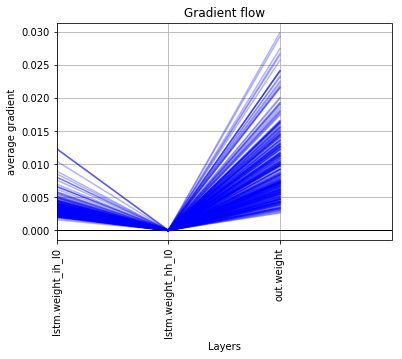

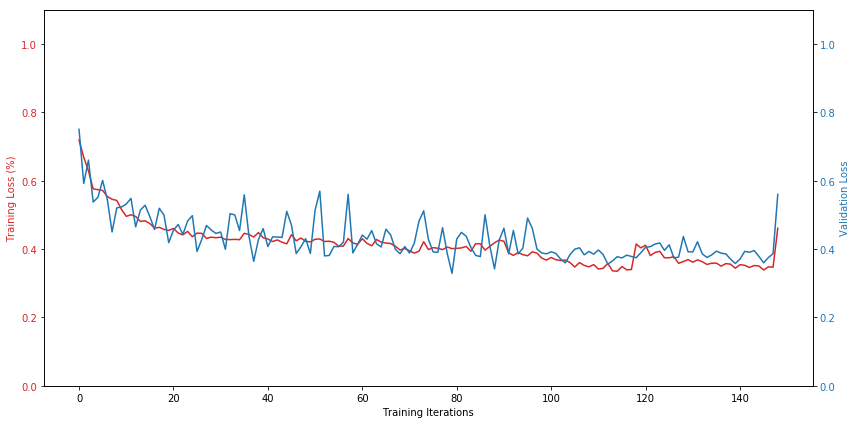

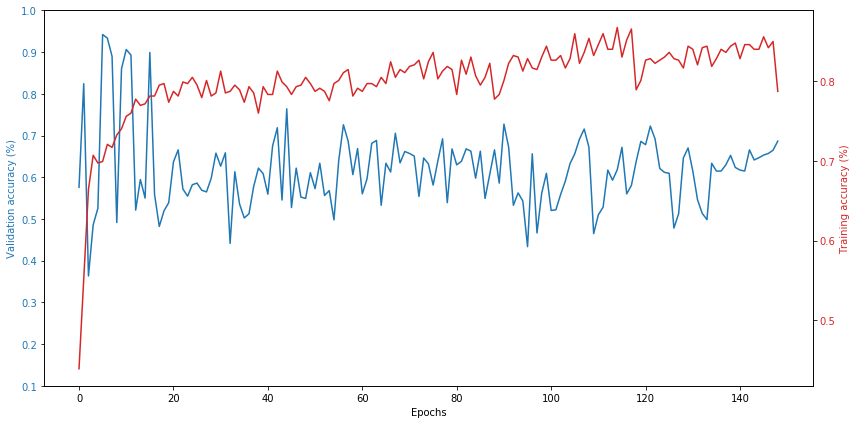

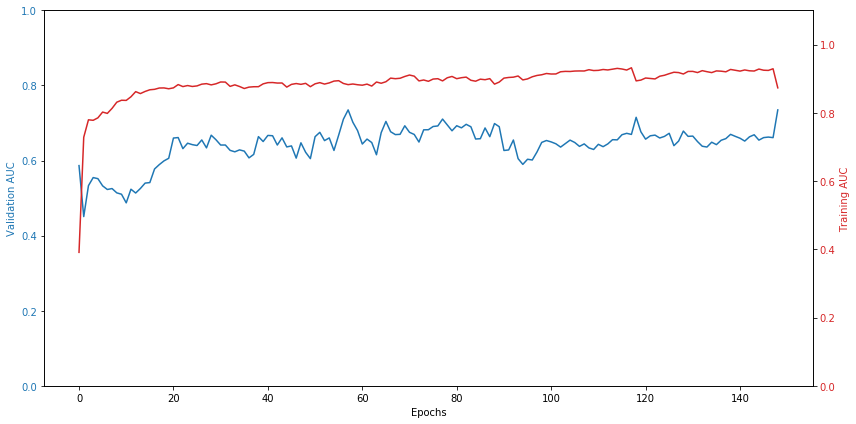

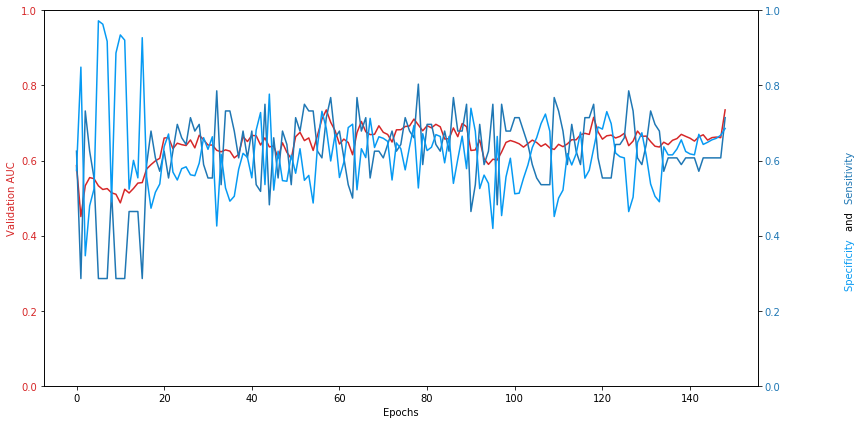


Fold  2
Number of confused training items before SMOTE:  308
Number of not_confused training items before SMOTE:  924
confused items in training set:  924
not_confused items in training set:  924
confused items in validation set:  32
not_confused items in validation set:  1252

Validation confused items:

['126a_V-SortTwoFactors-6-1.pkl', '126a_V-SortTwoFactors-6-2.pkl', '126a_V-SortTwoFactors-6-3.pkl', '126a_V-SortTwoFactors-6-4.pkl', '133a_H-CDV-16-1.pkl', '133a_H-CDV-16-2.pkl', '133a_H-CDV-16-3.pkl', '133a_H-CDV-16-4.pkl', '1b_V-CDV-17-1.pkl', '1b_V-CDV-17-2.pkl', '1b_V-CDV-17-3.pkl', '1b_V-CDV-17-4.pkl', '36a_V-SortTwoFactors-2-1.pkl', '36a_V-SortTwoFactors-2-2.pkl', '36a_V-SortTwoFactors-2-3.pkl', '36a_V-SortTwoFactors-2-4.pkl', '48a_V-SortTwoFactors-12-1.pkl', '48a_V-SortTwoFactors-12-2.pkl', '48a_V-SortTwoFactors-12-3.pkl', '48a_V-SortTwoFactors-12-4.pkl', '63a_H-SortTwoFactors-5-1.pkl', '63a_H-SortTwoFactors-5-2.pkl', '63a_H-SortTwoFactors-5-3.pkl', '63a_H-SortTwoFactors-5-4.p

Training accuracy for epoch:  0.7734375
validation accuracy:  0.67421875
validation loss:  0.5320522487163544
validation recall:  0.6875
validation specificity:  0.6738782051282052
validation AUC:  0.7244591346153846
Epochs without improvement:  1
[epoch: 15, batches:     2] loss: 0.44143 | accuracy: 0.77539
[epoch: 15, batches:     4] loss: 0.44861 | accuracy: 0.77148
[epoch: 15, batches:     6] loss: 0.41860 | accuracy: 0.80469
Training accuracy for epoch:  0.7834821428571429
validation accuracy:  0.73671875
validation loss:  0.501927375793457
validation recall:  0.65625
validation specificity:  0.7387820512820513
validation AUC:  0.7333483573717949
Epochs without improvement:  2
[epoch: 16, batches:     2] loss: 0.43818 | accuracy: 0.79492
[epoch: 16, batches:     4] loss: 0.44490 | accuracy: 0.77734
[epoch: 16, batches:     6] loss: 0.43034 | accuracy: 0.79102
Training accuracy for epoch:  0.7823660714285714
validation accuracy:  0.590625
validation loss:  0.45705472230911254
valid

Training accuracy for epoch:  0.8136160714285714
validation accuracy:  0.59609375
validation loss:  0.43095325827598574
validation recall:  0.75
validation specificity:  0.5921474358974359
validation AUC:  0.6477614182692308
Epochs without improvement:  7
[epoch: 33, batches:     2] loss: 0.38156 | accuracy: 0.82812
[epoch: 33, batches:     4] loss: 0.40169 | accuracy: 0.81445
[epoch: 33, batches:     6] loss: 0.37563 | accuracy: 0.82422
Training accuracy for epoch:  0.8136160714285714
validation accuracy:  0.5578125
validation loss:  0.48141554594039915
validation recall:  0.71875
validation specificity:  0.5536858974358975
validation AUC:  0.6296574519230769
Epochs without improvement:  8
[epoch: 34, batches:     2] loss: 0.39038 | accuracy: 0.81055
[epoch: 34, batches:     4] loss: 0.39053 | accuracy: 0.82227
[epoch: 34, batches:     6] loss: 0.36540 | accuracy: 0.82812
Training accuracy for epoch:  0.8130580357142857
validation accuracy:  0.709375
validation loss:  0.43109238743782

[epoch: 50, batches:     4] loss: 0.39294 | accuracy: 0.79883
[epoch: 50, batches:     6] loss: 0.36540 | accuracy: 0.82812
Training accuracy for epoch:  0.8136160714285714
validation accuracy:  0.5890625
validation loss:  0.44146541357040403
validation recall:  0.875
validation specificity:  0.5817307692307693
validation AUC:  0.7035006009615384
Epochs without improvement:  25
[epoch: 51, batches:     2] loss: 0.37913 | accuracy: 0.83398
[epoch: 51, batches:     4] loss: 0.39263 | accuracy: 0.80273
[epoch: 51, batches:     6] loss: 0.36243 | accuracy: 0.83594
Training accuracy for epoch:  0.8180803571428571
validation accuracy:  0.5859375
validation loss:  0.43221854567527773
validation recall:  0.8125
validation specificity:  0.5801282051282052
validation AUC:  0.703125
Epochs without improvement:  26
[epoch: 52, batches:     2] loss: 0.37527 | accuracy: 0.82812
[epoch: 52, batches:     4] loss: 0.38785 | accuracy: 0.80859
[epoch: 52, batches:     6] loss: 0.36055 | accuracy: 0.83008

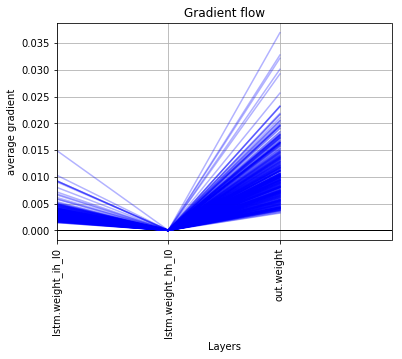

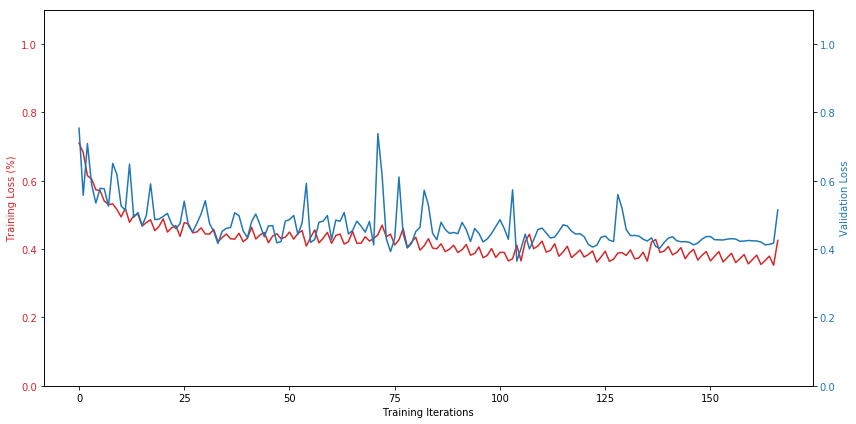

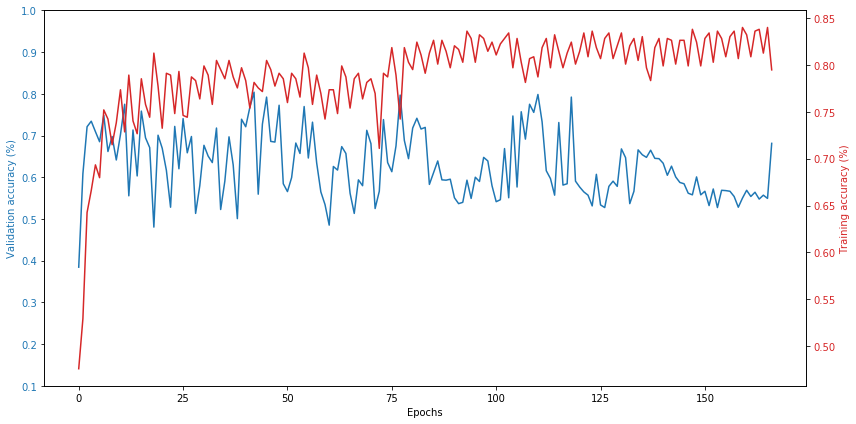

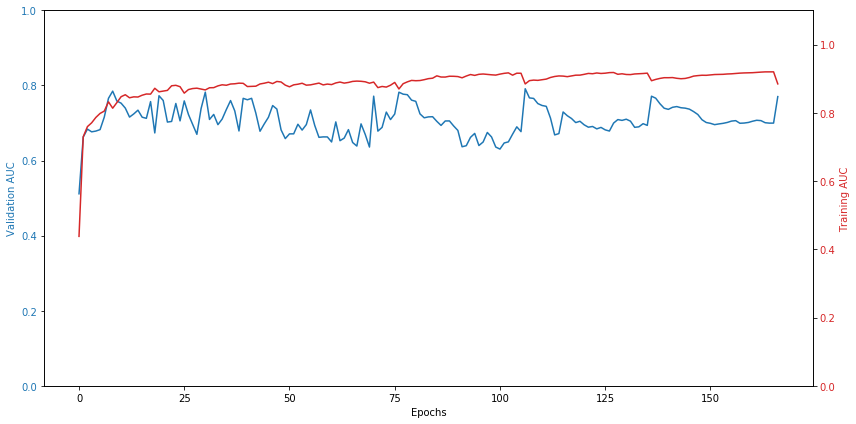

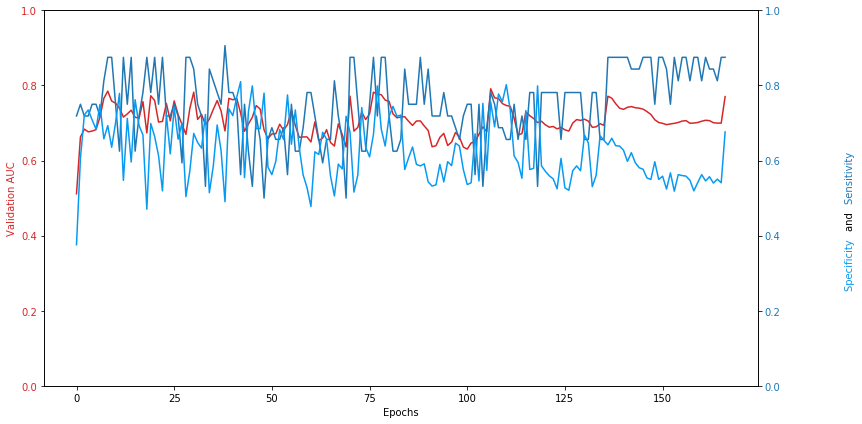


Fold  3
Number of confused training items before SMOTE:  300
Number of not_confused training items before SMOTE:  900
confused items in training set:  900
not_confused items in training set:  900
confused items in validation set:  40
not_confused items in validation set:  1244

Validation confused items:

['111a_H-SortTwoFactors-3-1.pkl', '111a_H-SortTwoFactors-3-2.pkl', '111a_H-SortTwoFactors-3-3.pkl', '111a_H-SortTwoFactors-3-4.pkl', '137a_H-FE-4-1.pkl', '137a_H-FE-4-2.pkl', '137a_H-FE-4-3.pkl', '137a_H-FE-4-4.pkl', '137a_H-SortTwoFactors-2-1.pkl', '137a_H-SortTwoFactors-2-2.pkl', '137a_H-SortTwoFactors-2-3.pkl', '137a_H-SortTwoFactors-2-4.pkl', '137b_V-FE-20-1.pkl', '137b_V-FE-20-2.pkl', '137b_V-FE-20-3.pkl', '137b_V-FE-20-4.pkl', '145b_V-SortTwoFactors-10-1.pkl', '145b_V-SortTwoFactors-10-2.pkl', '145b_V-SortTwoFactors-10-3.pkl', '145b_V-SortTwoFactors-10-4.pkl', '145b_V-SortTwoFactors-24-1.pkl', '145b_V-SortTwoFactors-24-2.pkl', '145b_V-SortTwoFactors-24-3.pkl', '145b_V-SortTwoFa

[epoch: 14, batches:     2] loss: 0.41211 | accuracy: 0.80664
[epoch: 14, batches:     4] loss: 0.40941 | accuracy: 0.81055
[epoch: 14, batches:     6] loss: 0.41520 | accuracy: 0.81250
Training accuracy for epoch:  0.8130580357142857
validation accuracy:  0.56171875
validation loss:  0.5247147560119629
validation recall:  0.7
validation specificity:  0.557258064516129
validation AUC:  0.6485483870967742
Old best AUC:  0.6479435483870968
New best AUC:  0.6485483870967742
New best model found. Saving now.
Epochs without improvement:  0
[epoch: 15, batches:     2] loss: 0.39699 | accuracy: 0.81836
[epoch: 15, batches:     4] loss: 0.39782 | accuracy: 0.82422
[epoch: 15, batches:     6] loss: 0.41213 | accuracy: 0.80664
Training accuracy for epoch:  0.8158482142857143
validation accuracy:  0.53828125
validation loss:  0.5058612942695617
validation recall:  0.7
validation specificity:  0.5330645161290323
validation AUC:  0.6327620967741936
Epochs without improvement:  1
[epoch: 16, batches

[epoch: 31, batches:     6] loss: 0.37637 | accuracy: 0.82422
Training accuracy for epoch:  0.8180803571428571
validation accuracy:  0.5421875
validation loss:  0.5686684906482696
validation recall:  0.825
validation specificity:  0.5330645161290323
validation AUC:  0.6714717741935483
Epochs without improvement:  1
[epoch: 32, batches:     2] loss: 0.35974 | accuracy: 0.84375
[epoch: 32, batches:     4] loss: 0.37089 | accuracy: 0.83398
[epoch: 32, batches:     6] loss: 0.37173 | accuracy: 0.83984
Training accuracy for epoch:  0.8392857142857143
validation accuracy:  0.54453125
validation loss:  0.4549915254116058
validation recall:  0.875
validation specificity:  0.5338709677419354
validation AUC:  0.6956854838709676
Epochs without improvement:  2
[epoch: 33, batches:     2] loss: 0.36618 | accuracy: 0.82617
[epoch: 33, batches:     4] loss: 0.37146 | accuracy: 0.83398
[epoch: 33, batches:     6] loss: 0.37109 | accuracy: 0.81836
Training accuracy for epoch:  0.8270089285714286
valida

Training accuracy for epoch:  0.8431919642857143
validation accuracy:  0.721875
validation loss:  0.46105717420578
validation recall:  0.525
validation specificity:  0.728225806451613
validation AUC:  0.6580241935483871
Epochs without improvement:  8
[epoch: 50, batches:     2] loss: 0.32504 | accuracy: 0.84961
[epoch: 50, batches:     4] loss: 0.34485 | accuracy: 0.84961
[epoch: 50, batches:     6] loss: 0.33542 | accuracy: 0.85156
Training accuracy for epoch:  0.8498883928571429
validation accuracy:  0.7390625
validation loss:  0.5041441559791565
validation recall:  0.525
validation specificity:  0.7459677419354839
validation AUC:  0.6596370967741936
Epochs without improvement:  9
[epoch: 51, batches:     2] loss: 0.31889 | accuracy: 0.86328
[epoch: 51, batches:     4] loss: 0.33775 | accuracy: 0.85156
[epoch: 51, batches:     6] loss: 0.33700 | accuracy: 0.84766
Training accuracy for epoch:  0.8515625
validation accuracy:  0.5953125
validation loss:  0.505753117799759
validation rec

[epoch: 67, batches:     6] loss: 0.33346 | accuracy: 0.85742
Training accuracy for epoch:  0.8515625
validation accuracy:  0.62578125
validation loss:  0.5089687407016754
validation recall:  0.8
validation specificity:  0.6201612903225806
validation AUC:  0.7079435483870967
Epochs without improvement:  26
[epoch: 68, batches:     2] loss: 0.32136 | accuracy: 0.86523
[epoch: 68, batches:     4] loss: 0.34020 | accuracy: 0.84375
[epoch: 68, batches:     6] loss: 0.33364 | accuracy: 0.86523
Training accuracy for epoch:  0.8588169642857143
validation accuracy:  0.615625
validation loss:  0.49900022149086
validation recall:  0.8
validation specificity:  0.6096774193548387
validation AUC:  0.704516129032258
Epochs without improvement:  27
[epoch: 69, batches:     2] loss: 0.31949 | accuracy: 0.86523
[epoch: 69, batches:     4] loss: 0.33879 | accuracy: 0.84766
[epoch: 69, batches:     6] loss: 0.33130 | accuracy: 0.86719
Training accuracy for epoch:  0.859375
validation accuracy:  0.6109375

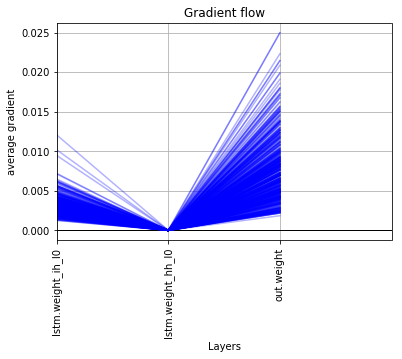

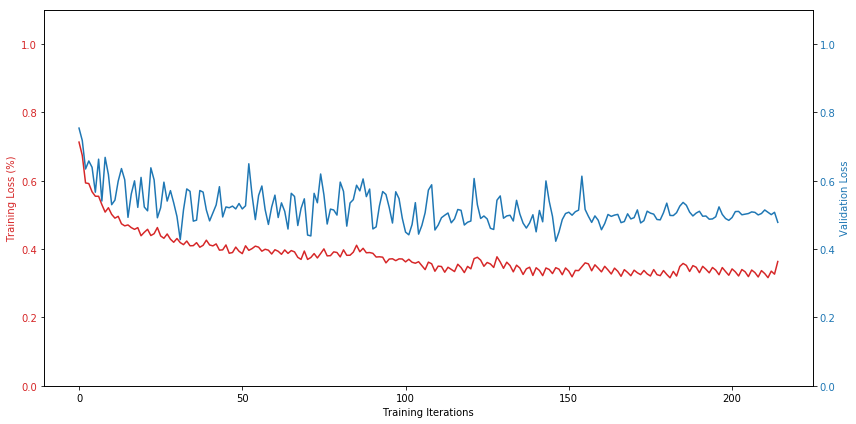

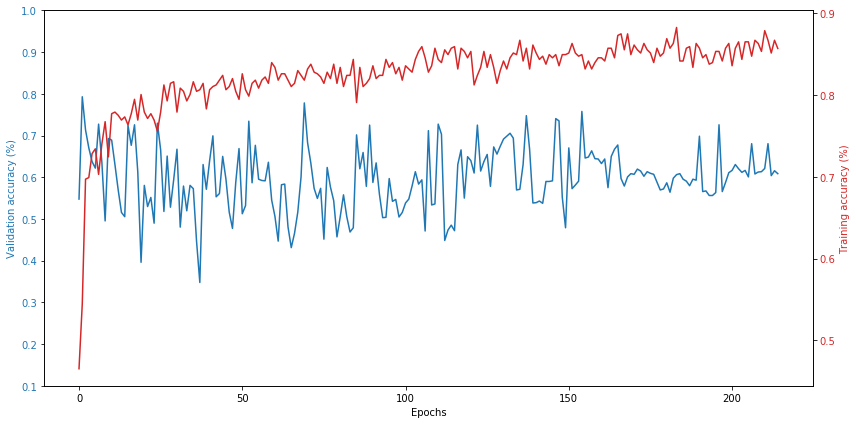

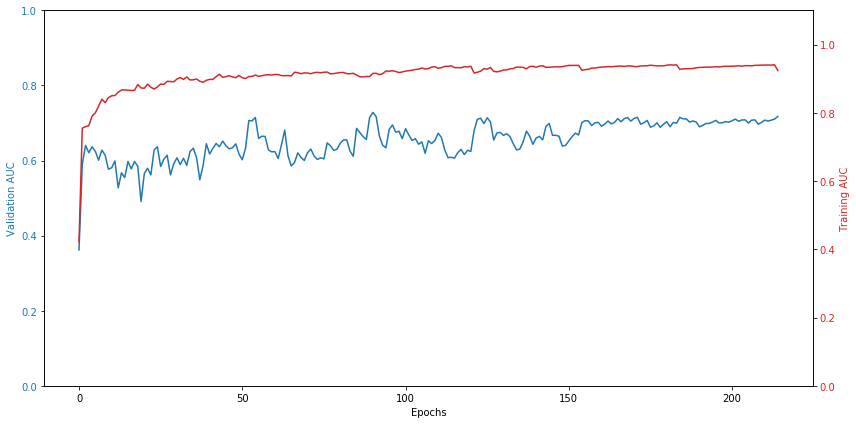

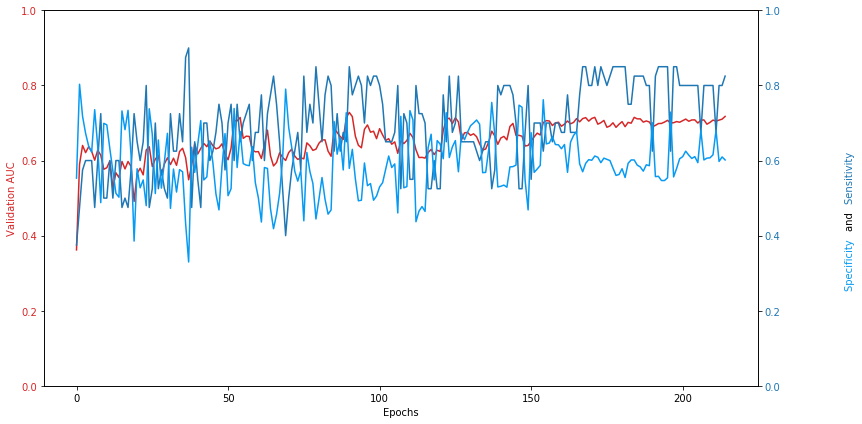


Fold  4
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['58a_V-SortTwoFactors-14-1.pkl', '58a_V-SortTwoFactors-14-2.pkl', '58a_V-SortTwoFactors-14-3.pkl', '58a_V-SortTwoFactors-14-4.pkl', '58a_V-SortTwoFactors-23-1.pkl', '58a_V-SortTwoFactors-23-2.pkl', '58a_V-SortTwoFactors-23-3.pkl', '58a_V-SortTwoFactors-23-4.pkl', '58a_V-SortTwoFactors-6-1.pkl', '58a_V-SortTwoFactors-6-2.pkl', '58a_V-SortTwoFactors-6-3.pkl', '58a_V-SortTwoFactors-6-4.pkl', '86a_V-FE-10-1.pkl', '86a_V-FE-10-2.pkl', '86a_V-FE-10-3.pkl', '86a_V-FE-10-4.pkl', '86a_V-SortTwoFactors-4-1.pkl', '86a_V-SortTwoFactors-4-2.pkl', '86a_V-SortTwoFactors-4-3.pkl', '86a_V-SortTwoFactors-4-4.pkl', '86b_H-CDV-6-1.pkl', '86b_H-CDV-6-2.pkl', '86b_H-CDV-6-3.pkl', '86b_H-CDV-6-4.pkl']

Tr

[epoch: 15, batches:     2] loss: 0.43646 | accuracy: 0.78516
[epoch: 15, batches:     4] loss: 0.43638 | accuracy: 0.79102
[epoch: 15, batches:     6] loss: 0.41701 | accuracy: 0.80664
Training accuracy for epoch:  0.7940848214285714
validation accuracy:  0.709375
validation loss:  0.38421596884727477
validation recall:  0.7916666666666666
validation specificity:  0.7078025477707006
validation AUC:  0.8320395435244161
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.003
New learning rate: 0.0015
Validation AUC:  0.8644174628450105
Validation Loss:  0.44158722162246705
Epochs without improvement:  10
[epoch: 16, batches:     2] loss: 0.49862 | accuracy: 0.74414
[epoch: 16, batches:     4] loss: 0.51163 | accuracy: 0.71484
[epoch: 16, batches:     6] loss: 0.48728 | accuracy: 0.78125
Training accuracy for epoch:  0.7488839285714286
validation accuracy:  0.7234375
validation loss:  0.3768208146095276
validation recall:  0.7916666666666666
val

[epoch: 33, batches:     2] loss: 0.40310 | accuracy: 0.80273
[epoch: 33, batches:     4] loss: 0.40186 | accuracy: 0.82422
[epoch: 33, batches:     6] loss: 0.39658 | accuracy: 0.81250
Training accuracy for epoch:  0.8102678571428571
validation accuracy:  0.7859375
validation loss:  0.4021475315093994
validation recall:  0.625
validation specificity:  0.7890127388535032
validation AUC:  0.7948513800424628
Epochs without improvement:  28
[epoch: 34, batches:     2] loss: 0.39844 | accuracy: 0.81250
[epoch: 34, batches:     4] loss: 0.39439 | accuracy: 0.82227
[epoch: 34, batches:     6] loss: 0.39002 | accuracy: 0.81641
Training accuracy for epoch:  0.8130580357142857
validation accuracy:  0.71640625
validation loss:  0.40974252223968505
validation recall:  0.75
validation specificity:  0.7157643312101911
validation AUC:  0.7945196390658175
Epochs without improvement:  29
[epoch: 35, batches:     2] loss: 0.39401 | accuracy: 0.81641
[epoch: 35, batches:     4] loss: 0.38681 | accuracy:

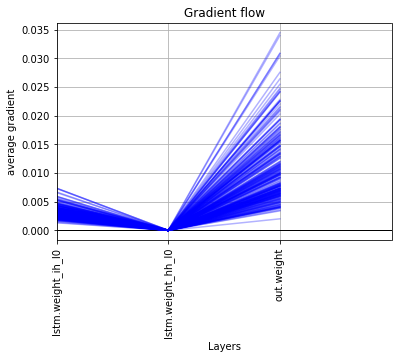

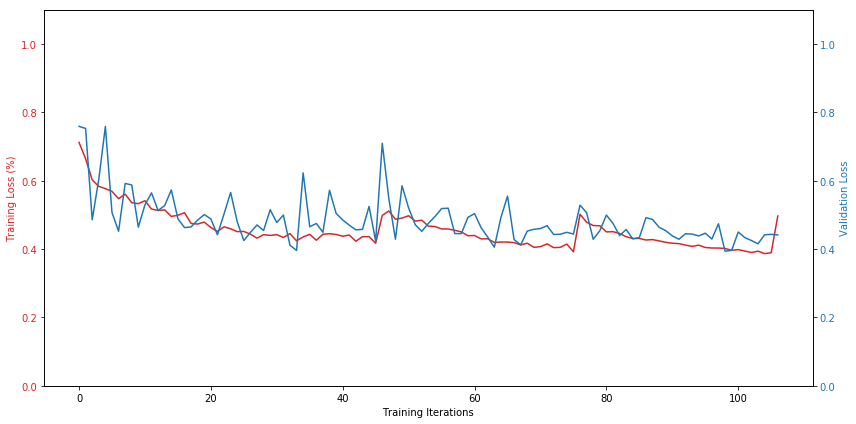

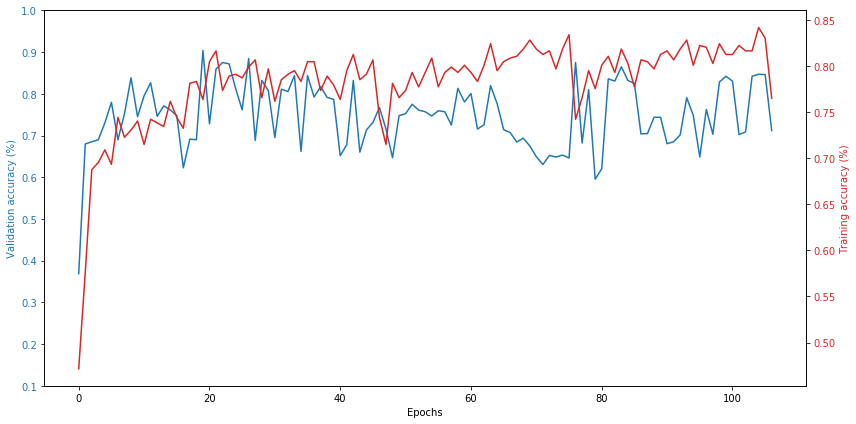

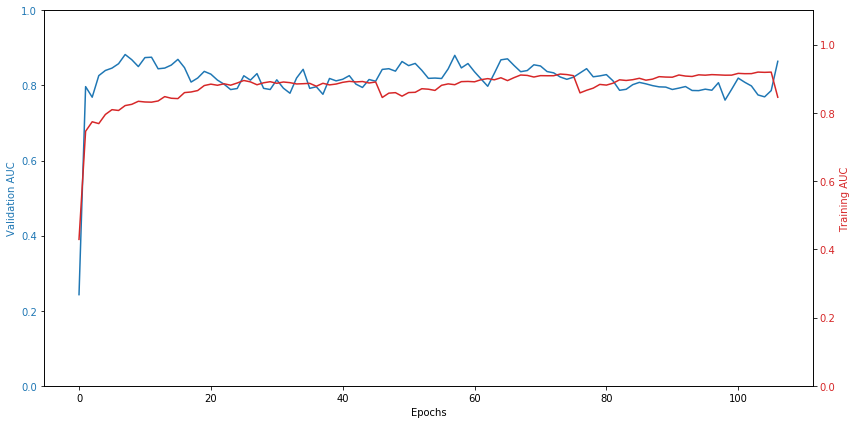

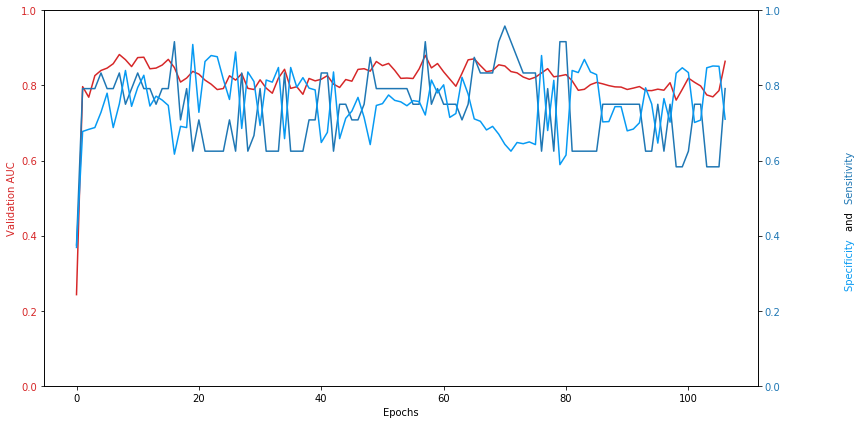


Fold  5
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['122a_V-SortTwoFactors-4-1.pkl', '122a_V-SortTwoFactors-4-2.pkl', '122a_V-SortTwoFactors-4-3.pkl', '122a_V-SortTwoFactors-4-4.pkl', '142a_V-CDV-15-1.pkl', '142a_V-CDV-15-2.pkl', '142a_V-CDV-15-3.pkl', '142a_V-CDV-15-4.pkl', '142b_H-CDV-22-1.pkl', '142b_H-CDV-22-2.pkl', '142b_H-CDV-22-3.pkl', '142b_H-CDV-22-4.pkl', '25a_H-RV-22-1.pkl', '25a_H-RV-22-2.pkl', '25a_H-RV-22-3.pkl', '25a_H-RV-22-4.pkl', '32a_V-SortTwoFactors-11-1.pkl', '32a_V-SortTwoFactors-11-2.pkl', '32a_V-SortTwoFactors-11-3.pkl', '32a_V-SortTwoFactors-11-4.pkl', '82a_V-SortTwoFactors-4-1.pkl', '82a_V-SortTwoFactors-4-2.pkl', '82a_V-SortTwoFactors-4-3.pkl', '82a_V-SortTwoFactors-4-4.pkl']

Training data:  Dataset Datase

[epoch: 15, batches:     2] loss: 0.50065 | accuracy: 0.74805
[epoch: 15, batches:     4] loss: 0.47993 | accuracy: 0.75977
[epoch: 15, batches:     6] loss: 0.48064 | accuracy: 0.77539
Training accuracy for epoch:  0.7645089285714286
validation accuracy:  0.53671875
validation loss:  0.45161709785461424
validation recall:  0.5416666666666666
validation specificity:  0.5366242038216561
validation AUC:  0.5625
Epochs without improvement:  13
[epoch: 16, batches:     2] loss: 0.48492 | accuracy: 0.75977
[epoch: 16, batches:     4] loss: 0.45284 | accuracy: 0.79688
[epoch: 16, batches:     6] loss: 0.46609 | accuracy: 0.79297
Training accuracy for epoch:  0.7868303571428571
validation accuracy:  0.54296875
validation loss:  0.42595402598381044
validation recall:  0.5
validation specificity:  0.5437898089171974
validation AUC:  0.5589171974522293
Epochs without improvement:  14
[epoch: 17, batches:     2] loss: 0.46241 | accuracy: 0.77344
[epoch: 17, batches:     4] loss: 0.44955 | accurac

[epoch: 33, batches:     2] loss: 0.41503 | accuracy: 0.80273
[epoch: 33, batches:     4] loss: 0.39998 | accuracy: 0.82031
[epoch: 33, batches:     6] loss: 0.40974 | accuracy: 0.82422
Training accuracy for epoch:  0.8141741071428571
validation accuracy:  0.6453125
validation loss:  0.3403752207756042
validation recall:  0.5833333333333334
validation specificity:  0.6464968152866242
validation AUC:  0.6240379511677283
Epochs without improvement:  5
[epoch: 34, batches:     2] loss: 0.40292 | accuracy: 0.82227
[epoch: 34, batches:     4] loss: 0.38801 | accuracy: 0.81641
[epoch: 34, batches:     6] loss: 0.39761 | accuracy: 0.82031
Training accuracy for epoch:  0.8197544642857143
validation accuracy:  0.6421875
validation loss:  0.34262081384658816
validation recall:  0.5833333333333334
validation specificity:  0.643312101910828
validation AUC:  0.6265591825902336
Epochs without improvement:  6
[epoch: 35, batches:     2] loss: 0.39839 | accuracy: 0.80859
[epoch: 35, batches:     4] lo

[epoch: 51, batches:     2] loss: 0.37520 | accuracy: 0.81250
[epoch: 51, batches:     4] loss: 0.35616 | accuracy: 0.83789
[epoch: 51, batches:     6] loss: 0.36852 | accuracy: 0.82812
Training accuracy for epoch:  0.8275669642857143
validation accuracy:  0.778125
validation loss:  0.3226465046405792
validation recall:  0.5
validation specificity:  0.7834394904458599
validation AUC:  0.6569134819532909
Old best AUC:  0.6548235138004247
New best AUC:  0.6569134819532909
New best model found. Saving now.
Epochs without improvement:  0
[epoch: 52, batches:     2] loss: 0.36491 | accuracy: 0.83203
[epoch: 52, batches:     4] loss: 0.35445 | accuracy: 0.82812
[epoch: 52, batches:     6] loss: 0.36345 | accuracy: 0.83789
Training accuracy for epoch:  0.8314732142857143
validation accuracy:  0.7484375
validation loss:  0.3275510847568512
validation recall:  0.5
validation specificity:  0.7531847133757962
validation AUC:  0.6406250000000001
Epochs without improvement:  1
[epoch: 53, batches: 

[epoch: 69, batches:     2] loss: 0.34952 | accuracy: 0.83008
[epoch: 69, batches:     4] loss: 0.33653 | accuracy: 0.84180
[epoch: 69, batches:     6] loss: 0.34283 | accuracy: 0.83984
Training accuracy for epoch:  0.8387276785714286
validation accuracy:  0.7609375
validation loss:  0.328557562828064
validation recall:  0.5
validation specificity:  0.7659235668789809
validation AUC:  0.6313362526539279
Epochs without improvement:  13
[epoch: 70, batches:     2] loss: 0.34569 | accuracy: 0.84180
[epoch: 70, batches:     4] loss: 0.33205 | accuracy: 0.84570
[epoch: 70, batches:     6] loss: 0.34359 | accuracy: 0.85547
Training accuracy for epoch:  0.8487723214285714
validation accuracy:  0.76875
validation loss:  0.31401277184486387
validation recall:  0.5
validation specificity:  0.7738853503184714
validation AUC:  0.645203025477707
Epochs without improvement:  14
[epoch: 71, batches:     2] loss: 0.33877 | accuracy: 0.85742
[epoch: 71, batches:     4] loss: 0.33210 | accuracy: 0.85742

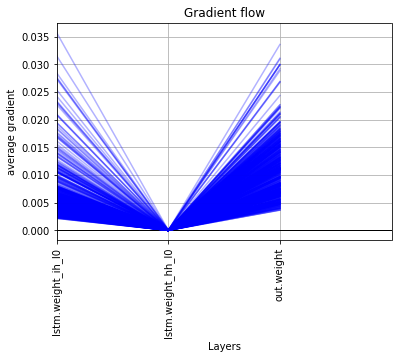

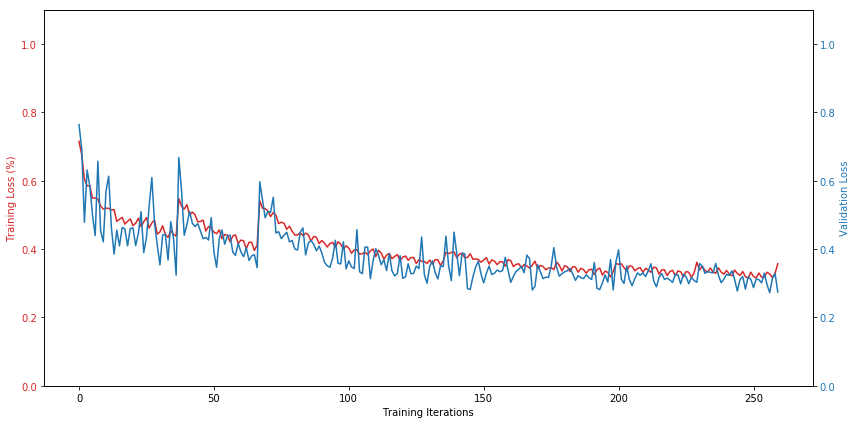

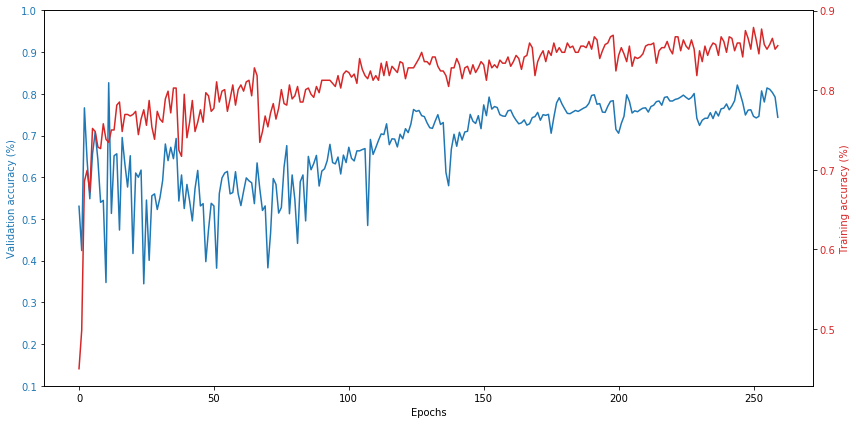

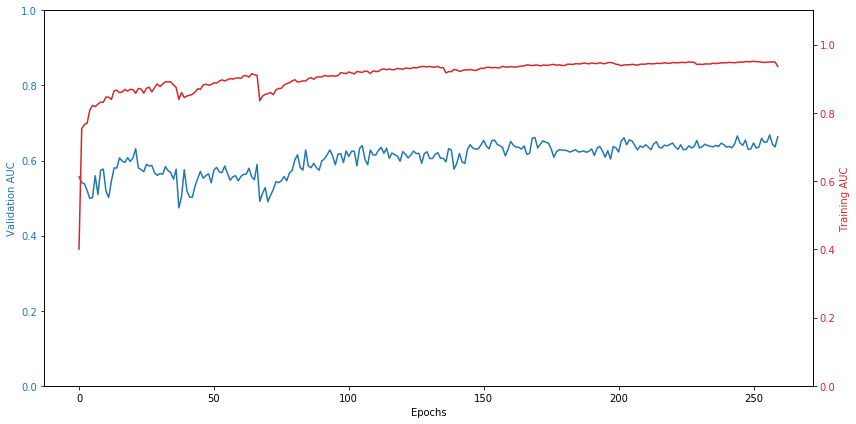

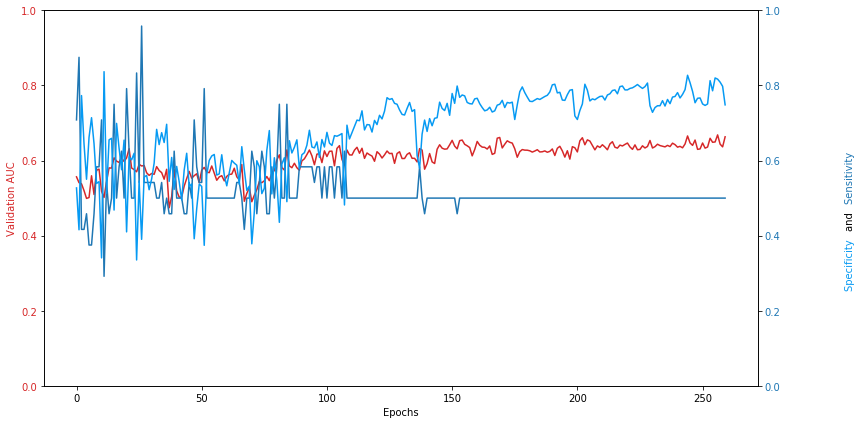


Fold  6
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1272

Validation confused items:

['10a_V-CDV-2-1.pkl', '10a_V-CDV-2-2.pkl', '10a_V-CDV-2-3.pkl', '10a_V-CDV-2-4.pkl', '12b_H-CDV-5-1.pkl', '12b_H-CDV-5-2.pkl', '12b_H-CDV-5-3.pkl', '12b_H-CDV-5-4.pkl', '3a_H-SortTwoFactors-11-1.pkl', '3a_H-SortTwoFactors-11-2.pkl', '3a_H-SortTwoFactors-11-3.pkl', '3a_H-SortTwoFactors-11-4.pkl', '9a_H-SortTwoFactors-12-1.pkl', '9a_H-SortTwoFactors-12-2.pkl', '9a_H-SortTwoFactors-12-3.pkl', '9a_H-SortTwoFactors-12-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1288
    Root Loca

[epoch: 16, batches:     2] loss: 0.45437 | accuracy: 0.75977
[epoch: 16, batches:     4] loss: 0.41782 | accuracy: 0.81055
[epoch: 16, batches:     6] loss: 0.43585 | accuracy: 0.78906
Training accuracy for epoch:  0.7862723214285714
validation accuracy:  0.64453125
validation loss:  0.4586374342441559
validation recall:  0.8125
validation specificity:  0.6424050632911392
validation AUC:  0.7414458069620253
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.003
New learning rate: 0.0015
Validation AUC:  0.8240209651898736
Validation Loss:  0.4315027713775635
Epochs without improvement:  10
[epoch: 17, batches:     2] loss: 0.48842 | accuracy: 0.75000
[epoch: 17, batches:     4] loss: 0.46792 | accuracy: 0.76172
[epoch: 17, batches:     6] loss: 0.46172 | accuracy: 0.78320
Training accuracy for epoch:  0.7650669642857143
validation accuracy:  0.8609375
validation loss:  0.4040748059749603
validation recall:  0.6875
validation specificity:  0.

[epoch: 33, batches:     6] loss: 0.39201 | accuracy: 0.79688
Training accuracy for epoch:  0.8063616071428571
validation accuracy:  0.73359375
validation loss:  0.39839147329330443
validation recall:  0.8125
validation specificity:  0.7325949367088608
validation AUC:  0.8070114715189872
Epochs without improvement:  1
[epoch: 34, batches:     2] loss: 0.41739 | accuracy: 0.80078
[epoch: 34, batches:     4] loss: 0.37877 | accuracy: 0.82812
[epoch: 34, batches:     6] loss: 0.38990 | accuracy: 0.80664
Training accuracy for epoch:  0.8119419642857143
validation accuracy:  0.71484375
validation loss:  0.383637011051178
validation recall:  0.8125
validation specificity:  0.7136075949367089
validation AUC:  0.8010284810126582
Epochs without improvement:  2
[epoch: 35, batches:     2] loss: 0.41477 | accuracy: 0.78320
[epoch: 35, batches:     4] loss: 0.37617 | accuracy: 0.81836
[epoch: 35, batches:     6] loss: 0.37803 | accuracy: 0.80469
Training accuracy for epoch:  0.8046875
validation a

[epoch: 51, batches:     6] loss: 0.35534 | accuracy: 0.83008
Training accuracy for epoch:  0.8225446428571429
validation accuracy:  0.82109375
validation loss:  0.32763549983501433
validation recall:  0.6875
validation specificity:  0.8227848101265823
validation AUC:  0.8127472310126582
Epochs without improvement:  13
[epoch: 52, batches:     2] loss: 0.37540 | accuracy: 0.79688
[epoch: 52, batches:     4] loss: 0.34352 | accuracy: 0.85156
[epoch: 52, batches:     6] loss: 0.35756 | accuracy: 0.82227
Training accuracy for epoch:  0.8225446428571429
validation accuracy:  0.68828125
validation loss:  0.3206749320030212
validation recall:  0.9375
validation specificity:  0.685126582278481
validation AUC:  0.819620253164557
Epochs without improvement:  14
[epoch: 53, batches:     2] loss: 0.37433 | accuracy: 0.81836
[epoch: 53, batches:     4] loss: 0.33780 | accuracy: 0.87305
[epoch: 53, batches:     6] loss: 0.35418 | accuracy: 0.83203
Training accuracy for epoch:  0.8381696428571429
va

[epoch: 69, batches:     6] loss: 0.34754 | accuracy: 0.83398
Training accuracy for epoch:  0.8348214285714286
validation accuracy:  0.71953125
validation loss:  0.34567738473415377
validation recall:  0.875
validation specificity:  0.7175632911392406
validation AUC:  0.8389537183544304
Epochs without improvement:  3
[epoch: 70, batches:     2] loss: 0.36697 | accuracy: 0.80664
[epoch: 70, batches:     4] loss: 0.32401 | accuracy: 0.86719
[epoch: 70, batches:     6] loss: 0.34530 | accuracy: 0.83398
Training accuracy for epoch:  0.8370535714285714
validation accuracy:  0.8
validation loss:  0.3410058915615082
validation recall:  0.75
validation specificity:  0.8006329113924051
validation AUC:  0.838310917721519
Epochs without improvement:  4
[epoch: 71, batches:     2] loss: 0.36507 | accuracy: 0.81250
[epoch: 71, batches:     4] loss: 0.32104 | accuracy: 0.87500
[epoch: 71, batches:     6] loss: 0.34127 | accuracy: 0.83594
Training accuracy for epoch:  0.84375
validation accuracy:  0.

[epoch: 87, batches:     2] loss: 0.37184 | accuracy: 0.81250
[epoch: 87, batches:     4] loss: 0.33018 | accuracy: 0.86328
[epoch: 87, batches:     6] loss: 0.35115 | accuracy: 0.82617
Training accuracy for epoch:  0.8325892857142857
validation accuracy:  0.71953125
validation loss:  0.3659462004899979
validation recall:  0.875
validation specificity:  0.7175632911392406
validation AUC:  0.8339102056962024
Epochs without improvement:  21
[epoch: 88, batches:     2] loss: 0.36829 | accuracy: 0.81250
[epoch: 88, batches:     4] loss: 0.32665 | accuracy: 0.85742
[epoch: 88, batches:     6] loss: 0.34961 | accuracy: 0.83008
Training accuracy for epoch:  0.8348214285714286
validation accuracy:  0.70390625
validation loss:  0.3648558706045151
validation recall:  0.875
validation specificity:  0.7017405063291139
validation AUC:  0.8326740506329114
Epochs without improvement:  22
[epoch: 89, batches:     2] loss: 0.36790 | accuracy: 0.81641
[epoch: 89, batches:     4] loss: 0.32574 | accuracy

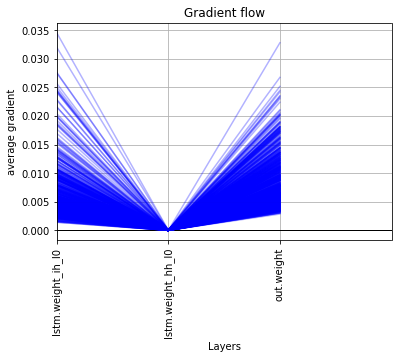

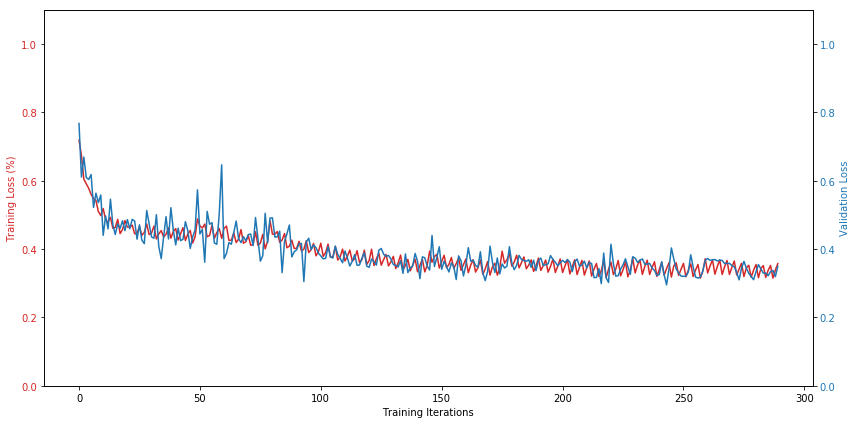

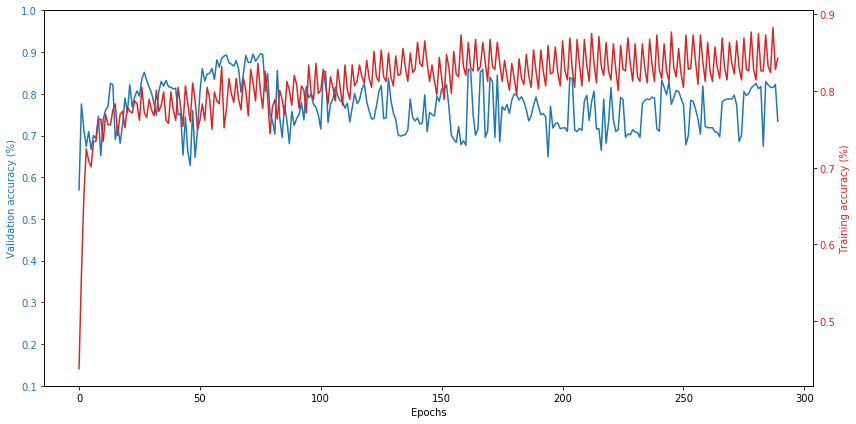

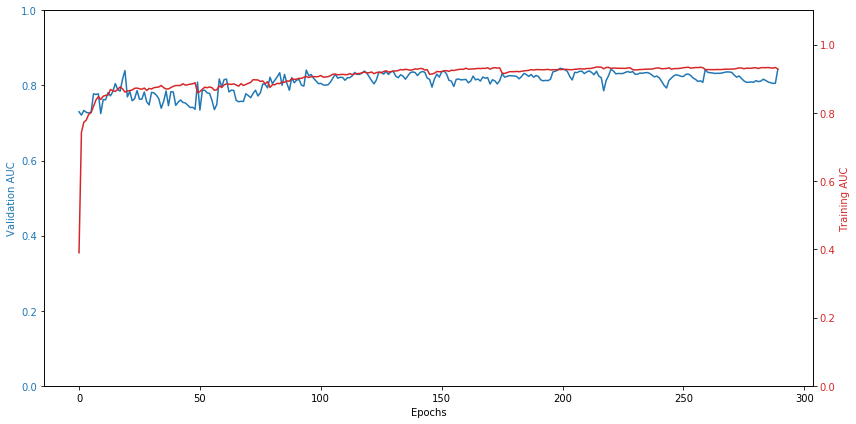

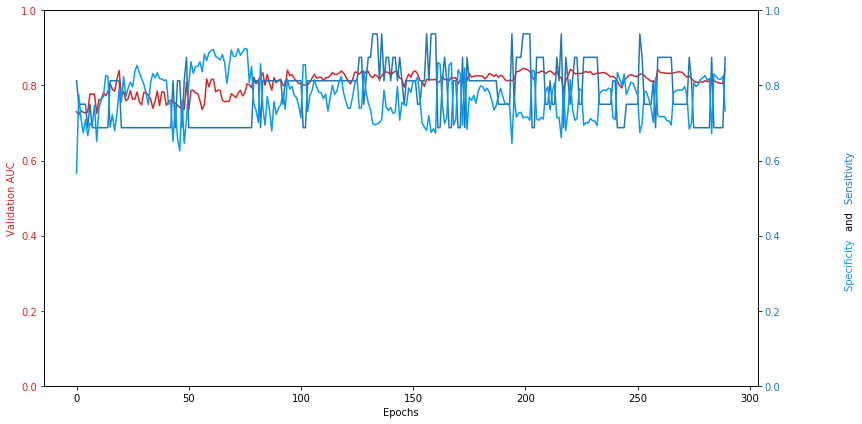


Fold  7
Number of confused training items before SMOTE:  296
Number of not_confused training items before SMOTE:  888
confused items in training set:  888
not_confused items in training set:  888
confused items in validation set:  44
not_confused items in validation set:  1240

Validation confused items:

['105a_H-FE-17-1.pkl', '105a_H-FE-17-2.pkl', '105a_H-FE-17-3.pkl', '105a_H-FE-17-4.pkl', '105a_H-RV-22-1.pkl', '105a_H-RV-22-2.pkl', '105a_H-RV-22-3.pkl', '105a_H-RV-22-4.pkl', '105a_H-RV-8-1.pkl', '105a_H-RV-8-2.pkl', '105a_H-RV-8-3.pkl', '105a_H-RV-8-4.pkl', '105b_V-FE-20-1.pkl', '105b_V-FE-20-2.pkl', '105b_V-FE-20-3.pkl', '105b_V-FE-20-4.pkl', '105b_V-FE-8-1.pkl', '105b_V-FE-8-2.pkl', '105b_V-FE-8-3.pkl', '105b_V-FE-8-4.pkl', '105b_V-RV-5-1.pkl', '105b_V-RV-5-2.pkl', '105b_V-RV-5-3.pkl', '105b_V-RV-5-4.pkl', '134b_H-CDV-15-1.pkl', '134b_H-CDV-15-2.pkl', '134b_H-CDV-15-3.pkl', '134b_H-CDV-15-4.pkl', '134b_H-CDV-4-1.pkl', '134b_H-CDV-4-2.pkl', '134b_H-CDV-4-3.pkl', '134b_H-CDV-4-4.p

[epoch: 14, batches:     2] loss: 0.43172 | accuracy: 0.80078
[epoch: 14, batches:     4] loss: 0.48795 | accuracy: 0.75195
[epoch: 14, batches:     6] loss: 0.42261 | accuracy: 0.79883
Training accuracy for epoch:  0.7838541666666666
validation accuracy:  0.75078125
validation loss:  0.4684633493423462
validation recall:  0.7727272727272727
validation specificity:  0.75
validation AUC:  0.7418726095910562
Old best AUC:  0.7312628714327742
New best AUC:  0.7418726095910562
New best model found. Saving now.
Epochs without improvement:  0
[epoch: 15, batches:     2] loss: 0.43050 | accuracy: 0.78125
[epoch: 15, batches:     4] loss: 0.48692 | accuracy: 0.74023
[epoch: 15, batches:     6] loss: 0.41233 | accuracy: 0.81836
Training accuracy for epoch:  0.7799479166666666
validation accuracy:  0.69296875
validation loss:  0.4328982293605804
validation recall:  0.7954545454545454
validation specificity:  0.6893203883495146
validation AUC:  0.7269601353339217
Epochs without improvement:  1
[e

[epoch: 32, batches:     2] loss: 0.37340 | accuracy: 0.82031
[epoch: 32, batches:     4] loss: 0.42461 | accuracy: 0.80469
[epoch: 32, batches:     6] loss: 0.38206 | accuracy: 0.81055
Training accuracy for epoch:  0.8118489583333334
validation accuracy:  0.70859375
validation loss:  0.4030900001525879
validation recall:  0.75
validation specificity:  0.7071197411003236
validation AUC:  0.71193733451015
Epochs without improvement:  18
[epoch: 33, batches:     2] loss: 0.37026 | accuracy: 0.82617
[epoch: 33, batches:     4] loss: 0.43404 | accuracy: 0.79102
[epoch: 33, batches:     6] loss: 0.36360 | accuracy: 0.84375
Training accuracy for epoch:  0.8203125
validation accuracy:  0.7171875
validation loss:  0.4559095323085785
validation recall:  0.7727272727272727
validation specificity:  0.7152103559870551
validation AUC:  0.7159090909090908
Epochs without improvement:  19
[epoch: 34, batches:     2] loss: 0.36333 | accuracy: 0.83203
[epoch: 34, batches:     4] loss: 0.42027 | accuracy

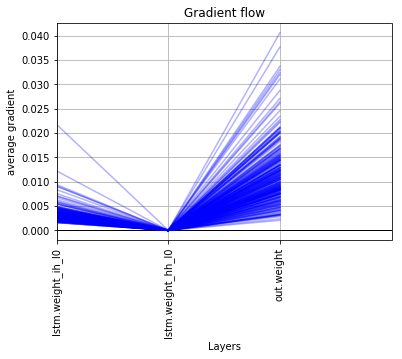

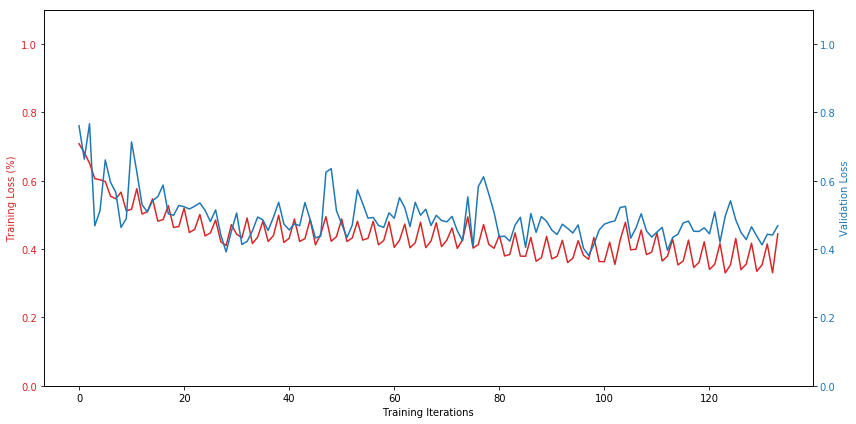

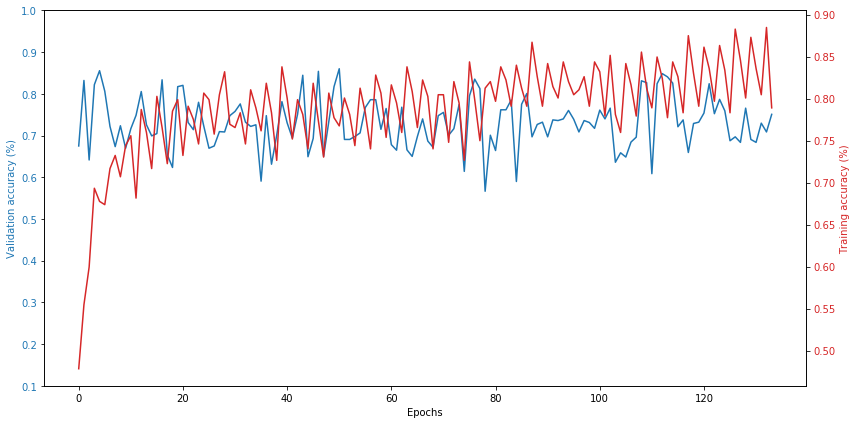

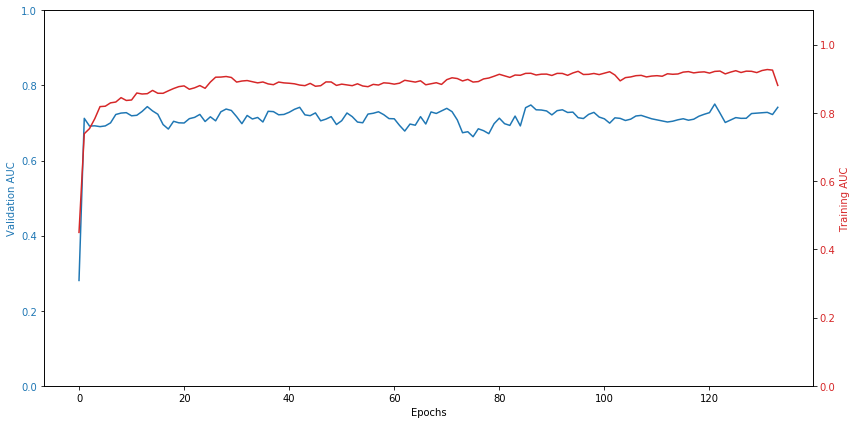

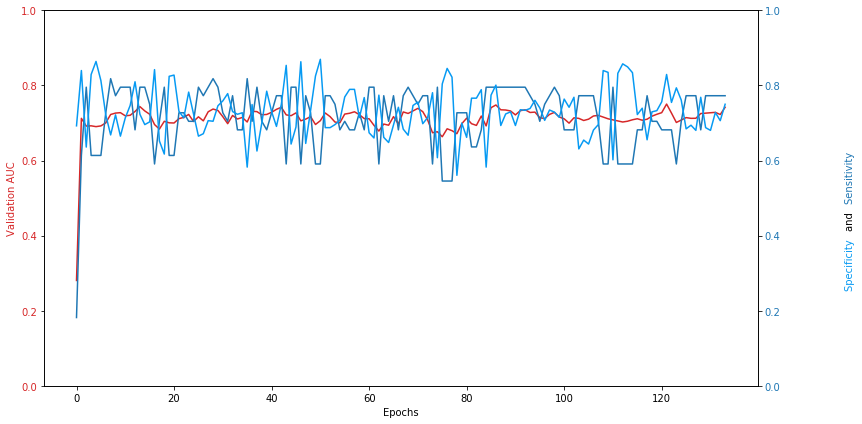


Fold  8
Number of confused training items before SMOTE:  304
Number of not_confused training items before SMOTE:  912
confused items in training set:  912
not_confused items in training set:  912
confused items in validation set:  36
not_confused items in validation set:  1248

Validation confused items:

['121a_H-CDV-9-1.pkl', '121a_H-CDV-9-2.pkl', '121a_H-CDV-9-3.pkl', '121a_H-CDV-9-4.pkl', '121a_H-SortTwoFactors-20-1.pkl', '121a_H-SortTwoFactors-20-2.pkl', '121a_H-SortTwoFactors-20-3.pkl', '121a_H-SortTwoFactors-20-4.pkl', '121b_V-FE-2-1.pkl', '121b_V-FE-2-2.pkl', '121b_V-FE-2-3.pkl', '121b_V-FE-2-4.pkl', '121b_V-SortTwoFactors-11-1.pkl', '121b_V-SortTwoFactors-11-2.pkl', '121b_V-SortTwoFactors-11-3.pkl', '121b_V-SortTwoFactors-11-4.pkl', '129b_V-SortTwoFactors-23-1.pkl', '129b_V-SortTwoFactors-23-2.pkl', '129b_V-SortTwoFactors-23-3.pkl', '129b_V-SortTwoFactors-23-4.pkl', '141a_H-RV-18-1.pkl', '141a_H-RV-18-2.pkl', '141a_H-RV-18-3.pkl', '141a_H-RV-18-4.pkl', '141a_H-SortTwoFactors-

[epoch: 14, batches:     4] loss: 0.46219 | accuracy: 0.77930
[epoch: 14, batches:     6] loss: 0.47308 | accuracy: 0.76953
Training accuracy for epoch:  0.7790178571428571
validation accuracy:  0.5296875
validation loss:  0.5156564831733703
validation recall:  0.5833333333333334
validation specificity:  0.5281350482315113
validation AUC:  0.5638844230082172
Epochs without improvement:  13
[epoch: 15, batches:     2] loss: 0.43745 | accuracy: 0.79688
[epoch: 15, batches:     4] loss: 0.44910 | accuracy: 0.79297
[epoch: 15, batches:     6] loss: 0.46533 | accuracy: 0.77539
Training accuracy for epoch:  0.7912946428571429
validation accuracy:  0.546875
validation loss:  0.5563162267208099
validation recall:  0.5833333333333334
validation specificity:  0.5458199356913184
validation AUC:  0.5476732761700608
Epochs without improvement:  14
[epoch: 16, batches:     2] loss: 0.42946 | accuracy: 0.81836
[epoch: 16, batches:     4] loss: 0.42808 | accuracy: 0.80469
[epoch: 16, batches:     6] l

validation accuracy:  0.559375
validation loss:  0.4980577647686005
validation recall:  0.7777777777777778
validation specificity:  0.5530546623794212
validation AUC:  0.6617541979278314


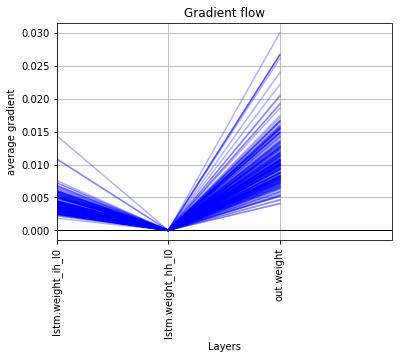

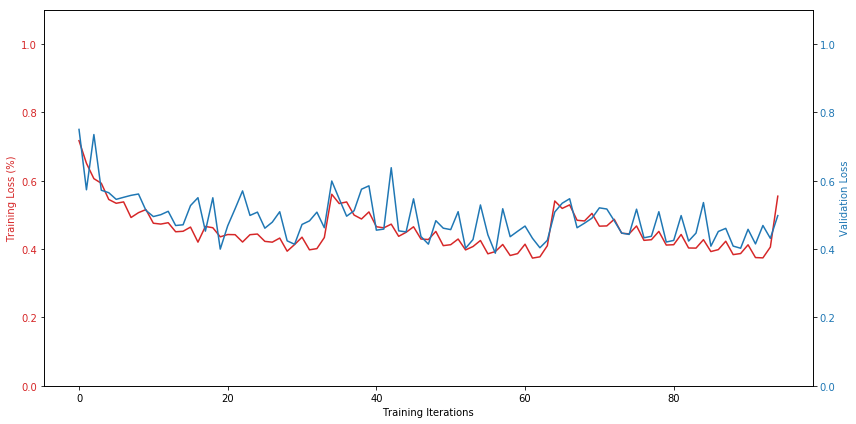

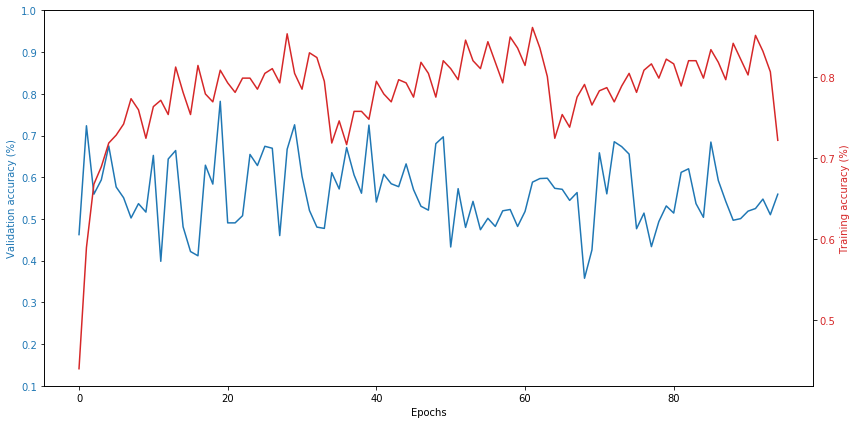

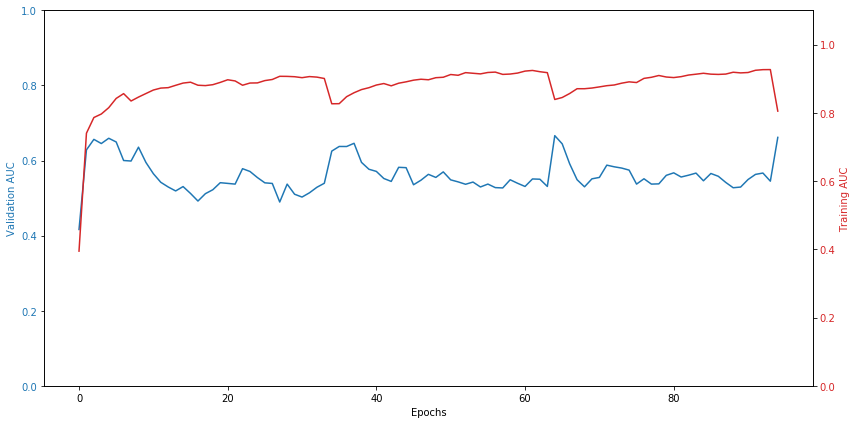

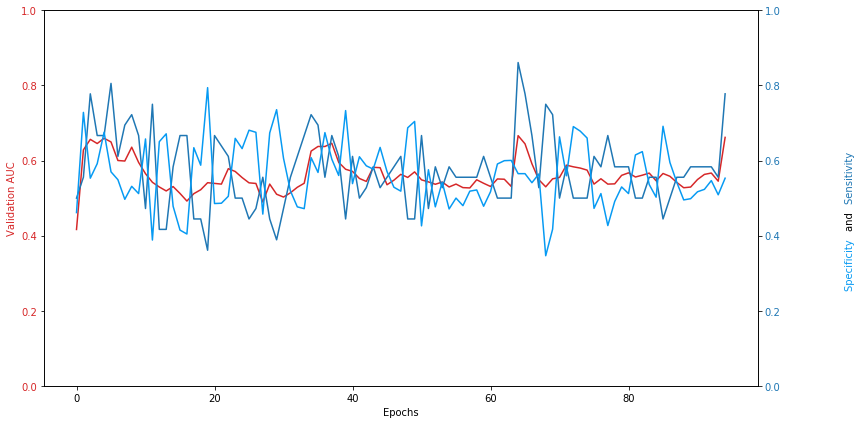


Fold  9
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1268

Validation confused items:

['103a_H-CDV-12-1.pkl', '103a_H-CDV-12-2.pkl', '103a_H-CDV-12-3.pkl', '103a_H-CDV-12-4.pkl', '103a_H-CDV-17-1.pkl', '103a_H-CDV-17-2.pkl', '103a_H-CDV-17-3.pkl', '103a_H-CDV-17-4.pkl', '11a_H-SortTwoFactors-5-1.pkl', '11a_H-SortTwoFactors-5-2.pkl', '11a_H-SortTwoFactors-5-3.pkl', '11a_H-SortTwoFactors-5-4.pkl', '143a_H-CDV-17-1.pkl', '143a_H-CDV-17-2.pkl', '143a_H-CDV-17-3.pkl', '143a_H-CDV-17-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1284
    Root Location: ./dataset/augm

[epoch: 15, batches:     6] loss: 0.47891 | accuracy: 0.76758
Training accuracy for epoch:  0.76171875
validation accuracy:  0.8234375
validation loss:  0.4022641062736511
validation recall:  0.5
validation specificity:  0.8275316455696202
validation AUC:  0.5685818829113924
Epochs without improvement:  12
[epoch: 16, batches:     2] loss: 0.45706 | accuracy: 0.79297
[epoch: 16, batches:     4] loss: 0.48302 | accuracy: 0.77930
[epoch: 16, batches:     6] loss: 0.46403 | accuracy: 0.78516
Training accuracy for epoch:  0.7823660714285714
validation accuracy:  0.803125
validation loss:  0.4011131048202515
validation recall:  0.5
validation specificity:  0.8069620253164557
validation AUC:  0.5805973101265822
Epochs without improvement:  13
[epoch: 17, batches:     2] loss: 0.43726 | accuracy: 0.80078
[epoch: 17, batches:     4] loss: 0.46614 | accuracy: 0.77539
[epoch: 17, batches:     6] loss: 0.45963 | accuracy: 0.77148
Training accuracy for epoch:  0.7784598214285714
validation accurac

validation accuracy:  0.81875
validation loss:  0.40465072393417356
validation recall:  0.5
validation specificity:  0.8227848101265823
validation AUC:  0.6452729430379747


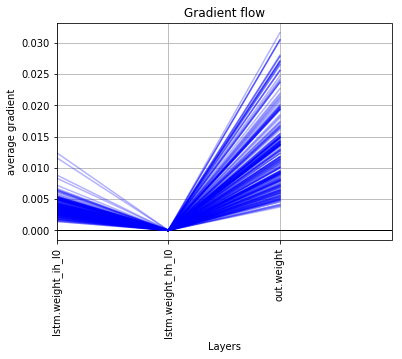

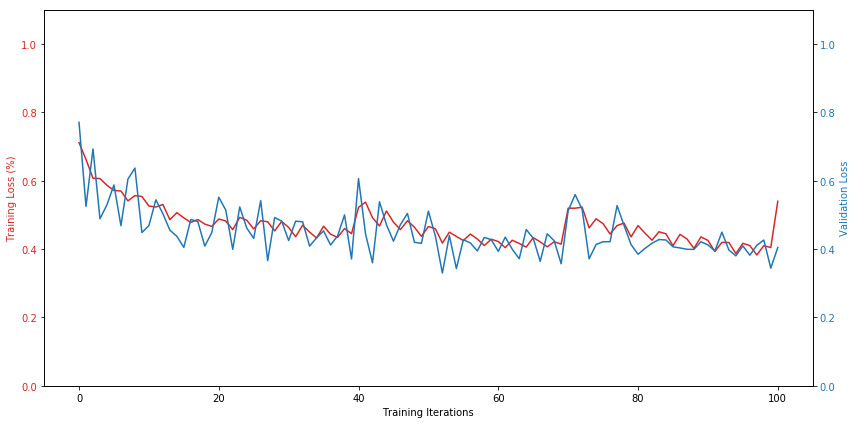

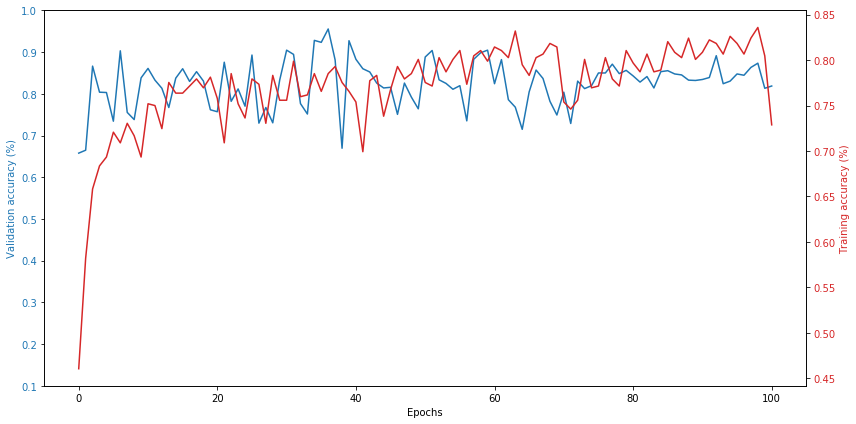

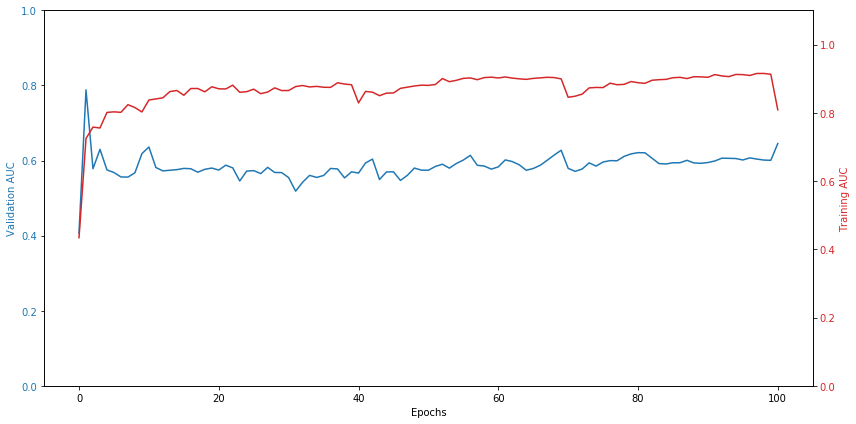

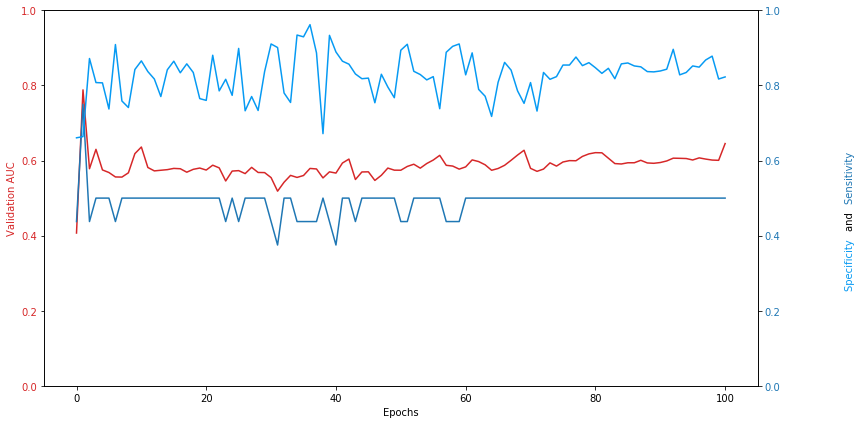


Fold  10
Number of confused training items before SMOTE:  288
Number of not_confused training items before SMOTE:  864
confused items in training set:  864
not_confused items in training set:  864
confused items in validation set:  52
not_confused items in validation set:  1228

Validation confused items:

['112a_V-SortTwoFactors-5-1.pkl', '112a_V-SortTwoFactors-5-2.pkl', '112a_V-SortTwoFactors-5-3.pkl', '112a_V-SortTwoFactors-5-4.pkl', '114a_V-SortTwoFactors-12-1.pkl', '114a_V-SortTwoFactors-12-2.pkl', '114a_V-SortTwoFactors-12-3.pkl', '114a_V-SortTwoFactors-12-4.pkl', '130a_V-RV-10-1.pkl', '130a_V-RV-10-2.pkl', '130a_V-RV-10-3.pkl', '130a_V-RV-10-4.pkl', '35a_H-SortTwoFactors-15-1.pkl', '35a_H-SortTwoFactors-15-2.pkl', '35a_H-SortTwoFactors-15-3.pkl', '35a_H-SortTwoFactors-15-4.pkl', '35a_H-SortTwoFactors-22-1.pkl', '35a_H-SortTwoFactors-22-2.pkl', '35a_H-SortTwoFactors-22-3.pkl', '35a_H-SortTwoFactors-22-4.pkl', '35a_H-SortTwoFactors-4-1.pkl', '35a_H-SortTwoFactors-4-2.pkl', '35a_H

Training accuracy for epoch:  0.7975260416666666
validation accuracy:  0.7703125
validation loss:  0.47041821479797363
validation recall:  0.7307692307692307
validation specificity:  0.7719869706840391
validation AUC:  0.8332811325482334
Epochs without improvement:  6
[epoch: 13, batches:     2] loss: 0.45569 | accuracy: 0.81055
[epoch: 13, batches:     4] loss: 0.45468 | accuracy: 0.78516
[epoch: 13, batches:     6] loss: 0.45144 | accuracy: 0.78906
Training accuracy for epoch:  0.794921875
validation accuracy:  0.86875
validation loss:  0.32879621982574464
validation recall:  0.7884615384615384
validation specificity:  0.8721498371335505
validation AUC:  0.870646454522676
Epochs without improvement:  7
[epoch: 14, batches:     2] loss: 0.46929 | accuracy: 0.78125
[epoch: 14, batches:     4] loss: 0.46796 | accuracy: 0.75195
[epoch: 14, batches:     6] loss: 0.45193 | accuracy: 0.78320
Training accuracy for epoch:  0.7721354166666666
validation accuracy:  0.765625
validation loss:  0.

[epoch: 30, batches:     2] loss: 0.42845 | accuracy: 0.83203
[epoch: 30, batches:     4] loss: 0.43403 | accuracy: 0.80469
[epoch: 30, batches:     6] loss: 0.41205 | accuracy: 0.82812
Training accuracy for epoch:  0.8216145833333334
validation accuracy:  0.7078125
validation loss:  0.4082680821418762
validation recall:  0.7884615384615384
validation specificity:  0.7043973941368078
validation AUC:  0.826374968679529
Epochs without improvement:  24
[epoch: 31, batches:     2] loss: 0.42341 | accuracy: 0.83984
[epoch: 31, batches:     4] loss: 0.42602 | accuracy: 0.80859
[epoch: 31, batches:     6] loss: 0.40032 | accuracy: 0.83008
Training accuracy for epoch:  0.826171875
validation accuracy:  0.796875
validation loss:  0.34996519088745115
validation recall:  0.7692307692307693
validation specificity:  0.7980456026058632
validation AUC:  0.8281289150588825
Epochs without improvement:  25
[epoch: 32, batches:     2] loss: 0.41878 | accuracy: 0.83594
[epoch: 32, batches:     4] loss: 0.

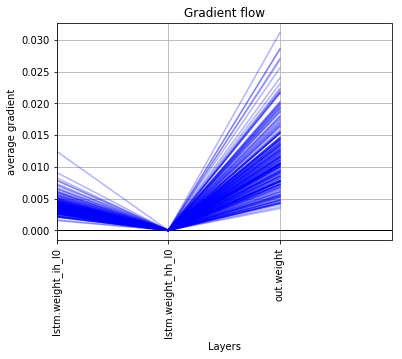

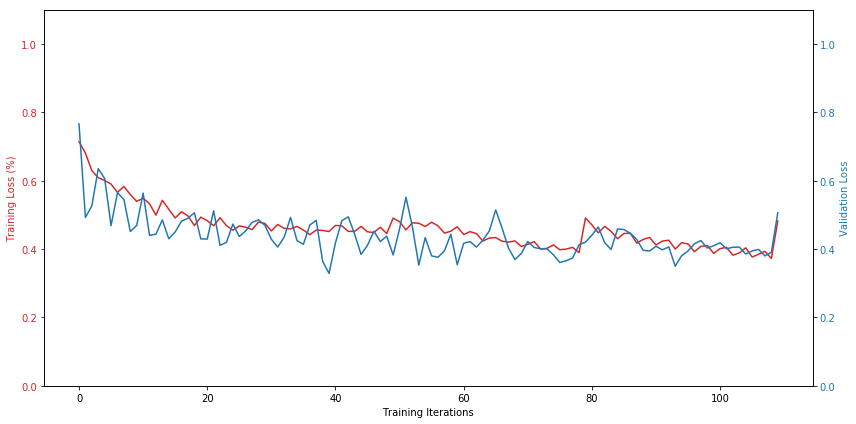

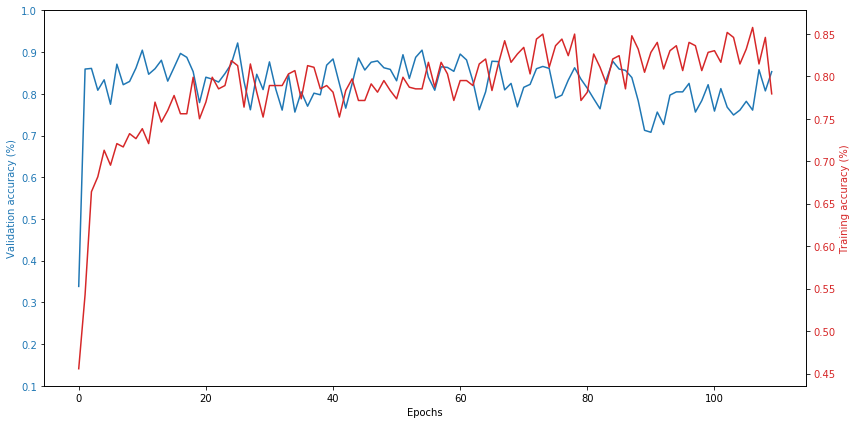

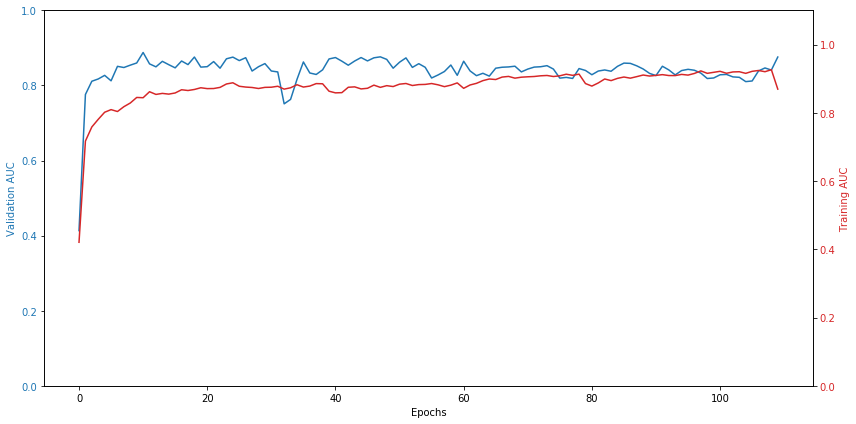

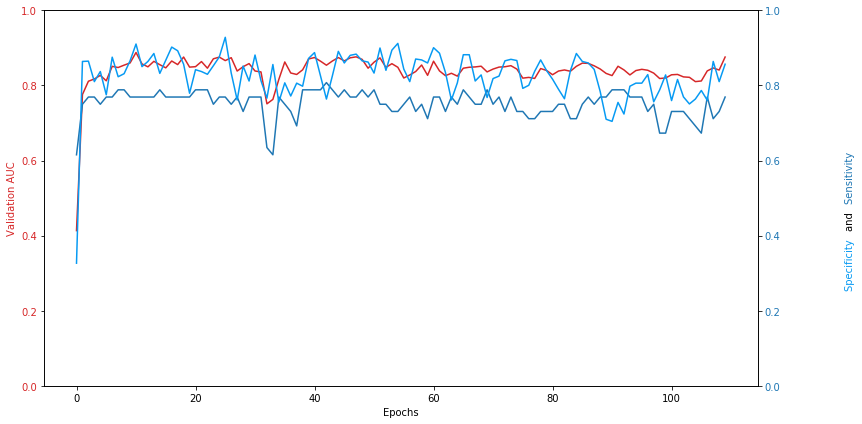


10-fold CV accuracy: 0.714844
10-fold CV sensitivity: 0.740069 
10-fold CV specificity: 0.713706 
10-fold CV AUC: 0.751788 


([0.68671875,
  0.68125,
  0.60859375,
  0.71171875,
  0.74375,
  0.734375,
  0.75078125,
  0.559375,
  0.81875,
  0.853125],
 [0.7142857142857143,
  0.875,
  0.825,
  0.7916666666666666,
  0.5,
  0.875,
  0.7727272727272727,
  0.7777777777777778,
  0.5,
  0.7692307692307693],
 [0.6854575163398693,
  0.6762820512820513,
  0.6016129032258064,
  0.7101910828025477,
  0.7484076433121019,
  0.7325949367088608,
  0.75,
  0.5530546623794212,
  0.8227848101265823,
  0.8566775244299675],
 [0.7349439775910365,
  0.7703575721153846,
  0.7175806451612903,
  0.8644174628450105,
  0.6632497346072187,
  0.8426621835443038,
  0.7418726095910562,
  0.6617541979278314,
  0.6452729430379747,
  0.8757673515409672])

In [13]:
np.random.seed(MANUAL_SEED)
random.seed(MANUAL_SEED)
torch.manual_seed(MANUAL_SEED)

cross_validate(model_type='lstm',
                   folds=10,
                   epochs=300,
                   criterion_type='NLLLoss',
                   optimizer_type='Adam',
                   confused_path='./dataset/augmented/confused_highly_valid/',
                   not_confused_path='./dataset/augmented/not_confused_highly_valid/',
                   print_every=2,
                   plot_every=2,
                   hidden_size=256,
                   num_layers=1,
                   early_stopping=True,
                   early_stopping_patience=30,
                   rate_decay=True,
                   rate_decay_patience=10,
                   initial_learning_rate=0.003,
                   verbose=True)

## GRU CV:


Fold  1
Number of confused training items before SMOTE:  284
Number of not_confused training items before SMOTE:  852
confused items in training set:  852
not_confused items in training set:  852
confused items in validation set:  56
not_confused items in validation set:  1228

Validation confused items:

['131a_H-CDV-5-1.pkl', '131a_H-CDV-5-2.pkl', '131a_H-CDV-5-3.pkl', '131a_H-CDV-5-4.pkl', '131a_H-SortTwoFactors-12-1.pkl', '131a_H-SortTwoFactors-12-2.pkl', '131a_H-SortTwoFactors-12-3.pkl', '131a_H-SortTwoFactors-12-4.pkl', '131b_V-SortTwoFactors-21-1.pkl', '131b_V-SortTwoFactors-21-2.pkl', '131b_V-SortTwoFactors-21-3.pkl', '131b_V-SortTwoFactors-21-4.pkl', '132a_V-CDV-2-1.pkl', '132a_V-CDV-2-2.pkl', '132a_V-CDV-2-3.pkl', '132a_V-CDV-2-4.pkl', '132a_V-SortOverall-21-1.pkl', '132a_V-SortOverall-21-2.pkl', '132a_V-SortOverall-21-3.pkl', '132a_V-SortOverall-21-4.pkl', '132a_V-SortOverall-9-1.pkl', '132a_V-SortOverall-9-2.pkl', '132a_V-SortOverall-9-3.pkl', '132a_V-SortOverall-9-4.pkl',

[epoch: 12, batches:     4] loss: 0.43871 | accuracy: 0.78125
[epoch: 12, batches:     6] loss: 0.41954 | accuracy: 0.79297
Training accuracy for epoch:  0.7962239583333334
validation accuracy:  0.53203125
validation loss:  0.3804463386535645
validation recall:  0.7142857142857143
validation specificity:  0.5236928104575164
validation AUC:  0.6378676470588236
Epochs without improvement:  2
[epoch: 13, batches:     2] loss: 0.40359 | accuracy: 0.81055
[epoch: 13, batches:     4] loss: 0.40958 | accuracy: 0.80078
[epoch: 13, batches:     6] loss: 0.42009 | accuracy: 0.78711
Training accuracy for epoch:  0.7994791666666666
validation accuracy:  0.55859375
validation loss:  0.44170438051223754
validation recall:  0.6964285714285714
validation specificity:  0.5522875816993464
validation AUC:  0.6340598739495799
Epochs without improvement:  3
[epoch: 14, batches:     2] loss: 0.41776 | accuracy: 0.81445
[epoch: 14, batches:     4] loss: 0.41851 | accuracy: 0.78711
[epoch: 14, batches:     6]

[epoch: 30, batches:     2] loss: 0.35320 | accuracy: 0.83984
[epoch: 30, batches:     4] loss: 0.34279 | accuracy: 0.83008
[epoch: 30, batches:     6] loss: 0.34715 | accuracy: 0.84570
Training accuracy for epoch:  0.8385416666666666
validation accuracy:  0.69140625
validation loss:  0.40193251967430116
validation recall:  0.5714285714285714
validation specificity:  0.6968954248366013
validation AUC:  0.6567022642390289
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.0015
New learning rate: 0.00075
Validation AUC:  0.6983251633986928
Validation Loss:  0.5269626438617706
Epochs without improvement:  20
[epoch: 31, batches:     2] loss: 0.42478 | accuracy: 0.81641
[epoch: 31, batches:     4] loss: 0.41888 | accuracy: 0.78906
[epoch: 31, batches:     6] loss: 0.40674 | accuracy: 0.79883
Training accuracy for epoch:  0.8014322916666666
validation accuracy:  0.62265625
validation loss:  0.44907077550888064
validation recall:  0.714285714285714

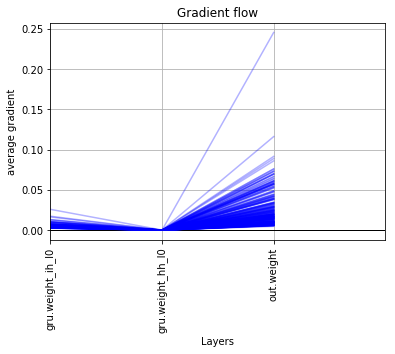

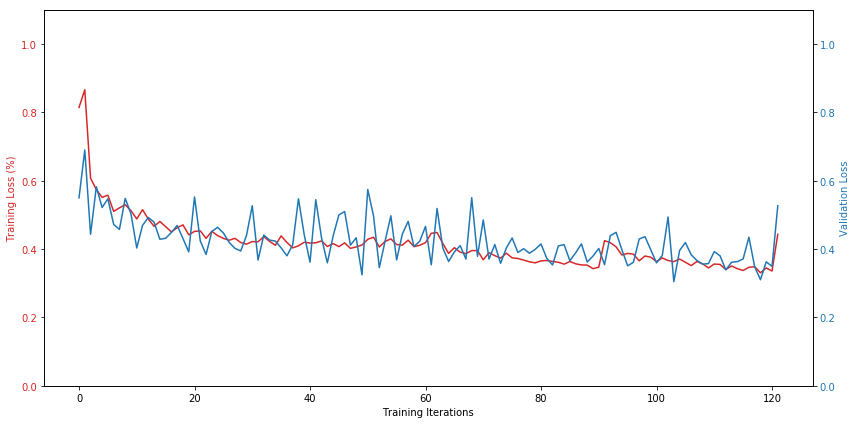

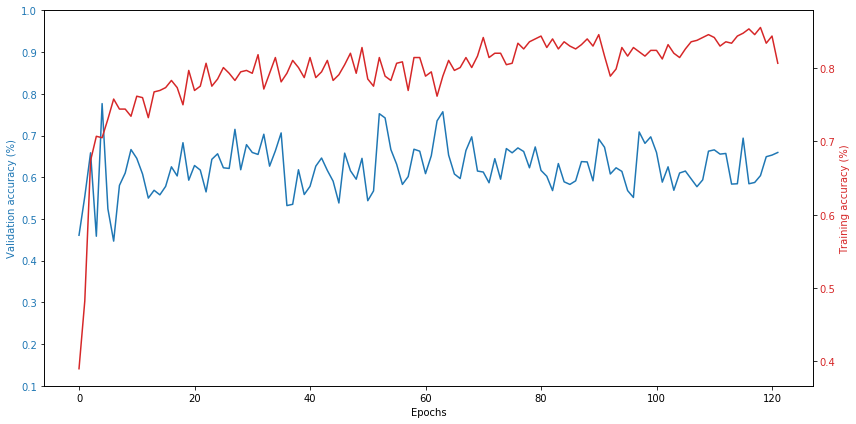

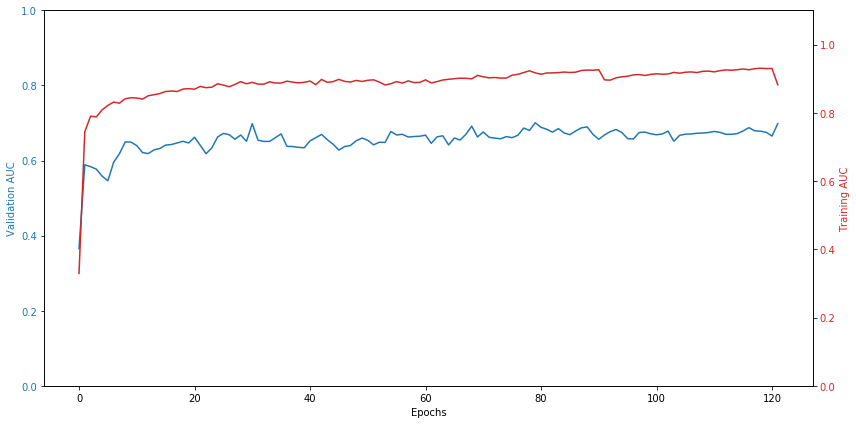

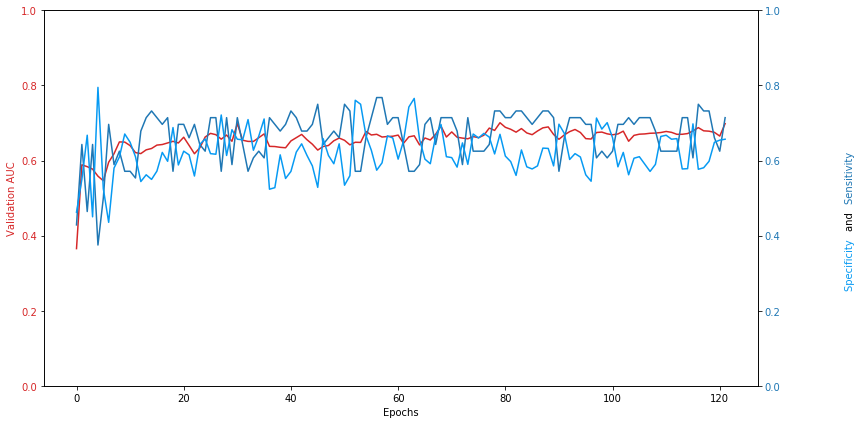


Fold  2
Number of confused training items before SMOTE:  308
Number of not_confused training items before SMOTE:  924
confused items in training set:  924
not_confused items in training set:  924
confused items in validation set:  32
not_confused items in validation set:  1252

Validation confused items:

['126a_V-SortTwoFactors-6-1.pkl', '126a_V-SortTwoFactors-6-2.pkl', '126a_V-SortTwoFactors-6-3.pkl', '126a_V-SortTwoFactors-6-4.pkl', '133a_H-CDV-16-1.pkl', '133a_H-CDV-16-2.pkl', '133a_H-CDV-16-3.pkl', '133a_H-CDV-16-4.pkl', '1b_V-CDV-17-1.pkl', '1b_V-CDV-17-2.pkl', '1b_V-CDV-17-3.pkl', '1b_V-CDV-17-4.pkl', '36a_V-SortTwoFactors-2-1.pkl', '36a_V-SortTwoFactors-2-2.pkl', '36a_V-SortTwoFactors-2-3.pkl', '36a_V-SortTwoFactors-2-4.pkl', '48a_V-SortTwoFactors-12-1.pkl', '48a_V-SortTwoFactors-12-2.pkl', '48a_V-SortTwoFactors-12-3.pkl', '48a_V-SortTwoFactors-12-4.pkl', '63a_H-SortTwoFactors-5-1.pkl', '63a_H-SortTwoFactors-5-2.pkl', '63a_H-SortTwoFactors-5-3.pkl', '63a_H-SortTwoFactors-5-4.p

Training accuracy for epoch:  0.7723214285714286
validation accuracy:  0.62109375
validation loss:  0.5995650887489319
validation recall:  0.71875
validation specificity:  0.6185897435897436
validation AUC:  0.7249599358974359
Epochs without improvement:  12
[epoch: 15, batches:     2] loss: 0.46095 | accuracy: 0.76953
[epoch: 15, batches:     4] loss: 0.46915 | accuracy: 0.76367
[epoch: 15, batches:     6] loss: 0.43889 | accuracy: 0.78906
Training accuracy for epoch:  0.7734375
validation accuracy:  0.7546875
validation loss:  0.4745997369289398
validation recall:  0.59375
validation specificity:  0.7588141025641025
validation AUC:  0.7056039663461537
Epochs without improvement:  13
[epoch: 16, batches:     2] loss: 0.43198 | accuracy: 0.78516
[epoch: 16, batches:     4] loss: 0.45235 | accuracy: 0.76562
[epoch: 16, batches:     6] loss: 0.42640 | accuracy: 0.79688
Training accuracy for epoch:  0.7840401785714286
validation accuracy:  0.8390625
validation loss:  0.4708365261554718
va

validation accuracy:  0.76015625
validation loss:  0.5237168669700623
validation recall:  0.71875
validation specificity:  0.7612179487179487
validation AUC:  0.7650991586538461


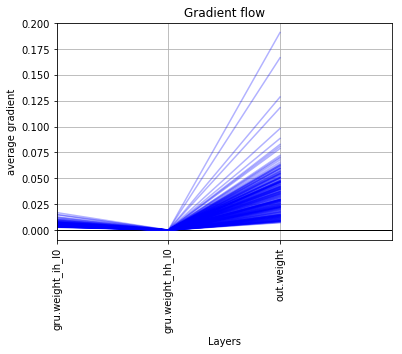

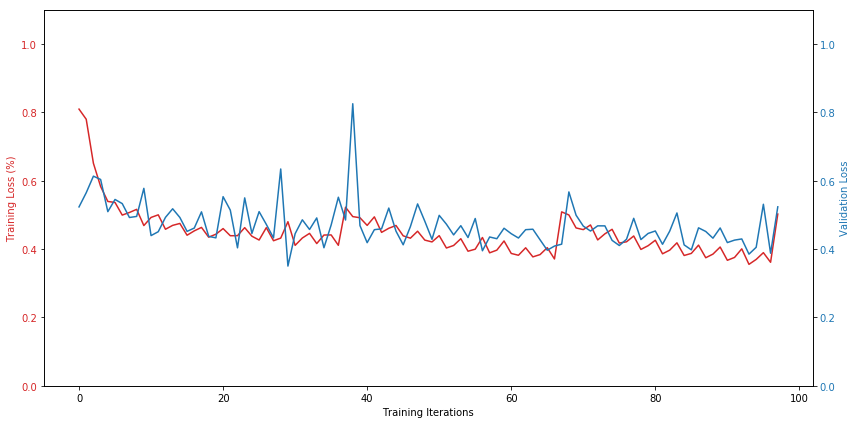

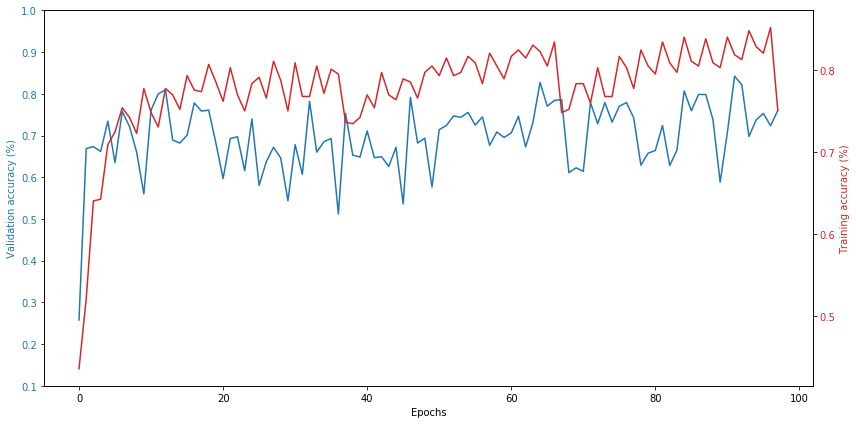

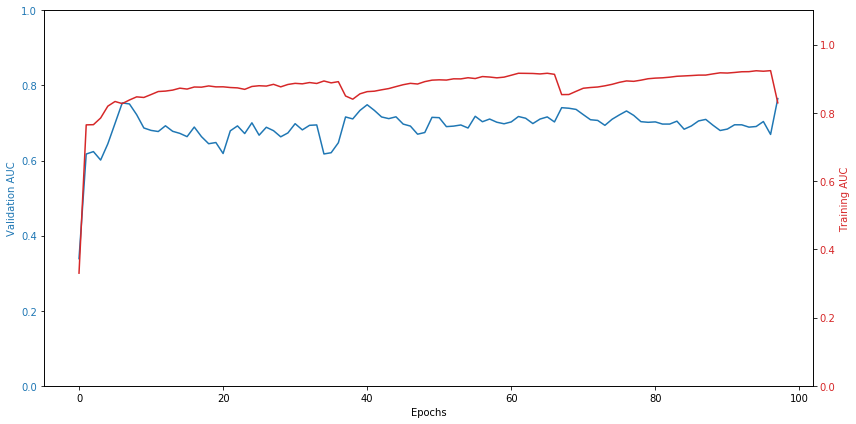

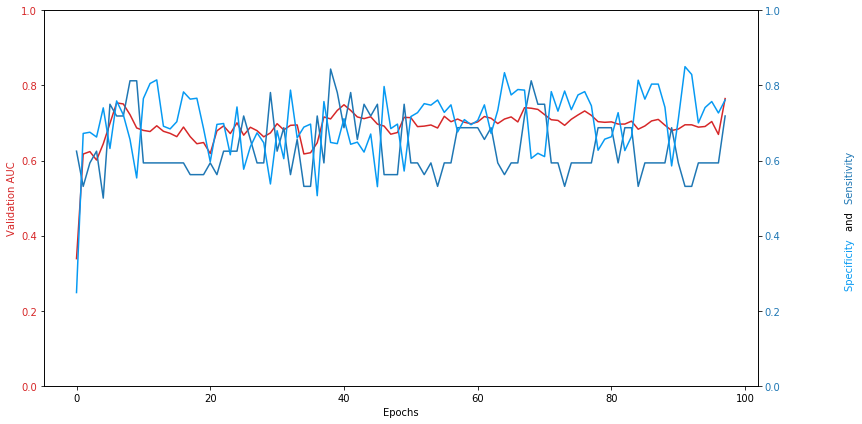


Fold  3
Number of confused training items before SMOTE:  300
Number of not_confused training items before SMOTE:  900
confused items in training set:  900
not_confused items in training set:  900
confused items in validation set:  40
not_confused items in validation set:  1244

Validation confused items:

['111a_H-SortTwoFactors-3-1.pkl', '111a_H-SortTwoFactors-3-2.pkl', '111a_H-SortTwoFactors-3-3.pkl', '111a_H-SortTwoFactors-3-4.pkl', '137a_H-FE-4-1.pkl', '137a_H-FE-4-2.pkl', '137a_H-FE-4-3.pkl', '137a_H-FE-4-4.pkl', '137a_H-SortTwoFactors-2-1.pkl', '137a_H-SortTwoFactors-2-2.pkl', '137a_H-SortTwoFactors-2-3.pkl', '137a_H-SortTwoFactors-2-4.pkl', '137b_V-FE-20-1.pkl', '137b_V-FE-20-2.pkl', '137b_V-FE-20-3.pkl', '137b_V-FE-20-4.pkl', '145b_V-SortTwoFactors-10-1.pkl', '145b_V-SortTwoFactors-10-2.pkl', '145b_V-SortTwoFactors-10-3.pkl', '145b_V-SortTwoFactors-10-4.pkl', '145b_V-SortTwoFactors-24-1.pkl', '145b_V-SortTwoFactors-24-2.pkl', '145b_V-SortTwoFactors-24-3.pkl', '145b_V-SortTwoFa

[epoch: 14, batches:     2] loss: 0.42907 | accuracy: 0.78711
[epoch: 14, batches:     4] loss: 0.41388 | accuracy: 0.80469
[epoch: 14, batches:     6] loss: 0.41425 | accuracy: 0.81836
Training accuracy for epoch:  0.8024553571428571
validation accuracy:  0.73046875
validation loss:  0.48089063763618467
validation recall:  0.55
validation specificity:  0.7362903225806452
validation AUC:  0.6758064516129032
Epochs without improvement:  5
[epoch: 15, batches:     2] loss: 0.41034 | accuracy: 0.80273
[epoch: 15, batches:     4] loss: 0.39120 | accuracy: 0.82422
[epoch: 15, batches:     6] loss: 0.40631 | accuracy: 0.83203
Training accuracy for epoch:  0.8180803571428571
validation accuracy:  0.67265625
validation loss:  0.4546577215194702
validation recall:  0.6
validation specificity:  0.675
validation AUC:  0.6547983870967742
Epochs without improvement:  6
[epoch: 16, batches:     2] loss: 0.40562 | accuracy: 0.80859
[epoch: 16, batches:     4] loss: 0.38331 | accuracy: 0.83008
[epoch:

[epoch: 32, batches:     2] loss: 0.36122 | accuracy: 0.83789
[epoch: 32, batches:     4] loss: 0.36173 | accuracy: 0.82812
[epoch: 32, batches:     6] loss: 0.36295 | accuracy: 0.83008
Training accuracy for epoch:  0.8348214285714286
validation accuracy:  0.6515625
validation loss:  0.4601797342300415
validation recall:  0.7
validation specificity:  0.65
validation AUC:  0.7036491935483871
Epochs without improvement:  3
[epoch: 33, batches:     2] loss: 0.35824 | accuracy: 0.84180
[epoch: 33, batches:     4] loss: 0.35908 | accuracy: 0.82812
[epoch: 33, batches:     6] loss: 0.36363 | accuracy: 0.84766
Training accuracy for epoch:  0.83984375
validation accuracy:  0.64296875
validation loss:  0.46951258182525635
validation recall:  0.75
validation specificity:  0.6395161290322581
validation AUC:  0.7026209677419355
Epochs without improvement:  4
[epoch: 34, batches:     2] loss: 0.35729 | accuracy: 0.81445
[epoch: 34, batches:     4] loss: 0.35444 | accuracy: 0.83789
[epoch: 34, batch

Validation AUC:  0.7077217741935483
Validation Loss:  0.436993008852005
Epochs without improvement:  20
[epoch: 50, batches:     2] loss: 0.36637 | accuracy: 0.82227
[epoch: 50, batches:     4] loss: 0.35627 | accuracy: 0.84766
[epoch: 50, batches:     6] loss: 0.36208 | accuracy: 0.83398
Training accuracy for epoch:  0.8342633928571429
validation accuracy:  0.6890625
validation loss:  0.35728276073932647
validation recall:  0.625
validation specificity:  0.6911290322580645
validation AUC:  0.6856048387096774
Epochs without improvement:  21
[epoch: 51, batches:     2] loss: 0.35581 | accuracy: 0.82812
[epoch: 51, batches:     4] loss: 0.34283 | accuracy: 0.83984
[epoch: 51, batches:     6] loss: 0.35876 | accuracy: 0.86133
Training accuracy for epoch:  0.8443080357142857
validation accuracy:  0.6625
validation loss:  0.49162834882736206
validation recall:  0.725
validation specificity:  0.660483870967742
validation AUC:  0.700907258064516
Epochs without improvement:  22
[epoch: 52, bat

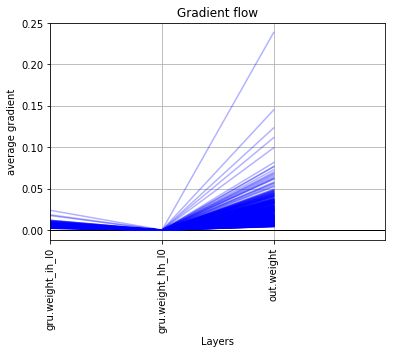

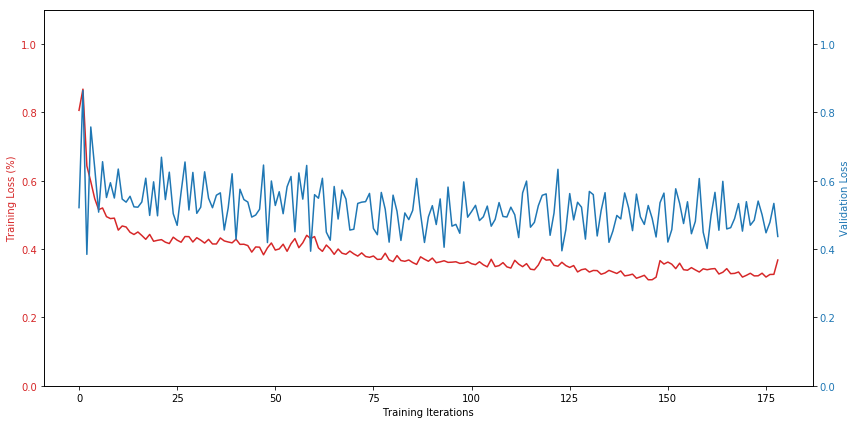

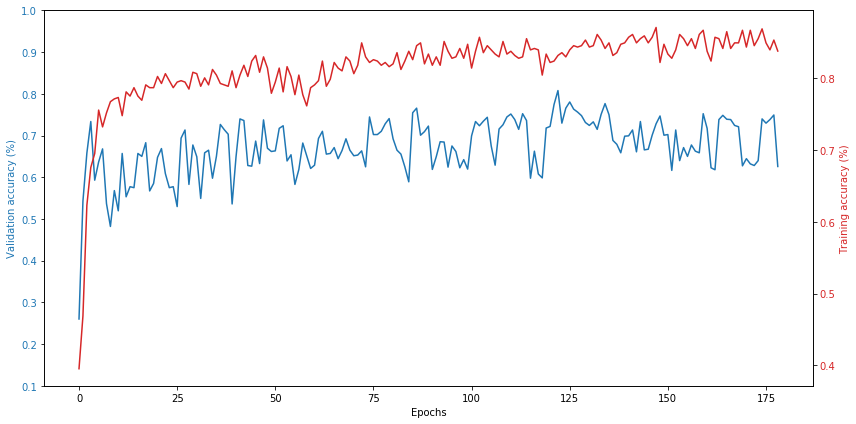

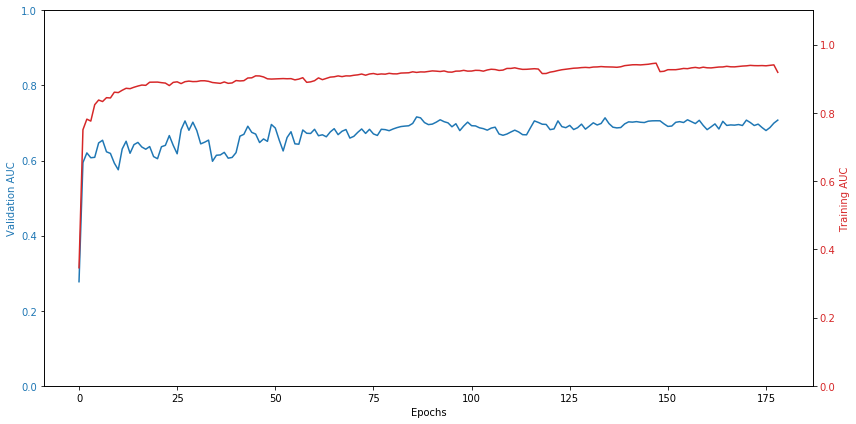

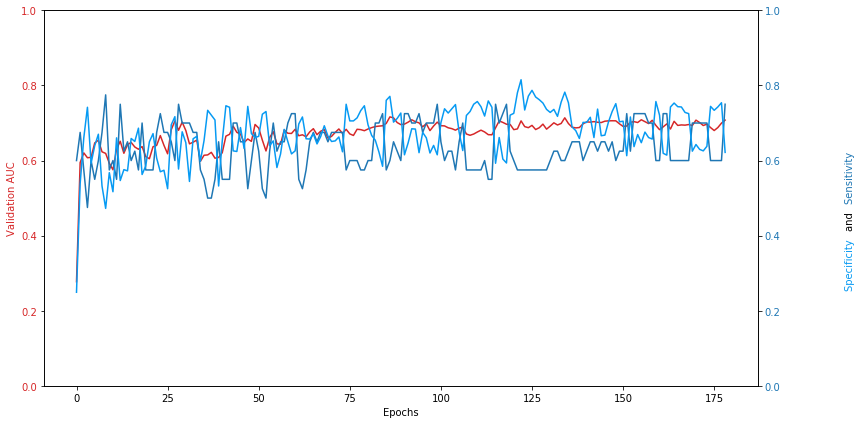


Fold  4
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['58a_V-SortTwoFactors-14-1.pkl', '58a_V-SortTwoFactors-14-2.pkl', '58a_V-SortTwoFactors-14-3.pkl', '58a_V-SortTwoFactors-14-4.pkl', '58a_V-SortTwoFactors-23-1.pkl', '58a_V-SortTwoFactors-23-2.pkl', '58a_V-SortTwoFactors-23-3.pkl', '58a_V-SortTwoFactors-23-4.pkl', '58a_V-SortTwoFactors-6-1.pkl', '58a_V-SortTwoFactors-6-2.pkl', '58a_V-SortTwoFactors-6-3.pkl', '58a_V-SortTwoFactors-6-4.pkl', '86a_V-FE-10-1.pkl', '86a_V-FE-10-2.pkl', '86a_V-FE-10-3.pkl', '86a_V-FE-10-4.pkl', '86a_V-SortTwoFactors-4-1.pkl', '86a_V-SortTwoFactors-4-2.pkl', '86a_V-SortTwoFactors-4-3.pkl', '86a_V-SortTwoFactors-4-4.pkl', '86b_H-CDV-6-1.pkl', '86b_H-CDV-6-2.pkl', '86b_H-CDV-6-3.pkl', '86b_H-CDV-6-4.pkl']

Tr

[epoch: 15, batches:     2] loss: 0.44701 | accuracy: 0.78711
[epoch: 15, batches:     4] loss: 0.43621 | accuracy: 0.80273
[epoch: 15, batches:     6] loss: 0.43521 | accuracy: 0.80273
Training accuracy for epoch:  0.7991071428571429
validation accuracy:  0.64609375
validation loss:  0.3710330486297607
validation recall:  0.7916666666666666
validation specificity:  0.643312101910828
validation AUC:  0.7908704883227177
Epochs without improvement:  1
[epoch: 16, batches:     2] loss: 0.43810 | accuracy: 0.77930
[epoch: 16, batches:     4] loss: 0.43359 | accuracy: 0.79688
[epoch: 16, batches:     6] loss: 0.42110 | accuracy: 0.80273
Training accuracy for epoch:  0.7935267857142857
validation accuracy:  0.78203125
validation loss:  0.3865839123725891
validation recall:  0.75
validation specificity:  0.7826433121019108
validation AUC:  0.7941547239915074
Epochs without improvement:  2
[epoch: 17, batches:     2] loss: 0.44564 | accuracy: 0.76172
[epoch: 17, batches:     4] loss: 0.43266 |

[epoch: 33, batches:     2] loss: 0.36253 | accuracy: 0.80859
[epoch: 33, batches:     4] loss: 0.36394 | accuracy: 0.84570
[epoch: 33, batches:     6] loss: 0.36992 | accuracy: 0.85156
Training accuracy for epoch:  0.8364955357142857
validation accuracy:  0.7515625
validation loss:  0.33688011169433596
validation recall:  0.5833333333333334
validation specificity:  0.7547770700636943
validation AUC:  0.7275411358811041
Epochs without improvement:  19
[epoch: 34, batches:     2] loss: 0.35667 | accuracy: 0.82812
[epoch: 34, batches:     4] loss: 0.35904 | accuracy: 0.84766
[epoch: 34, batches:     6] loss: 0.37030 | accuracy: 0.84961
Training accuracy for epoch:  0.8431919642857143
validation accuracy:  0.65390625
validation loss:  0.31960833072662354
validation recall:  0.7083333333333334
validation specificity:  0.6528662420382165
validation AUC:  0.7308253715498938
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.00075
New learning rate:

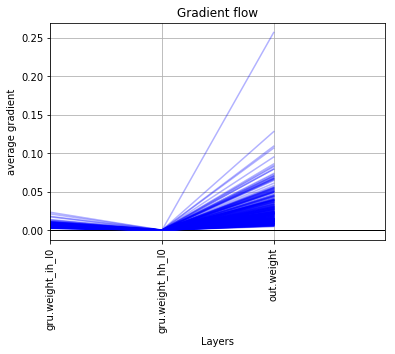

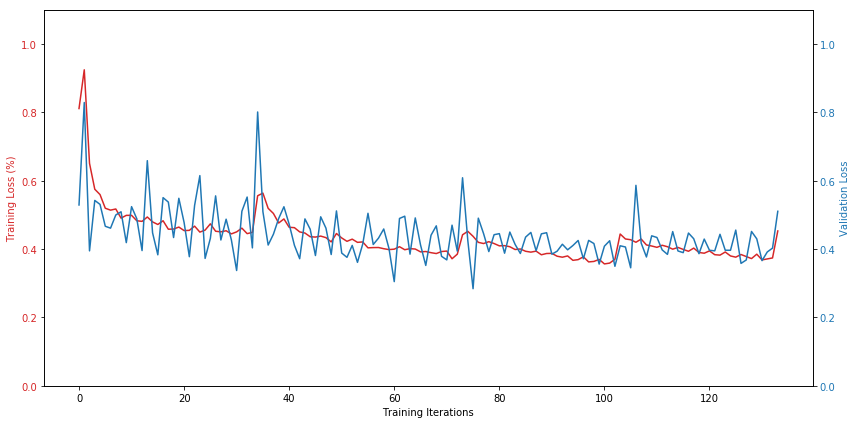

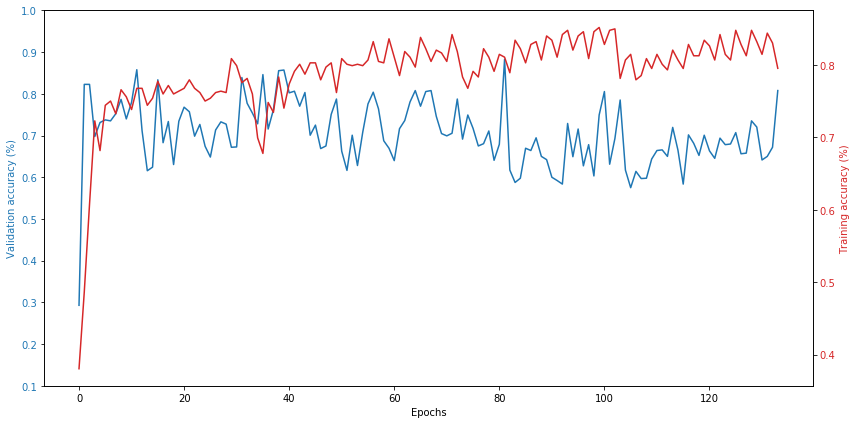

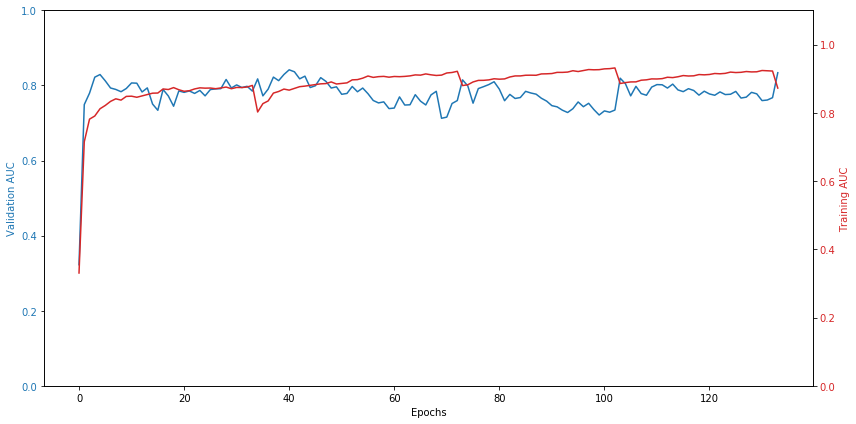

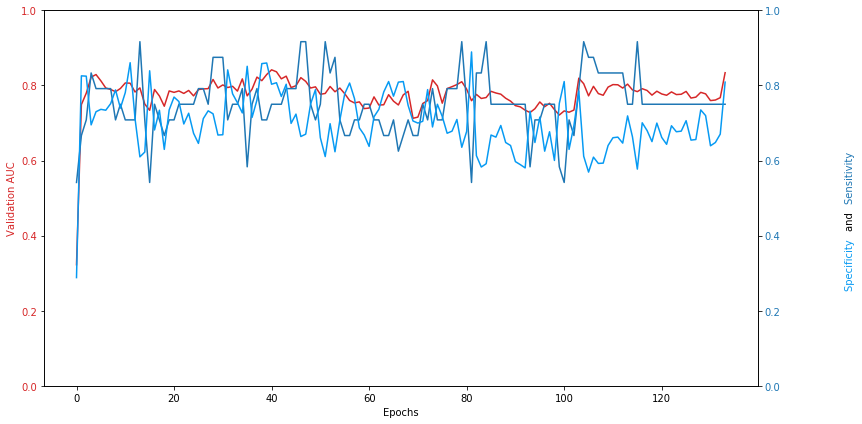


Fold  5
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['122a_V-SortTwoFactors-4-1.pkl', '122a_V-SortTwoFactors-4-2.pkl', '122a_V-SortTwoFactors-4-3.pkl', '122a_V-SortTwoFactors-4-4.pkl', '142a_V-CDV-15-1.pkl', '142a_V-CDV-15-2.pkl', '142a_V-CDV-15-3.pkl', '142a_V-CDV-15-4.pkl', '142b_H-CDV-22-1.pkl', '142b_H-CDV-22-2.pkl', '142b_H-CDV-22-3.pkl', '142b_H-CDV-22-4.pkl', '25a_H-RV-22-1.pkl', '25a_H-RV-22-2.pkl', '25a_H-RV-22-3.pkl', '25a_H-RV-22-4.pkl', '32a_V-SortTwoFactors-11-1.pkl', '32a_V-SortTwoFactors-11-2.pkl', '32a_V-SortTwoFactors-11-3.pkl', '32a_V-SortTwoFactors-11-4.pkl', '82a_V-SortTwoFactors-4-1.pkl', '82a_V-SortTwoFactors-4-2.pkl', '82a_V-SortTwoFactors-4-3.pkl', '82a_V-SortTwoFactors-4-4.pkl']

Training data:  Dataset Datase

[epoch: 15, batches:     2] loss: 0.43779 | accuracy: 0.78711
[epoch: 15, batches:     4] loss: 0.41255 | accuracy: 0.79883
[epoch: 15, batches:     6] loss: 0.42638 | accuracy: 0.77734
Training accuracy for epoch:  0.7935267857142857
validation accuracy:  0.58359375
validation loss:  0.31856759190559386
validation recall:  0.5833333333333334
validation specificity:  0.5835987261146497
validation AUC:  0.5863521762208068
Epochs without improvement:  5
[epoch: 16, batches:     2] loss: 0.42592 | accuracy: 0.79297
[epoch: 16, batches:     4] loss: 0.41241 | accuracy: 0.80273
[epoch: 16, batches:     6] loss: 0.42158 | accuracy: 0.79297
Training accuracy for epoch:  0.80078125
validation accuracy:  0.49765625
validation loss:  0.31770631670951843
validation recall:  0.625
validation specificity:  0.49522292993630573
validation AUC:  0.5655851910828025
Epochs without improvement:  6
[epoch: 17, batches:     2] loss: 0.42648 | accuracy: 0.78125
[epoch: 17, batches:     4] loss: 0.41917 | ac

[epoch: 32, batches:     4] loss: 0.40131 | accuracy: 0.80469
[epoch: 32, batches:     6] loss: 0.42272 | accuracy: 0.78516
Training accuracy for epoch:  0.7996651785714286
validation accuracy:  0.4765625
validation loss:  0.3305316984653473
validation recall:  0.6666666666666666
validation specificity:  0.4729299363057325
validation AUC:  0.5710257430997877
Epochs without improvement:  1
[epoch: 33, batches:     2] loss: 0.40562 | accuracy: 0.80859
[epoch: 33, batches:     4] loss: 0.38618 | accuracy: 0.81641
[epoch: 33, batches:     6] loss: 0.39516 | accuracy: 0.80664
Training accuracy for epoch:  0.8158482142857143
validation accuracy:  0.4109375
validation loss:  0.3518154382705688
validation recall:  0.7083333333333334
validation specificity:  0.4052547770700637
validation AUC:  0.5528131634819533
Epochs without improvement:  2
[epoch: 34, batches:     2] loss: 0.39328 | accuracy: 0.81445
[epoch: 34, batches:     4] loss: 0.37972 | accuracy: 0.81641
[epoch: 34, batches:     6] lo

[epoch: 50, batches:     2] loss: 0.36103 | accuracy: 0.84180
[epoch: 50, batches:     4] loss: 0.35423 | accuracy: 0.84375
[epoch: 50, batches:     6] loss: 0.35177 | accuracy: 0.84180
Training accuracy for epoch:  0.8454241071428571
validation accuracy:  0.50390625
validation loss:  0.310633647441864
validation recall:  0.7083333333333334
validation specificity:  0.5
validation AUC:  0.595276008492569
Epochs without improvement:  8
[epoch: 51, batches:     2] loss: 0.35385 | accuracy: 0.84375
[epoch: 51, batches:     4] loss: 0.34965 | accuracy: 0.84570
[epoch: 51, batches:     6] loss: 0.35039 | accuracy: 0.84180
Training accuracy for epoch:  0.8487723214285714
validation accuracy:  0.53515625
validation loss:  0.280695241689682
validation recall:  0.6666666666666666
validation specificity:  0.5326433121019108
validation AUC:  0.5972996284501062
Epochs without improvement:  9
[epoch: 52, batches:     2] loss: 0.35520 | accuracy: 0.84375
[epoch: 52, batches:     4] loss: 0.35072 | ac

[epoch: 68, batches:     2] loss: 0.37153 | accuracy: 0.81836
[epoch: 68, batches:     4] loss: 0.36879 | accuracy: 0.82031
[epoch: 68, batches:     6] loss: 0.38361 | accuracy: 0.80859
Training accuracy for epoch:  0.8191964285714286
validation accuracy:  0.609375
validation loss:  0.3356314539909363
validation recall:  0.625
validation specificity:  0.6090764331210191
validation AUC:  0.6024084394904459
Epochs without improvement:  26
[epoch: 69, batches:     2] loss: 0.36862 | accuracy: 0.82812
[epoch: 69, batches:     4] loss: 0.36737 | accuracy: 0.82031
[epoch: 69, batches:     6] loss: 0.37856 | accuracy: 0.81641
Training accuracy for epoch:  0.8231026785714286
validation accuracy:  0.61015625
validation loss:  0.32281218767166137
validation recall:  0.625
validation specificity:  0.6098726114649682
validation AUC:  0.6049296709129512
Epochs without improvement:  27
[epoch: 70, batches:     2] loss: 0.36744 | accuracy: 0.82422
[epoch: 70, batches:     4] loss: 0.36639 | accuracy:

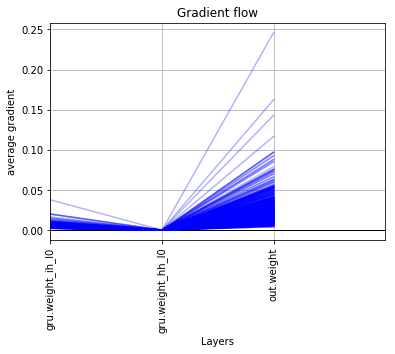

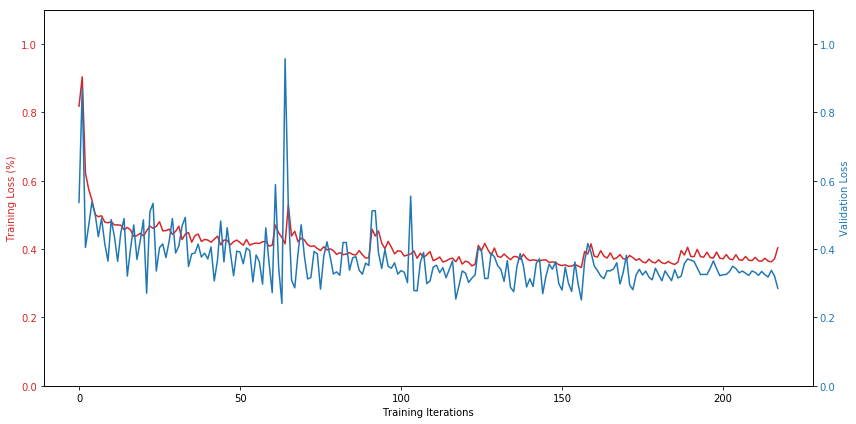

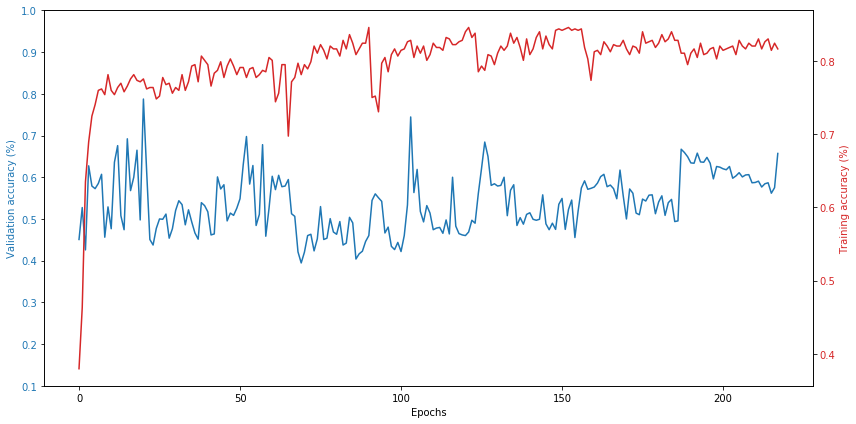

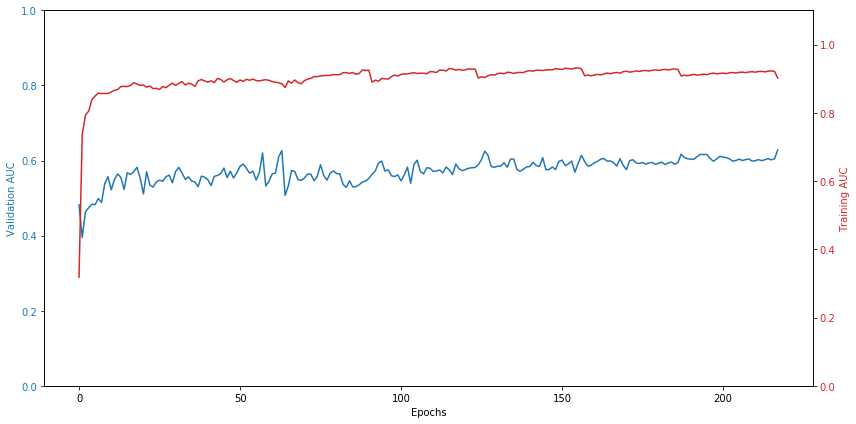

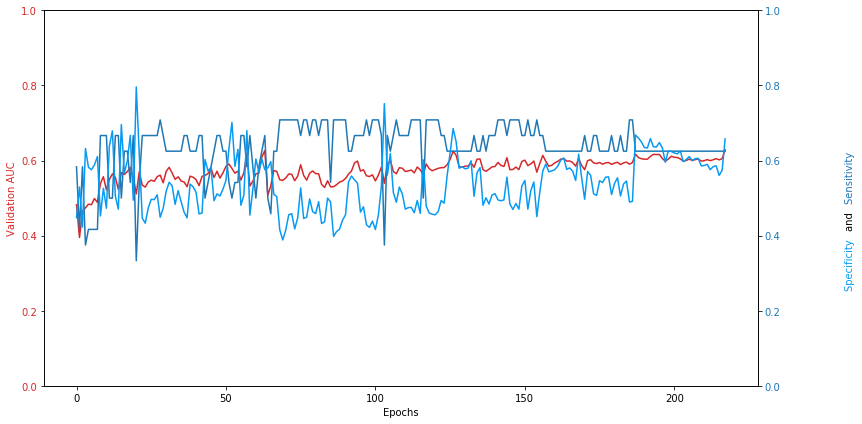


Fold  6
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1272

Validation confused items:

['10a_V-CDV-2-1.pkl', '10a_V-CDV-2-2.pkl', '10a_V-CDV-2-3.pkl', '10a_V-CDV-2-4.pkl', '12b_H-CDV-5-1.pkl', '12b_H-CDV-5-2.pkl', '12b_H-CDV-5-3.pkl', '12b_H-CDV-5-4.pkl', '3a_H-SortTwoFactors-11-1.pkl', '3a_H-SortTwoFactors-11-2.pkl', '3a_H-SortTwoFactors-11-3.pkl', '3a_H-SortTwoFactors-11-4.pkl', '9a_H-SortTwoFactors-12-1.pkl', '9a_H-SortTwoFactors-12-2.pkl', '9a_H-SortTwoFactors-12-3.pkl', '9a_H-SortTwoFactors-12-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1288
    Root Loca

[epoch: 15, batches:     6] loss: 0.41543 | accuracy: 0.81836
Training accuracy for epoch:  0.7991071428571429
validation accuracy:  0.74375
validation loss:  0.374847948551178
validation recall:  0.6875
validation specificity:  0.7444620253164557
validation AUC:  0.7421875
Epochs without improvement:  8
[epoch: 16, batches:     2] loss: 0.43492 | accuracy: 0.79102
[epoch: 16, batches:     4] loss: 0.41149 | accuracy: 0.81445
[epoch: 16, batches:     6] loss: 0.40925 | accuracy: 0.82617
Training accuracy for epoch:  0.8091517857142857
validation accuracy:  0.78125
validation loss:  0.3403245836496353
validation recall:  0.8125
validation specificity:  0.7808544303797469
validation AUC:  0.7987045094936709
Epochs without improvement:  9
[epoch: 17, batches:     2] loss: 0.44343 | accuracy: 0.78516
[epoch: 17, batches:     4] loss: 0.43065 | accuracy: 0.78125
[epoch: 17, batches:     6] loss: 0.41741 | accuracy: 0.80664
Training accuracy for epoch:  0.7896205357142857
validation accuracy

[epoch: 33, batches:     6] loss: 0.36179 | accuracy: 0.83984
Training accuracy for epoch:  0.8376116071428571
validation accuracy:  0.71640625
validation loss:  0.35371426939964296
validation recall:  0.8125
validation specificity:  0.7151898734177216
validation AUC:  0.7776898734177216
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.0015
New learning rate: 0.00075
Validation AUC:  0.817246835443038
Validation Loss:  0.3804280996322632
Epochs without improvement:  10
[epoch: 34, batches:     2] loss: 0.42213 | accuracy: 0.79297
[epoch: 34, batches:     4] loss: 0.38985 | accuracy: 0.81445
[epoch: 34, batches:     6] loss: 0.39065 | accuracy: 0.82031
Training accuracy for epoch:  0.8080357142857143
validation accuracy:  0.76796875
validation loss:  0.3777765095233917
validation recall:  0.8125
validation specificity:  0.7674050632911392
validation AUC:  0.7862935126582279
Epochs without improvement:  11
[epoch: 35, batches:     2] loss: 0.

[epoch: 51, batches:     2] loss: 0.36976 | accuracy: 0.82031
[epoch: 51, batches:     4] loss: 0.34765 | accuracy: 0.84570
[epoch: 51, batches:     6] loss: 0.34659 | accuracy: 0.84570
Training accuracy for epoch:  0.8342633928571429
validation accuracy:  0.7703125
validation loss:  0.3281342566013336
validation recall:  0.8125
validation specificity:  0.7697784810126582
validation AUC:  0.811807753164557
Epochs without improvement:  28
[epoch: 52, batches:     2] loss: 0.36850 | accuracy: 0.81836
[epoch: 52, batches:     4] loss: 0.34292 | accuracy: 0.85352
[epoch: 52, batches:     6] loss: 0.34437 | accuracy: 0.85352
Training accuracy for epoch:  0.8376116071428571
validation accuracy:  0.76640625
validation loss:  0.30462659895420074
validation recall:  0.8125
validation specificity:  0.7658227848101266
validation AUC:  0.8126483386075949
Epochs without improvement:  29
[epoch: 53, batches:     2] loss: 0.36728 | accuracy: 0.81836
[epoch: 53, batches:     4] loss: 0.34112 | accurac

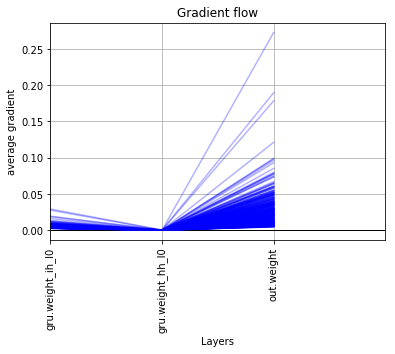

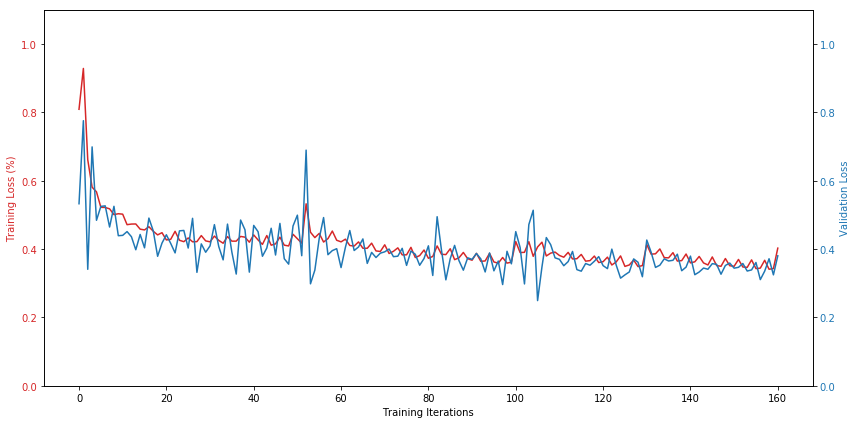

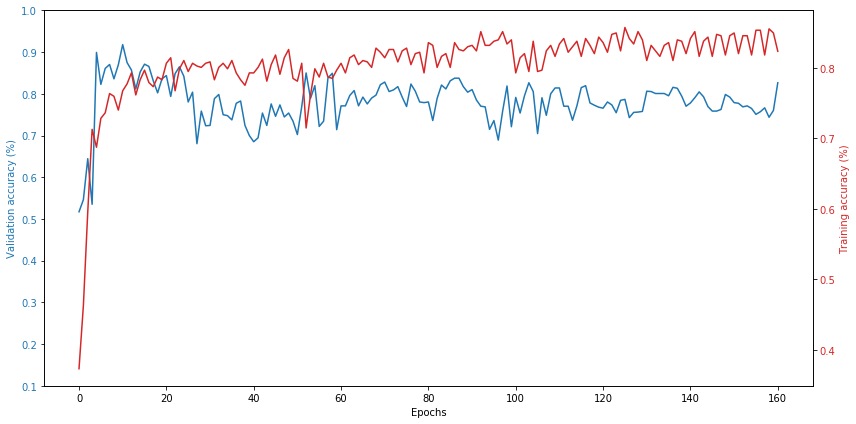

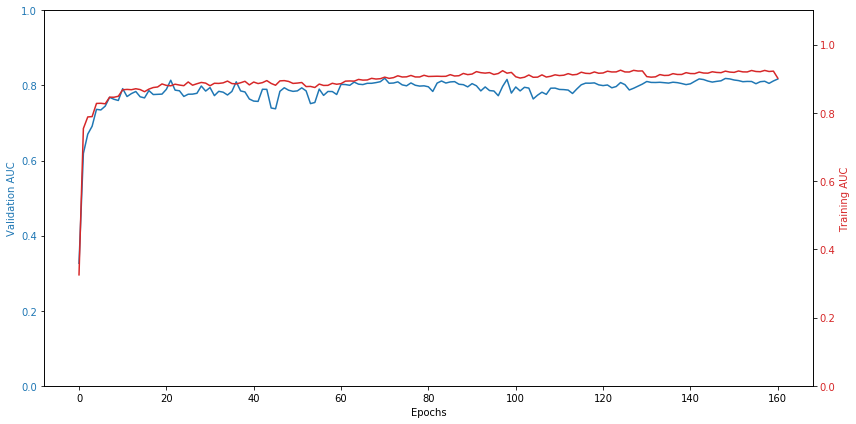

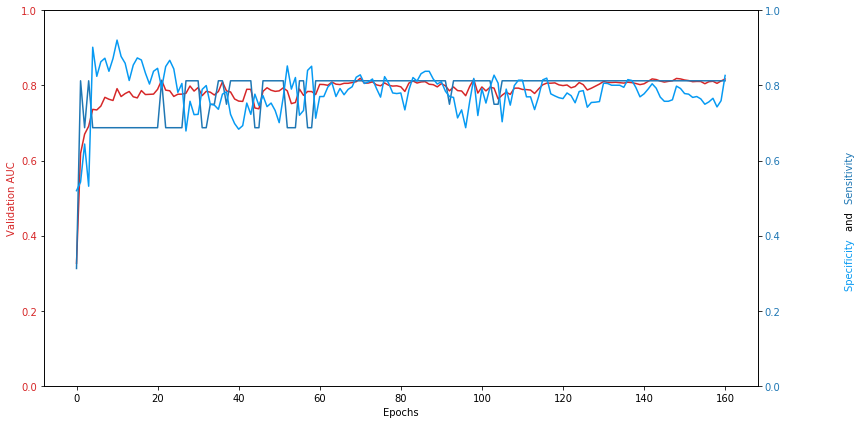


Fold  7
Number of confused training items before SMOTE:  296
Number of not_confused training items before SMOTE:  888
confused items in training set:  888
not_confused items in training set:  888
confused items in validation set:  44
not_confused items in validation set:  1240

Validation confused items:

['105a_H-FE-17-1.pkl', '105a_H-FE-17-2.pkl', '105a_H-FE-17-3.pkl', '105a_H-FE-17-4.pkl', '105a_H-RV-22-1.pkl', '105a_H-RV-22-2.pkl', '105a_H-RV-22-3.pkl', '105a_H-RV-22-4.pkl', '105a_H-RV-8-1.pkl', '105a_H-RV-8-2.pkl', '105a_H-RV-8-3.pkl', '105a_H-RV-8-4.pkl', '105b_V-FE-20-1.pkl', '105b_V-FE-20-2.pkl', '105b_V-FE-20-3.pkl', '105b_V-FE-20-4.pkl', '105b_V-FE-8-1.pkl', '105b_V-FE-8-2.pkl', '105b_V-FE-8-3.pkl', '105b_V-FE-8-4.pkl', '105b_V-RV-5-1.pkl', '105b_V-RV-5-2.pkl', '105b_V-RV-5-3.pkl', '105b_V-RV-5-4.pkl', '134b_H-CDV-15-1.pkl', '134b_H-CDV-15-2.pkl', '134b_H-CDV-15-3.pkl', '134b_H-CDV-15-4.pkl', '134b_H-CDV-4-1.pkl', '134b_H-CDV-4-2.pkl', '134b_H-CDV-4-3.pkl', '134b_H-CDV-4-4.p

[epoch: 14, batches:     2] loss: 0.41655 | accuracy: 0.81641
[epoch: 14, batches:     4] loss: 0.46851 | accuracy: 0.74805
[epoch: 14, batches:     6] loss: 0.42114 | accuracy: 0.78906
Training accuracy for epoch:  0.7845052083333334
validation accuracy:  0.69765625
validation loss:  0.4023766338825226
validation recall:  0.7272727272727273
validation specificity:  0.6966019417475728
validation AUC:  0.7200647249190939
Epochs without improvement:  2
[epoch: 15, batches:     2] loss: 0.40176 | accuracy: 0.82422
[epoch: 15, batches:     4] loss: 0.50574 | accuracy: 0.70703
[epoch: 15, batches:     6] loss: 0.43750 | accuracy: 0.78125
Training accuracy for epoch:  0.7708333333333334
validation accuracy:  0.68828125
validation loss:  0.3764132082462311
validation recall:  0.7045454545454546
validation specificity:  0.6877022653721683
validation AUC:  0.7108524566048839
Epochs without improvement:  3
[epoch: 16, batches:     2] loss: 0.42507 | accuracy: 0.80078
[epoch: 16, batches:     4] 

[epoch: 32, batches:     2] loss: 0.36870 | accuracy: 0.82031
[epoch: 32, batches:     4] loss: 0.42813 | accuracy: 0.77344
[epoch: 32, batches:     6] loss: 0.35391 | accuracy: 0.85156
Training accuracy for epoch:  0.8151041666666666
validation accuracy:  0.71328125
validation loss:  0.39450600147247317
validation recall:  0.6818181818181818
validation specificity:  0.7144012944983819
validation AUC:  0.6817814062959694
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.0015
New learning rate: 0.00075
Validation AUC:  0.7211128273021477
Validation Loss:  0.372280079126358
Epochs without improvement:  20
[epoch: 33, batches:     2] loss: 0.41750 | accuracy: 0.79688
[epoch: 33, batches:     4] loss: 0.47973 | accuracy: 0.72070
[epoch: 33, batches:     6] loss: 0.40188 | accuracy: 0.81250
Training accuracy for epoch:  0.7766927083333334
validation accuracy:  0.678125
validation loss:  0.38675519824028015
validation recall:  0.75
validation spec

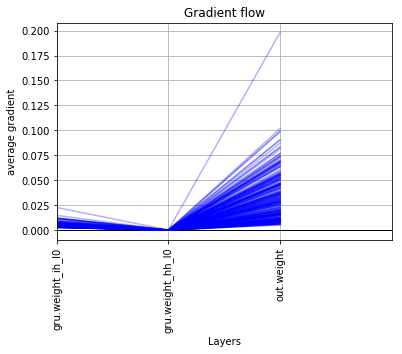

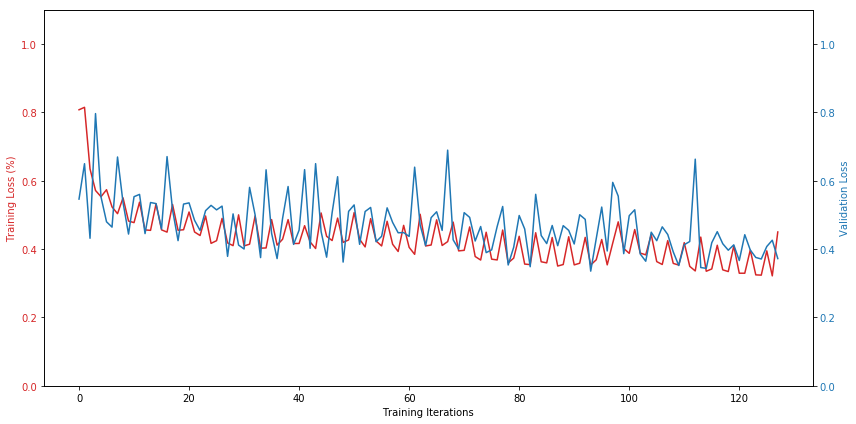

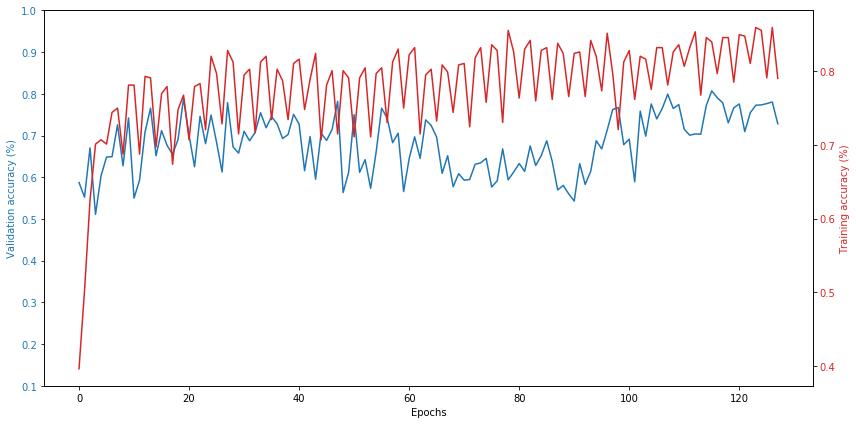

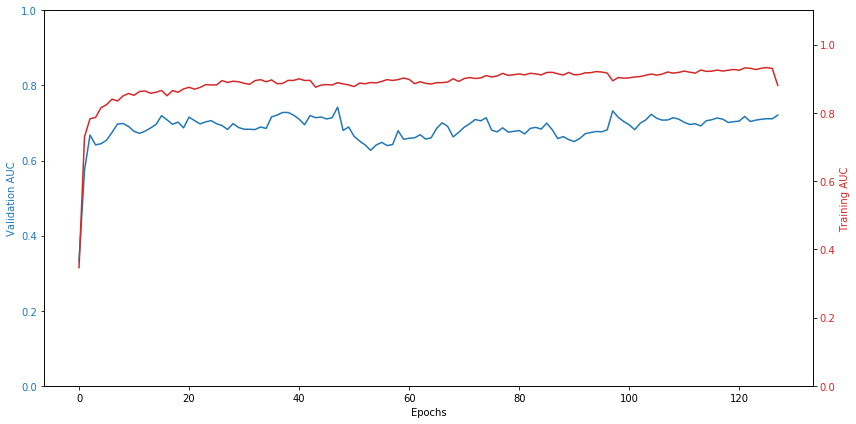

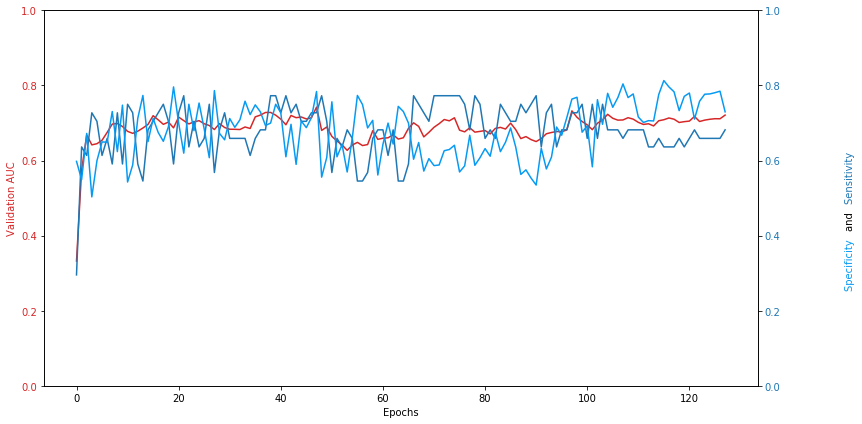


Fold  8
Number of confused training items before SMOTE:  304
Number of not_confused training items before SMOTE:  912
confused items in training set:  912
not_confused items in training set:  912
confused items in validation set:  36
not_confused items in validation set:  1248

Validation confused items:

['121a_H-CDV-9-1.pkl', '121a_H-CDV-9-2.pkl', '121a_H-CDV-9-3.pkl', '121a_H-CDV-9-4.pkl', '121a_H-SortTwoFactors-20-1.pkl', '121a_H-SortTwoFactors-20-2.pkl', '121a_H-SortTwoFactors-20-3.pkl', '121a_H-SortTwoFactors-20-4.pkl', '121b_V-FE-2-1.pkl', '121b_V-FE-2-2.pkl', '121b_V-FE-2-3.pkl', '121b_V-FE-2-4.pkl', '121b_V-SortTwoFactors-11-1.pkl', '121b_V-SortTwoFactors-11-2.pkl', '121b_V-SortTwoFactors-11-3.pkl', '121b_V-SortTwoFactors-11-4.pkl', '129b_V-SortTwoFactors-23-1.pkl', '129b_V-SortTwoFactors-23-2.pkl', '129b_V-SortTwoFactors-23-3.pkl', '129b_V-SortTwoFactors-23-4.pkl', '141a_H-RV-18-1.pkl', '141a_H-RV-18-2.pkl', '141a_H-RV-18-3.pkl', '141a_H-RV-18-4.pkl', '141a_H-SortTwoFactors-

[epoch: 14, batches:     2] loss: 0.42104 | accuracy: 0.81641
[epoch: 14, batches:     4] loss: 0.42239 | accuracy: 0.79688
[epoch: 14, batches:     6] loss: 0.44612 | accuracy: 0.78125
Training accuracy for epoch:  0.8030133928571429
validation accuracy:  0.4859375
validation loss:  0.4844313979148865
validation recall:  0.6388888888888888
validation specificity:  0.4815112540192926
validation AUC:  0.5459092533047518
Epochs without improvement:  13
[epoch: 15, batches:     2] loss: 0.41068 | accuracy: 0.82031
[epoch: 15, batches:     4] loss: 0.40416 | accuracy: 0.81055
[epoch: 15, batches:     6] loss: 0.42600 | accuracy: 0.79883
Training accuracy for epoch:  0.8074776785714286
validation accuracy:  0.48671875
validation loss:  0.48819961547851565
validation recall:  0.6388888888888888
validation specificity:  0.48231511254019294
validation AUC:  0.5437879599857092
Epochs without improvement:  14
[epoch: 16, batches:     2] loss: 0.40383 | accuracy: 0.81445
[epoch: 16, batches:     

validation accuracy:  0.58515625
validation loss:  0.6215275526046753
validation recall:  0.6666666666666666
validation specificity:  0.5827974276527331
validation AUC:  0.6309842801000357


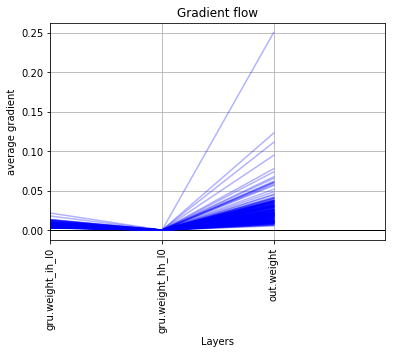

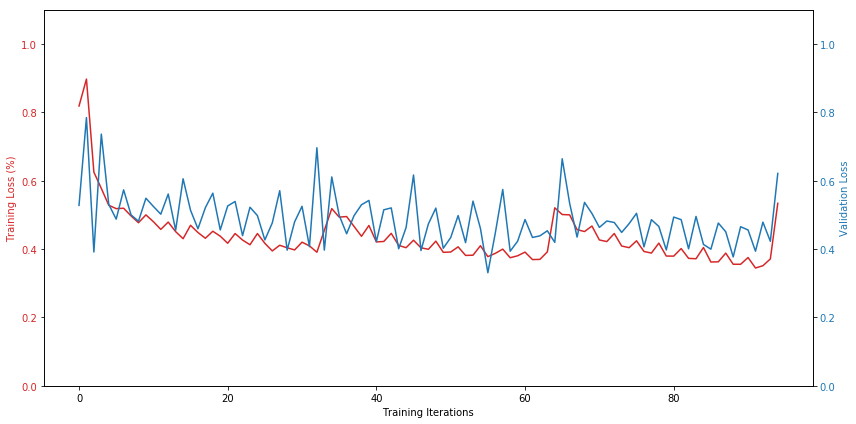

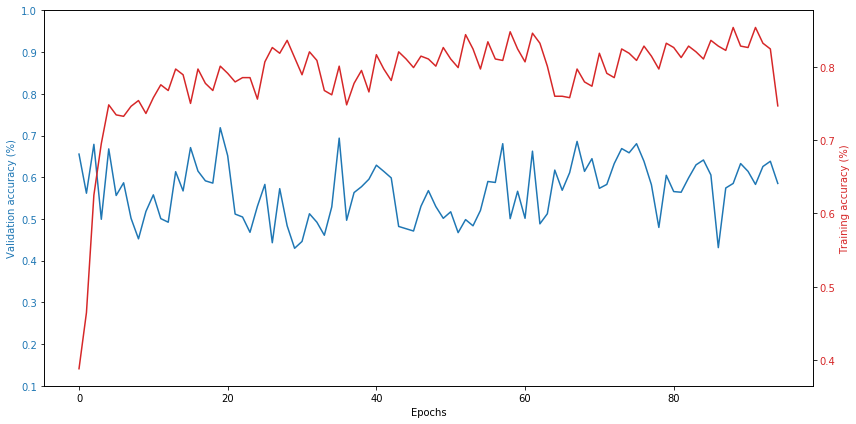

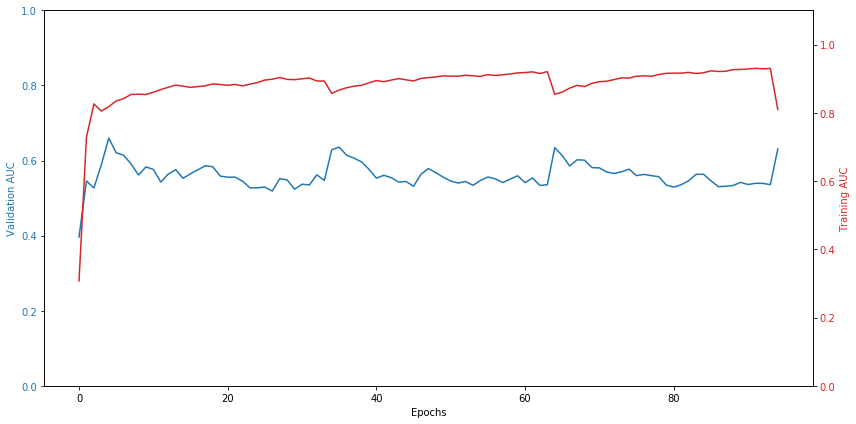

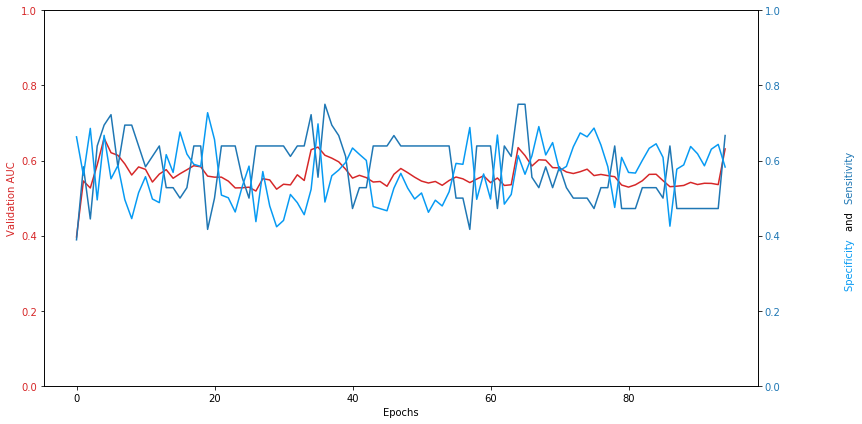


Fold  9
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1268

Validation confused items:

['103a_H-CDV-12-1.pkl', '103a_H-CDV-12-2.pkl', '103a_H-CDV-12-3.pkl', '103a_H-CDV-12-4.pkl', '103a_H-CDV-17-1.pkl', '103a_H-CDV-17-2.pkl', '103a_H-CDV-17-3.pkl', '103a_H-CDV-17-4.pkl', '11a_H-SortTwoFactors-5-1.pkl', '11a_H-SortTwoFactors-5-2.pkl', '11a_H-SortTwoFactors-5-3.pkl', '11a_H-SortTwoFactors-5-4.pkl', '143a_H-CDV-17-1.pkl', '143a_H-CDV-17-2.pkl', '143a_H-CDV-17-3.pkl', '143a_H-CDV-17-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1284
    Root Location: ./dataset/augm

[epoch: 16, batches:     2] loss: 0.43253 | accuracy: 0.79492
[epoch: 16, batches:     4] loss: 0.43260 | accuracy: 0.79688
[epoch: 16, batches:     6] loss: 0.43837 | accuracy: 0.77734
Training accuracy for epoch:  0.7890625
validation accuracy:  0.65703125
validation loss:  0.34652971029281615
validation recall:  0.4375
validation specificity:  0.6598101265822784
validation AUC:  0.5471222310126582
Epochs without improvement:  15
[epoch: 17, batches:     2] loss: 0.42306 | accuracy: 0.79297
[epoch: 17, batches:     4] loss: 0.42814 | accuracy: 0.81055
[epoch: 17, batches:     6] loss: 0.42810 | accuracy: 0.78320
Training accuracy for epoch:  0.7924107142857143
validation accuracy:  0.82578125
validation loss:  0.3470180481672287
validation recall:  0.375
validation specificity:  0.8314873417721519
validation AUC:  0.5513746044303798
Epochs without improvement:  16
[epoch: 18, batches:     2] loss: 0.40756 | accuracy: 0.81641
[epoch: 18, batches:     4] loss: 0.41171 | accuracy: 0.828

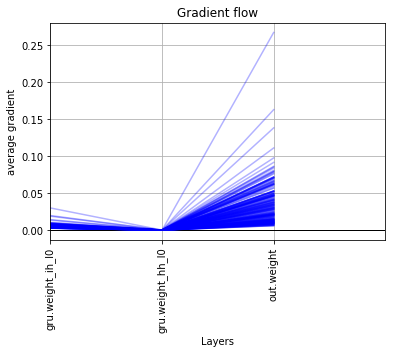

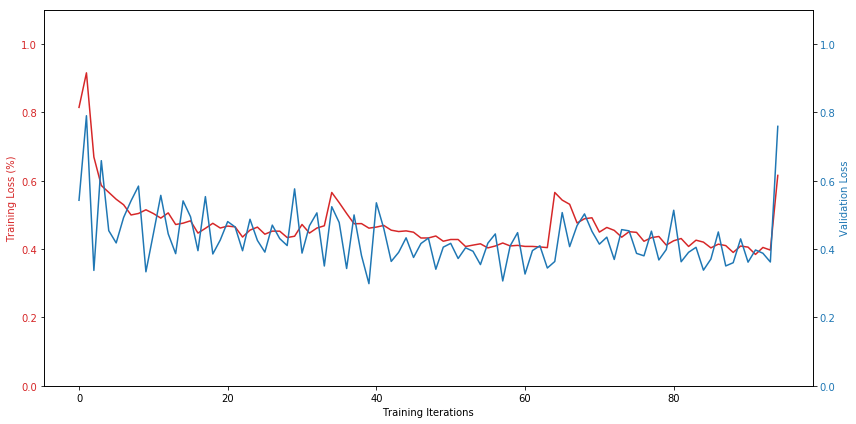

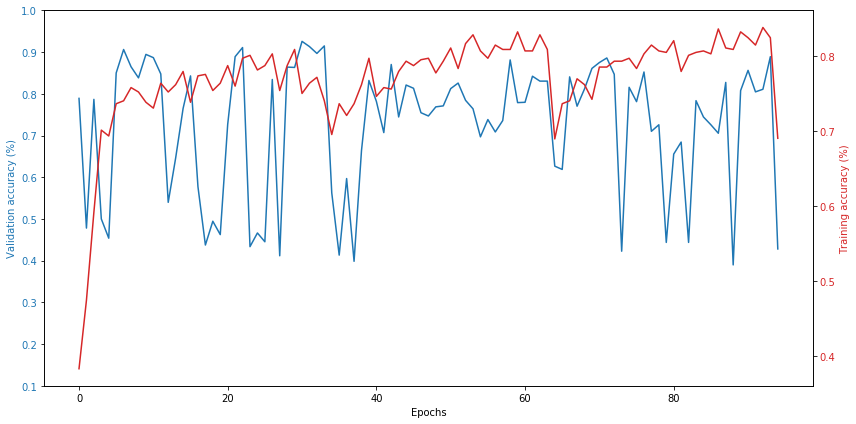

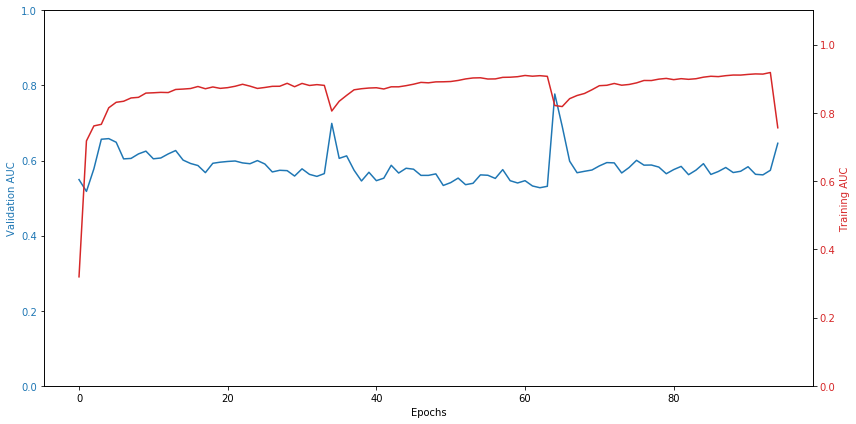

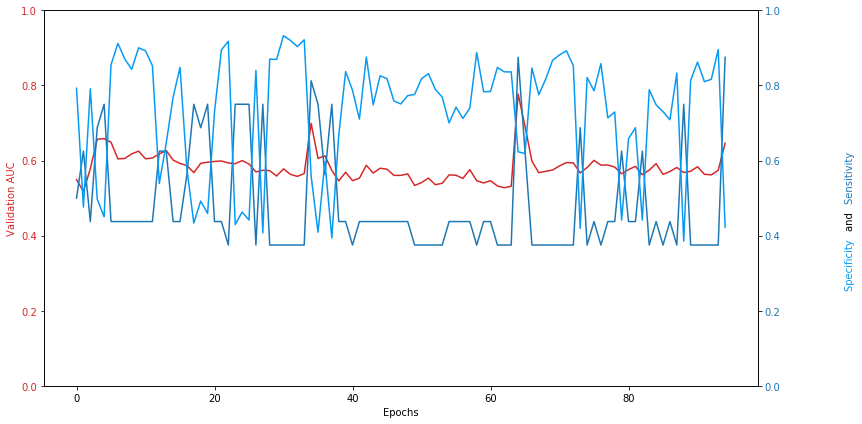


Fold  10
Number of confused training items before SMOTE:  288
Number of not_confused training items before SMOTE:  864
confused items in training set:  864
not_confused items in training set:  864
confused items in validation set:  52
not_confused items in validation set:  1228

Validation confused items:

['112a_V-SortTwoFactors-5-1.pkl', '112a_V-SortTwoFactors-5-2.pkl', '112a_V-SortTwoFactors-5-3.pkl', '112a_V-SortTwoFactors-5-4.pkl', '114a_V-SortTwoFactors-12-1.pkl', '114a_V-SortTwoFactors-12-2.pkl', '114a_V-SortTwoFactors-12-3.pkl', '114a_V-SortTwoFactors-12-4.pkl', '130a_V-RV-10-1.pkl', '130a_V-RV-10-2.pkl', '130a_V-RV-10-3.pkl', '130a_V-RV-10-4.pkl', '35a_H-SortTwoFactors-15-1.pkl', '35a_H-SortTwoFactors-15-2.pkl', '35a_H-SortTwoFactors-15-3.pkl', '35a_H-SortTwoFactors-15-4.pkl', '35a_H-SortTwoFactors-22-1.pkl', '35a_H-SortTwoFactors-22-2.pkl', '35a_H-SortTwoFactors-22-3.pkl', '35a_H-SortTwoFactors-22-4.pkl', '35a_H-SortTwoFactors-4-1.pkl', '35a_H-SortTwoFactors-4-2.pkl', '35a_H

[epoch: 13, batches:     2] loss: 0.49466 | accuracy: 0.76758
[epoch: 13, batches:     4] loss: 0.50210 | accuracy: 0.75195
[epoch: 13, batches:     6] loss: 0.46759 | accuracy: 0.79688
Training accuracy for epoch:  0.7721354166666666
validation accuracy:  0.878125
validation loss:  0.6077563524246216
validation recall:  0.6923076923076923
validation specificity:  0.8859934853420195
validation AUC:  0.8572099724379855
Epochs without improvement:  12
[epoch: 14, batches:     2] loss: 0.49735 | accuracy: 0.74023
[epoch: 14, batches:     4] loss: 0.48576 | accuracy: 0.78125
[epoch: 14, batches:     6] loss: 0.45463 | accuracy: 0.79102
Training accuracy for epoch:  0.7708333333333334
validation accuracy:  0.86953125
validation loss:  0.4923320412635803
validation recall:  0.6730769230769231
validation specificity:  0.8778501628664495
validation AUC:  0.8484245803056879
Epochs without improvement:  13
[epoch: 15, batches:     2] loss: 0.47509 | accuracy: 0.76562
[epoch: 15, batches:     4] 

[epoch: 31, batches:     2] loss: 0.38517 | accuracy: 0.83594
[epoch: 31, batches:     4] loss: 0.39916 | accuracy: 0.83398
[epoch: 31, batches:     6] loss: 0.36900 | accuracy: 0.83984
Training accuracy for epoch:  0.8365885416666666
validation accuracy:  0.89453125
validation loss:  0.3994335472583771
validation recall:  0.6923076923076923
validation specificity:  0.9030944625407166
validation AUC:  0.8583688298672012
Epochs without improvement:  8
[epoch: 32, batches:     2] loss: 0.37276 | accuracy: 0.84180
[epoch: 32, batches:     4] loss: 0.39145 | accuracy: 0.83789
[epoch: 32, batches:     6] loss: 0.36107 | accuracy: 0.85156
Training accuracy for epoch:  0.84375
validation accuracy:  0.87421875
validation loss:  0.36868595480918886
validation recall:  0.6923076923076923
validation specificity:  0.8819218241042345
validation AUC:  0.8441493360060135
Epochs without improvement:  9
[epoch: 33, batches:     2] loss: 0.35968 | accuracy: 0.85938
[epoch: 33, batches:     4] loss: 0.38

[epoch: 48, batches:     6] loss: 0.41561 | accuracy: 0.81250
Training accuracy for epoch:  0.8235677083333334
validation accuracy:  0.88984375
validation loss:  0.3960269629955292
validation recall:  0.6923076923076923
validation specificity:  0.8982084690553745
validation AUC:  0.8559258331245302
Epochs without improvement:  25
[epoch: 49, batches:     2] loss: 0.41690 | accuracy: 0.83789
[epoch: 49, batches:     4] loss: 0.42757 | accuracy: 0.82031
[epoch: 49, batches:     6] loss: 0.41011 | accuracy: 0.81445
Training accuracy for epoch:  0.82421875
validation accuracy:  0.8796875
validation loss:  0.37764023542404174
validation recall:  0.6923076923076923
validation specificity:  0.8876221498371335
validation AUC:  0.8547826359308444
Epochs without improvement:  26
[epoch: 50, batches:     2] loss: 0.40872 | accuracy: 0.84180
[epoch: 50, batches:     4] loss: 0.42221 | accuracy: 0.81641
[epoch: 50, batches:     6] loss: 0.40431 | accuracy: 0.82227
Training accuracy for epoch:  0.82

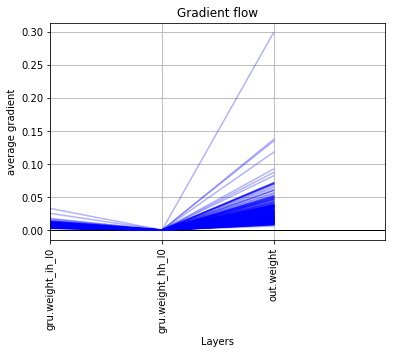

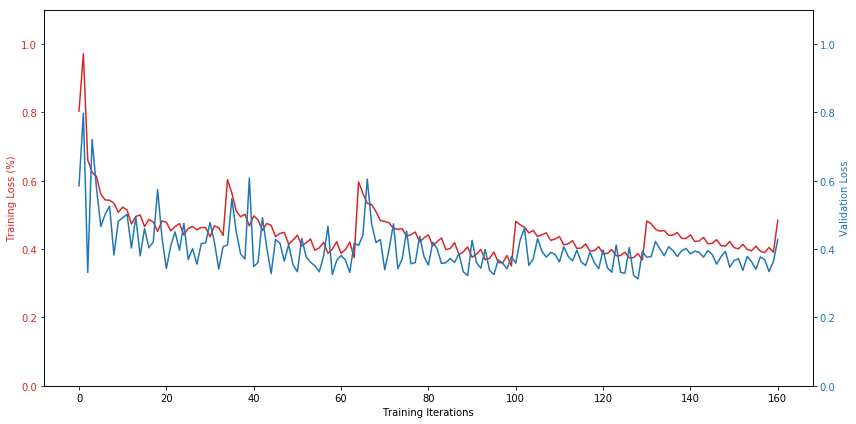

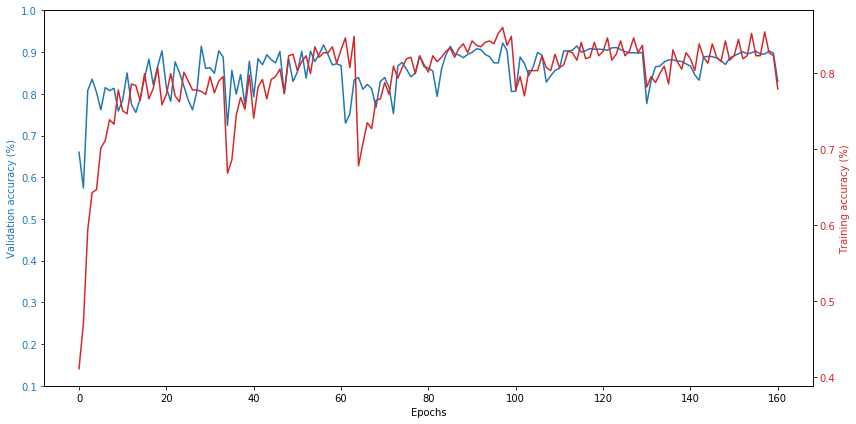

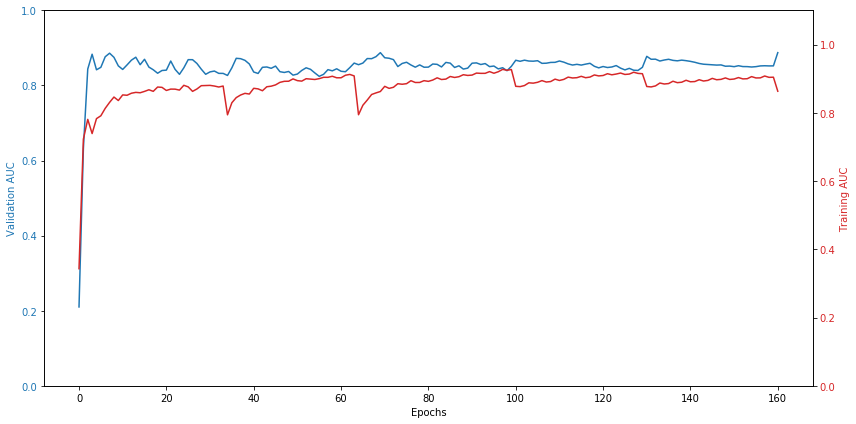

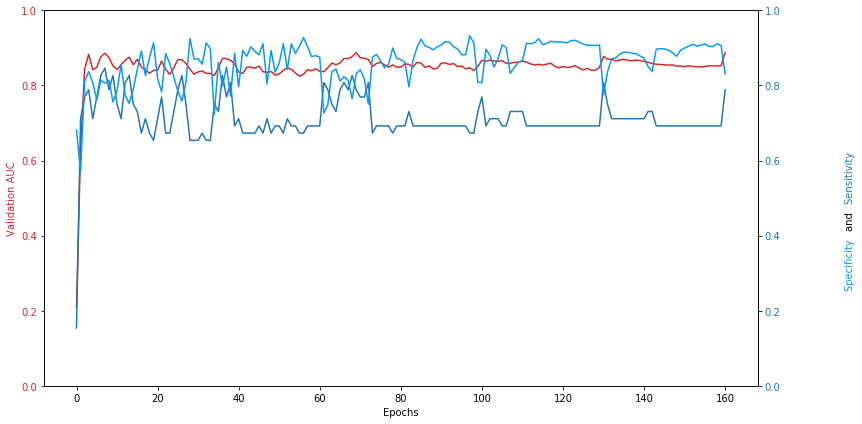


10-fold CV accuracy: 0.690781
10-fold CV sensitivity: 0.738248 
10-fold CV specificity: 0.689963 
10-fold CV AUC: 0.733655 


([0.659375,
  0.76015625,
  0.62578125,
  0.8078125,
  0.65703125,
  0.8265625,
  0.728125,
  0.58515625,
  0.428125,
  0.8296875],
 [0.7142857142857143,
  0.71875,
  0.75,
  0.75,
  0.625,
  0.8125,
  0.6818181818181818,
  0.6666666666666666,
  0.875,
  0.7884615384615384],
 [0.6568627450980392,
  0.7612179487179487,
  0.6217741935483871,
  0.8089171974522293,
  0.6576433121019108,
  0.8267405063291139,
  0.7297734627831716,
  0.5827974276527331,
  0.4224683544303797,
  0.8314332247557004],
 [0.6983251633986928,
  0.7650991586538461,
  0.7077217741935483,
  0.8339636411889597,
  0.6285828025477707,
  0.817246835443038,
  0.7211128273021477,
  0.6309842801000357,
  0.6460640822784811,
  0.8874498872463041])

In [14]:
np.random.seed(MANUAL_SEED)
random.seed(MANUAL_SEED)
torch.manual_seed(MANUAL_SEED)

cross_validate(model_type='gru',
                   folds=10,
                   epochs=300,
                   criterion_type='NLLLoss',
                   optimizer_type='Adam',
                   confused_path='./dataset/augmented/confused_highly_valid/',
                   not_confused_path='./dataset/augmented/not_confused_highly_valid/',
                   print_every=2,
                   plot_every=2,
                   hidden_size=256,
                   num_layers=1,
                   early_stopping=True,
                   early_stopping_patience=30,
                   rate_decay=True,
                   rate_decay_patience=10,
                   initial_learning_rate=0.003,
                   verbose=True)

## RNN CV:


Fold  1
Number of confused training items before SMOTE:  284
Number of not_confused training items before SMOTE:  852
confused items in training set:  852
not_confused items in training set:  852
confused items in validation set:  56
not_confused items in validation set:  1228

Validation confused items:

['131a_H-CDV-5-1.pkl', '131a_H-CDV-5-2.pkl', '131a_H-CDV-5-3.pkl', '131a_H-CDV-5-4.pkl', '131a_H-SortTwoFactors-12-1.pkl', '131a_H-SortTwoFactors-12-2.pkl', '131a_H-SortTwoFactors-12-3.pkl', '131a_H-SortTwoFactors-12-4.pkl', '131b_V-SortTwoFactors-21-1.pkl', '131b_V-SortTwoFactors-21-2.pkl', '131b_V-SortTwoFactors-21-3.pkl', '131b_V-SortTwoFactors-21-4.pkl', '132a_V-CDV-2-1.pkl', '132a_V-CDV-2-2.pkl', '132a_V-CDV-2-3.pkl', '132a_V-CDV-2-4.pkl', '132a_V-SortOverall-21-1.pkl', '132a_V-SortOverall-21-2.pkl', '132a_V-SortOverall-21-3.pkl', '132a_V-SortOverall-21-4.pkl', '132a_V-SortOverall-9-1.pkl', '132a_V-SortOverall-9-2.pkl', '132a_V-SortOverall-9-3.pkl', '132a_V-SortOverall-9-4.pkl',

Training accuracy for epoch:  0.6946614583333334
validation accuracy:  0.5796875
validation loss:  0.5330486118793487
validation recall:  0.5178571428571429
validation specificity:  0.5825163398692811
validation AUC:  0.5779791083099907
Epochs without improvement:  6
[epoch: 13, batches:     2] loss: 0.59539 | accuracy: 0.67969
[epoch: 13, batches:     4] loss: 0.57841 | accuracy: 0.69922
[epoch: 13, batches:     6] loss: 0.55916 | accuracy: 0.73633
Training accuracy for epoch:  0.705078125
validation accuracy:  0.9546875
validation loss:  0.5590707659721375
validation recall:  0.2857142857142857
validation specificity:  0.9852941176470589
validation AUC:  0.5073091736694678
Epochs without improvement:  7
[epoch: 14, batches:     2] loss: 0.58190 | accuracy: 0.68945
[epoch: 14, batches:     4] loss: 0.58163 | accuracy: 0.67773
[epoch: 14, batches:     6] loss: 0.56856 | accuracy: 0.73828
Training accuracy for epoch:  0.7018229166666666
validation accuracy:  0.6125
validation loss:  0.5

[epoch: 30, batches:     2] loss: 0.60220 | accuracy: 0.67188
[epoch: 30, batches:     4] loss: 0.56799 | accuracy: 0.68945
[epoch: 30, batches:     6] loss: 0.56904 | accuracy: 0.72656
Training accuracy for epoch:  0.6959635416666666
validation accuracy:  0.93125
validation loss:  0.5582957684993743
validation recall:  0.2857142857142857
validation specificity:  0.9607843137254902
validation AUC:  0.47071953781512604
Epochs without improvement:  8
[epoch: 31, batches:     2] loss: 0.59489 | accuracy: 0.68750
[epoch: 31, batches:     4] loss: 0.57169 | accuracy: 0.70898
[epoch: 31, batches:     6] loss: 0.57376 | accuracy: 0.71875
Training accuracy for epoch:  0.705078125
validation accuracy:  0.93984375
validation loss:  0.5801070094108581
validation recall:  0.2857142857142857
validation specificity:  0.9697712418300654
validation AUC:  0.4660291199813259
Epochs without improvement:  9
[epoch: 32, batches:     2] loss: 0.59579 | accuracy: 0.68555
[epoch: 32, batches:     4] loss: 0.5

Training accuracy for epoch:  0.734375
validation accuracy:  0.521875
validation loss:  0.5655507445335388
validation recall:  0.6428571428571429
validation specificity:  0.5163398692810458
validation AUC:  0.5964635854341737
Epochs without improvement:  25
[epoch: 48, batches:     2] loss: 0.56568 | accuracy: 0.70703
[epoch: 48, batches:     4] loss: 0.53090 | accuracy: 0.73633
[epoch: 48, batches:     6] loss: 0.52101 | accuracy: 0.74805
Training accuracy for epoch:  0.73046875
validation accuracy:  0.5125
validation loss:  0.548740541934967
validation recall:  0.625
validation specificity:  0.5073529411764706
validation AUC:  0.5860031512605043
Epochs without improvement:  26
[epoch: 49, batches:     2] loss: 0.55814 | accuracy: 0.70703
[epoch: 49, batches:     4] loss: 0.52050 | accuracy: 0.73438
[epoch: 49, batches:     6] loss: 0.52075 | accuracy: 0.75195
Training accuracy for epoch:  0.7311197916666666
validation accuracy:  0.503125
validation loss:  0.5310661673545838
validatio

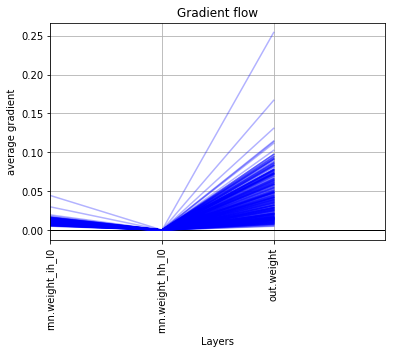

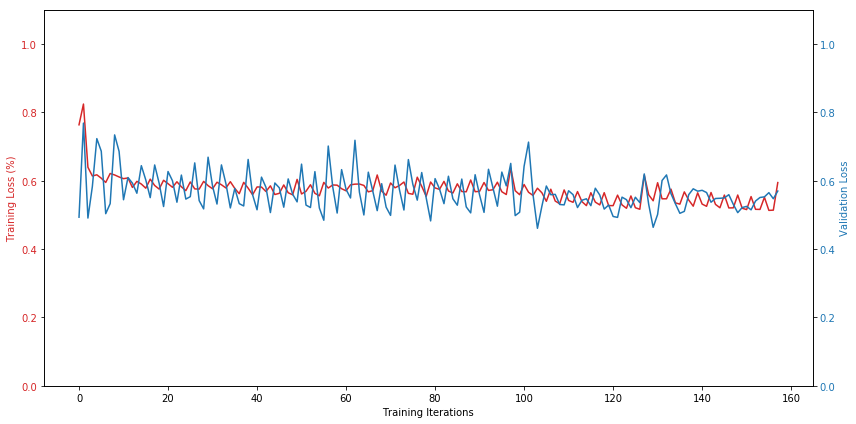

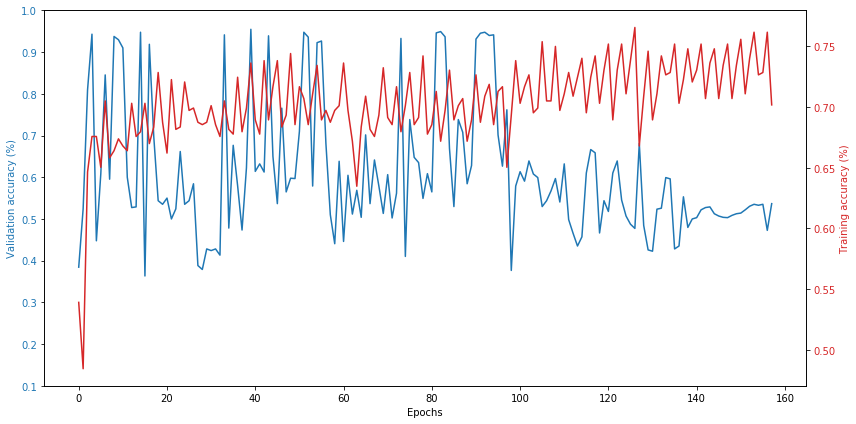

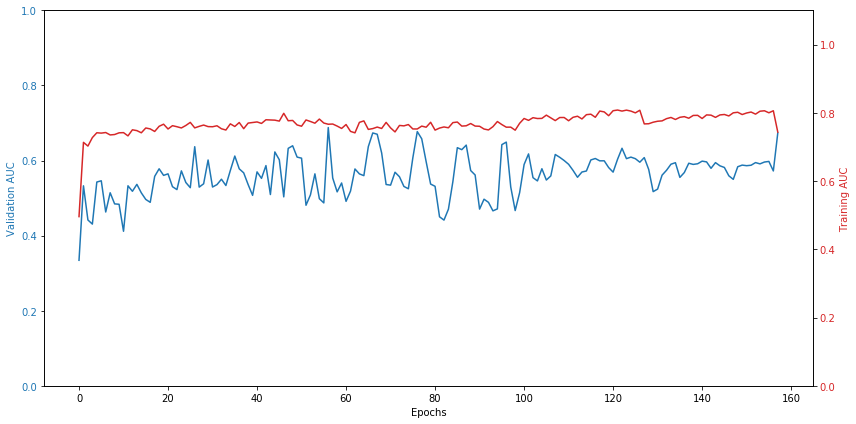

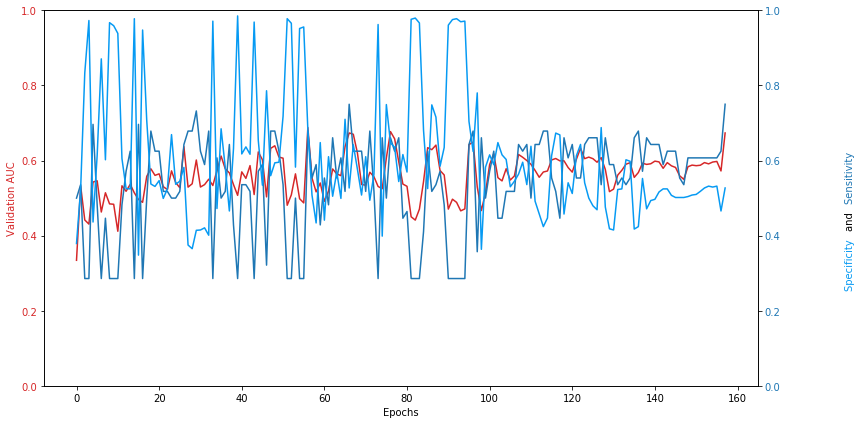


Fold  2
Number of confused training items before SMOTE:  308
Number of not_confused training items before SMOTE:  924
confused items in training set:  924
not_confused items in training set:  924
confused items in validation set:  32
not_confused items in validation set:  1252

Validation confused items:

['126a_V-SortTwoFactors-6-1.pkl', '126a_V-SortTwoFactors-6-2.pkl', '126a_V-SortTwoFactors-6-3.pkl', '126a_V-SortTwoFactors-6-4.pkl', '133a_H-CDV-16-1.pkl', '133a_H-CDV-16-2.pkl', '133a_H-CDV-16-3.pkl', '133a_H-CDV-16-4.pkl', '1b_V-CDV-17-1.pkl', '1b_V-CDV-17-2.pkl', '1b_V-CDV-17-3.pkl', '1b_V-CDV-17-4.pkl', '36a_V-SortTwoFactors-2-1.pkl', '36a_V-SortTwoFactors-2-2.pkl', '36a_V-SortTwoFactors-2-3.pkl', '36a_V-SortTwoFactors-2-4.pkl', '48a_V-SortTwoFactors-12-1.pkl', '48a_V-SortTwoFactors-12-2.pkl', '48a_V-SortTwoFactors-12-3.pkl', '48a_V-SortTwoFactors-12-4.pkl', '63a_H-SortTwoFactors-5-1.pkl', '63a_H-SortTwoFactors-5-2.pkl', '63a_H-SortTwoFactors-5-3.pkl', '63a_H-SortTwoFactors-5-4.p

Training accuracy for epoch:  0.6635044642857143
validation accuracy:  0.71015625
validation loss:  0.6353619694709778
validation recall:  0.59375
validation specificity:  0.7131410256410257
validation AUC:  0.6079226762820513
Epochs without improvement:  6
[epoch: 15, batches:     2] loss: 0.59429 | accuracy: 0.68164
[epoch: 15, batches:     4] loss: 0.60227 | accuracy: 0.65430
[epoch: 15, batches:     6] loss: 0.58642 | accuracy: 0.67383
Training accuracy for epoch:  0.671875
validation accuracy:  0.753125
validation loss:  0.6538619518280029
validation recall:  0.5625
validation specificity:  0.7580128205128205
validation AUC:  0.6024389022435899
Epochs without improvement:  7
[epoch: 16, batches:     2] loss: 0.59491 | accuracy: 0.66211
[epoch: 16, batches:     4] loss: 0.59915 | accuracy: 0.64844
[epoch: 16, batches:     6] loss: 0.58278 | accuracy: 0.69141
Training accuracy for epoch:  0.6696428571428571
validation accuracy:  0.5453125
validation loss:  0.6512503027915955
validat

[epoch: 32, batches:     4] loss: 0.56409 | accuracy: 0.66992
[epoch: 32, batches:     6] loss: 0.54430 | accuracy: 0.71289
Training accuracy for epoch:  0.6897321428571429
validation accuracy:  0.7796875
validation loss:  0.6096342444419861
validation recall:  0.5
validation specificity:  0.7868589743589743
validation AUC:  0.5683844150641026
Epochs without improvement:  24
[epoch: 33, batches:     2] loss: 0.56134 | accuracy: 0.69336
[epoch: 33, batches:     4] loss: 0.55990 | accuracy: 0.67969
[epoch: 33, batches:     6] loss: 0.54026 | accuracy: 0.71484
Training accuracy for epoch:  0.6930803571428571
validation accuracy:  0.784375
validation loss:  0.6062775135040284
validation recall:  0.46875
validation specificity:  0.7924679487179487
validation AUC:  0.5538862179487178
Epochs without improvement:  25
[epoch: 34, batches:     2] loss: 0.55988 | accuracy: 0.69336
[epoch: 34, batches:     4] loss: 0.55455 | accuracy: 0.68164
[epoch: 34, batches:     6] loss: 0.54026 | accuracy: 0

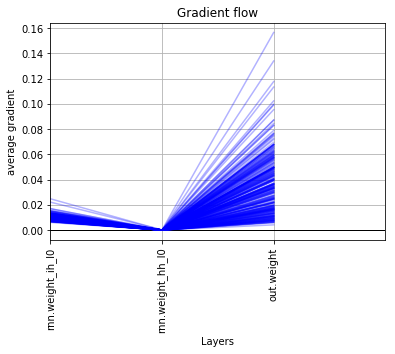

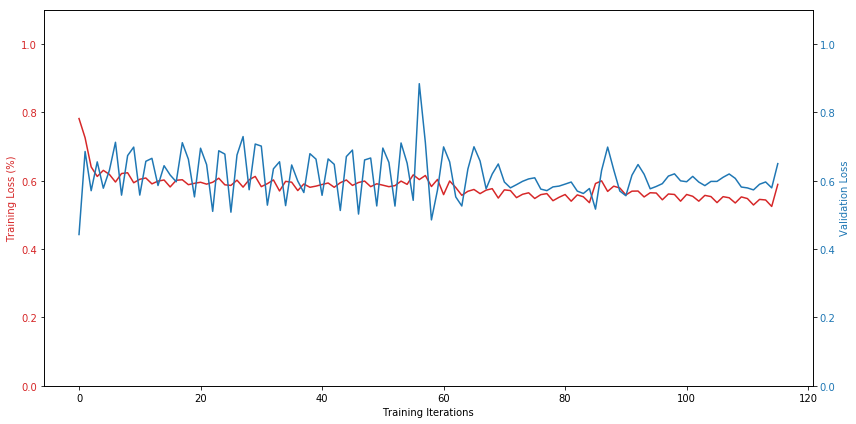

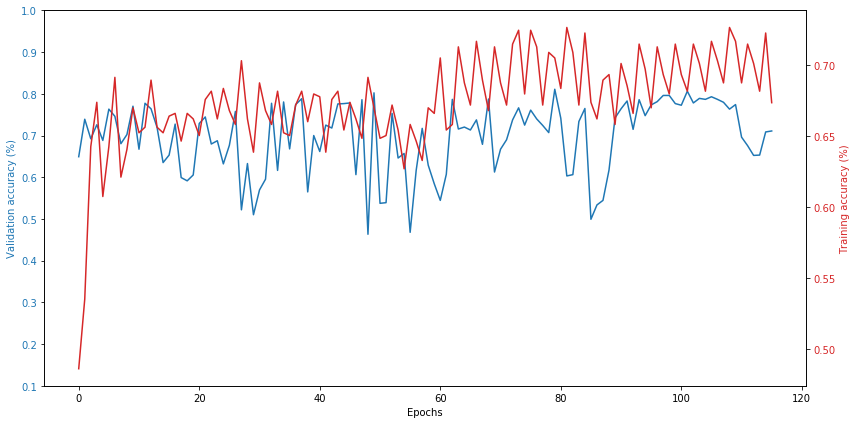

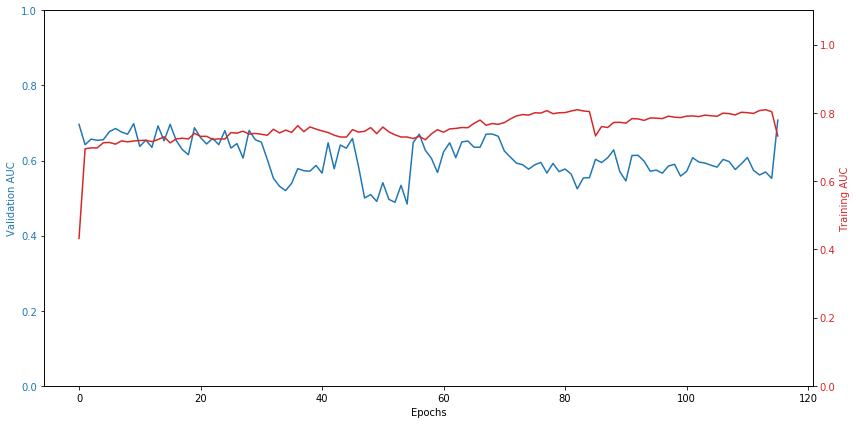

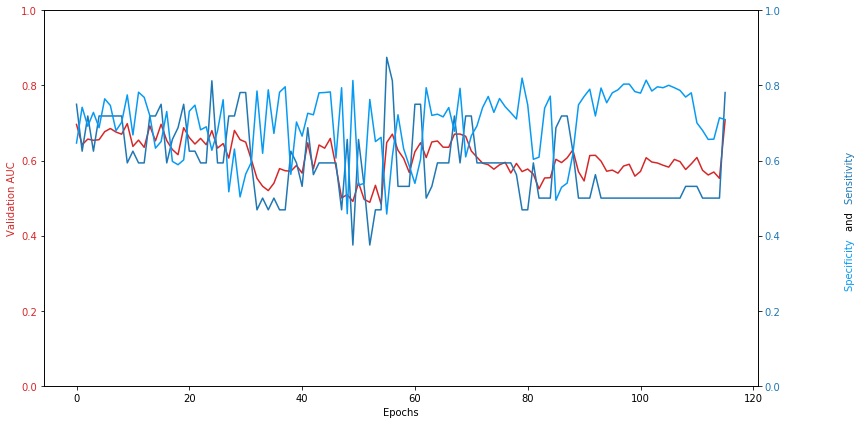


Fold  3
Number of confused training items before SMOTE:  300
Number of not_confused training items before SMOTE:  900
confused items in training set:  900
not_confused items in training set:  900
confused items in validation set:  40
not_confused items in validation set:  1244

Validation confused items:

['111a_H-SortTwoFactors-3-1.pkl', '111a_H-SortTwoFactors-3-2.pkl', '111a_H-SortTwoFactors-3-3.pkl', '111a_H-SortTwoFactors-3-4.pkl', '137a_H-FE-4-1.pkl', '137a_H-FE-4-2.pkl', '137a_H-FE-4-3.pkl', '137a_H-FE-4-4.pkl', '137a_H-SortTwoFactors-2-1.pkl', '137a_H-SortTwoFactors-2-2.pkl', '137a_H-SortTwoFactors-2-3.pkl', '137a_H-SortTwoFactors-2-4.pkl', '137b_V-FE-20-1.pkl', '137b_V-FE-20-2.pkl', '137b_V-FE-20-3.pkl', '137b_V-FE-20-4.pkl', '145b_V-SortTwoFactors-10-1.pkl', '145b_V-SortTwoFactors-10-2.pkl', '145b_V-SortTwoFactors-10-3.pkl', '145b_V-SortTwoFactors-10-4.pkl', '145b_V-SortTwoFactors-24-1.pkl', '145b_V-SortTwoFactors-24-2.pkl', '145b_V-SortTwoFactors-24-3.pkl', '145b_V-SortTwoFa

[epoch: 14, batches:     2] loss: 0.56643 | accuracy: 0.68164
[epoch: 14, batches:     4] loss: 0.57298 | accuracy: 0.68164
[epoch: 14, batches:     6] loss: 0.56869 | accuracy: 0.69141
Training accuracy for epoch:  0.6875
validation accuracy:  0.5265625
validation loss:  0.6163204908370972
validation recall:  0.65
validation specificity:  0.5225806451612903
validation AUC:  0.5538306451612903
Epochs without improvement:  1
[epoch: 15, batches:     2] loss: 0.55966 | accuracy: 0.70117
[epoch: 15, batches:     4] loss: 0.57699 | accuracy: 0.70117
[epoch: 15, batches:     6] loss: 0.58904 | accuracy: 0.67578
Training accuracy for epoch:  0.6902901785714286
validation accuracy:  0.55390625
validation loss:  0.7360389232635498
validation recall:  0.625
validation specificity:  0.5516129032258065
validation AUC:  0.5015524193548386
Epochs without improvement:  2
[epoch: 16, batches:     2] loss: 0.56639 | accuracy: 0.70508
[epoch: 16, batches:     4] loss: 0.57677 | accuracy: 0.68945
[epoch

[epoch: 32, batches:     6] loss: 0.55251 | accuracy: 0.70117
Training accuracy for epoch:  0.7081473214285714
validation accuracy:  0.640625
validation loss:  0.5542783737182617
validation recall:  0.575
validation specificity:  0.6427419354838709
validation AUC:  0.5800000000000001
Epochs without improvement:  19
[epoch: 33, batches:     2] loss: 0.52872 | accuracy: 0.70898
[epoch: 33, batches:     4] loss: 0.55363 | accuracy: 0.71484
[epoch: 33, batches:     6] loss: 0.53375 | accuracy: 0.70898
Training accuracy for epoch:  0.7114955357142857
validation accuracy:  0.71640625
validation loss:  0.5285871386528015
validation recall:  0.575
validation specificity:  0.7209677419354839
validation AUC:  0.5904939516129033
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.0015
New learning rate: 0.00075
Validation AUC:  0.6017137096774194
Validation Loss:  0.5802544355392456
Epochs without improvement:  20
[epoch: 34, batches:     2] loss: 0.5671

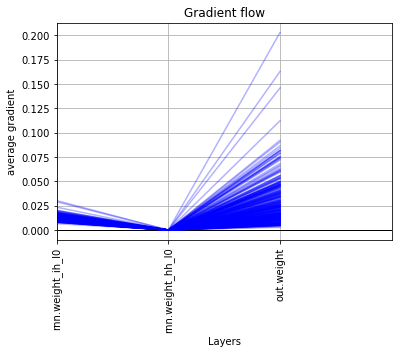

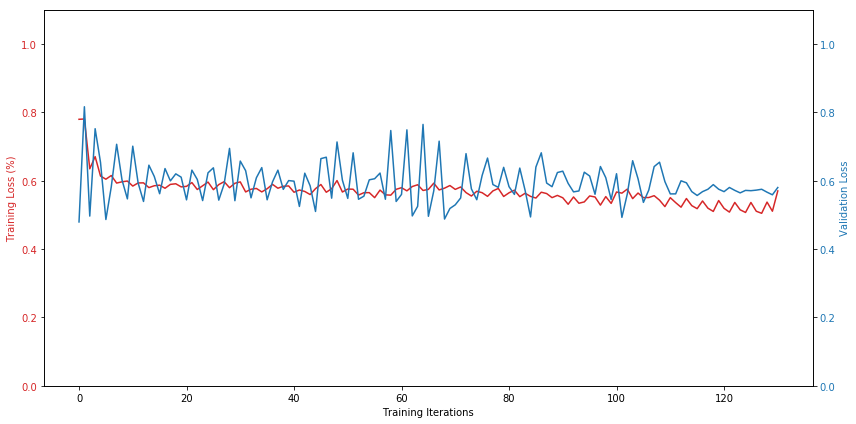

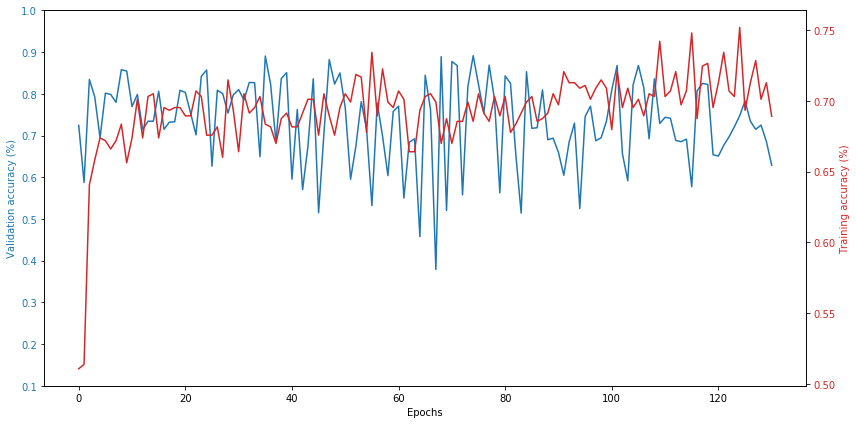

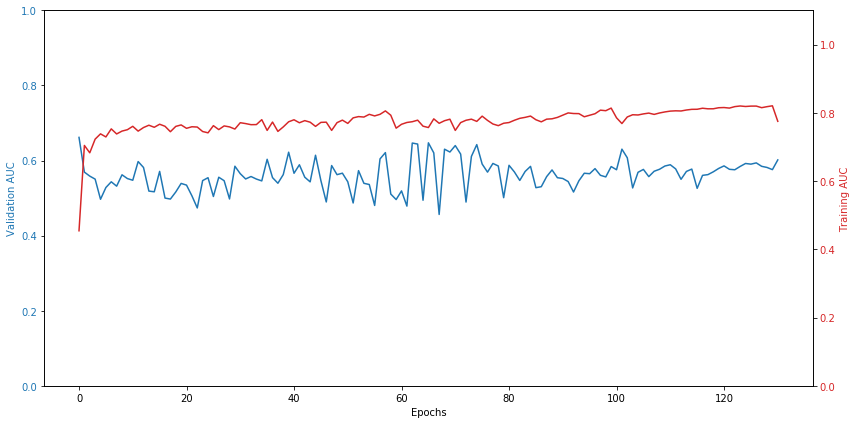

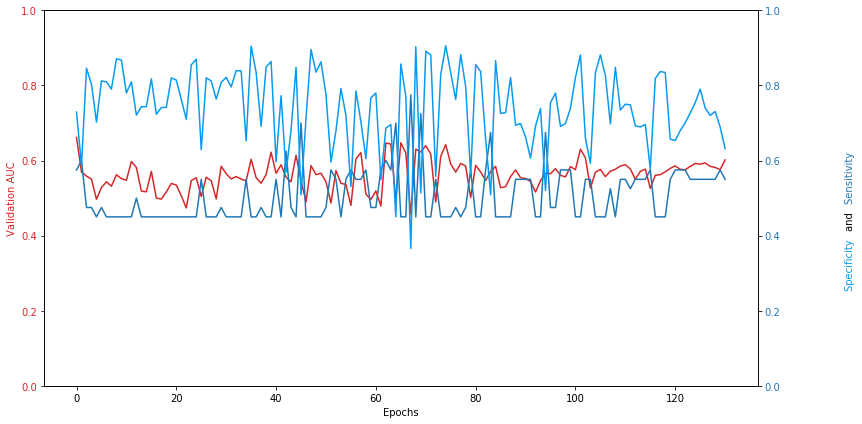


Fold  4
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['58a_V-SortTwoFactors-14-1.pkl', '58a_V-SortTwoFactors-14-2.pkl', '58a_V-SortTwoFactors-14-3.pkl', '58a_V-SortTwoFactors-14-4.pkl', '58a_V-SortTwoFactors-23-1.pkl', '58a_V-SortTwoFactors-23-2.pkl', '58a_V-SortTwoFactors-23-3.pkl', '58a_V-SortTwoFactors-23-4.pkl', '58a_V-SortTwoFactors-6-1.pkl', '58a_V-SortTwoFactors-6-2.pkl', '58a_V-SortTwoFactors-6-3.pkl', '58a_V-SortTwoFactors-6-4.pkl', '86a_V-FE-10-1.pkl', '86a_V-FE-10-2.pkl', '86a_V-FE-10-3.pkl', '86a_V-FE-10-4.pkl', '86a_V-SortTwoFactors-4-1.pkl', '86a_V-SortTwoFactors-4-2.pkl', '86a_V-SortTwoFactors-4-3.pkl', '86a_V-SortTwoFactors-4-4.pkl', '86b_H-CDV-6-1.pkl', '86b_H-CDV-6-2.pkl', '86b_H-CDV-6-3.pkl', '86b_H-CDV-6-4.pkl']

Tr

[epoch: 15, batches:     2] loss: 0.62558 | accuracy: 0.64258
[epoch: 15, batches:     4] loss: 0.59783 | accuracy: 0.66602
[epoch: 15, batches:     6] loss: 0.60613 | accuracy: 0.67578
Training accuracy for epoch:  0.6607142857142857
validation accuracy:  0.715625
validation loss:  0.5668791055679321
validation recall:  0.75
validation specificity:  0.714968152866242
validation AUC:  0.7467323513800425
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.003
New learning rate: 0.0015
Validation AUC:  0.8413946390658174
Validation Loss:  0.6231798529624939
Epochs without improvement:  10
[epoch: 16, batches:     2] loss: 0.64228 | accuracy: 0.61523
[epoch: 16, batches:     4] loss: 0.61310 | accuracy: 0.66016
[epoch: 16, batches:     6] loss: 0.62896 | accuracy: 0.66016
Training accuracy for epoch:  0.6434151785714286
validation accuracy:  0.90703125
validation loss:  0.6285580515861511
validation recall:  0.625
validation specificity:  0.91242

[epoch: 32, batches:     4] loss: 0.57783 | accuracy: 0.68555
[epoch: 32, batches:     6] loss: 0.59084 | accuracy: 0.67383
Training accuracy for epoch:  0.6735491071428571
validation accuracy:  0.6796875
validation loss:  0.555055558681488
validation recall:  0.8333333333333334
validation specificity:  0.6767515923566879
validation AUC:  0.7687765392781316
Epochs without improvement:  13
[epoch: 33, batches:     2] loss: 0.58849 | accuracy: 0.66016
[epoch: 33, batches:     4] loss: 0.57836 | accuracy: 0.69336
[epoch: 33, batches:     6] loss: 0.58951 | accuracy: 0.68945
Training accuracy for epoch:  0.6774553571428571
validation accuracy:  0.69140625
validation loss:  0.577558696269989
validation recall:  0.8333333333333334
validation specificity:  0.6886942675159236
validation AUC:  0.7982683121019108
Epochs without improvement:  14
[epoch: 34, batches:     2] loss: 0.58645 | accuracy: 0.65430
[epoch: 34, batches:     4] loss: 0.57413 | accuracy: 0.68555
[epoch: 34, batches:     6] l

validation accuracy:  0.73125
validation loss:  0.5873592376708985
validation recall:  0.8333333333333334
validation specificity:  0.7292993630573248
validation AUC:  0.8479299363057324


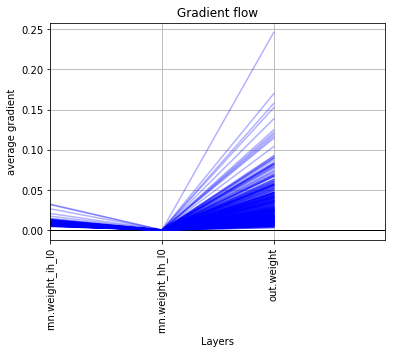

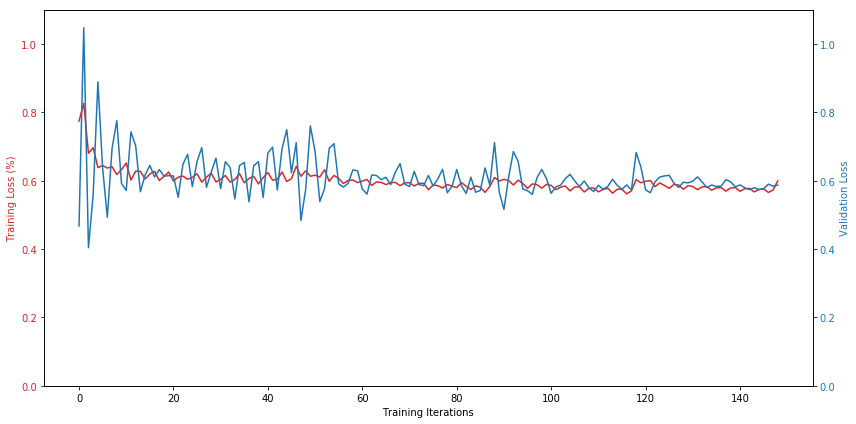

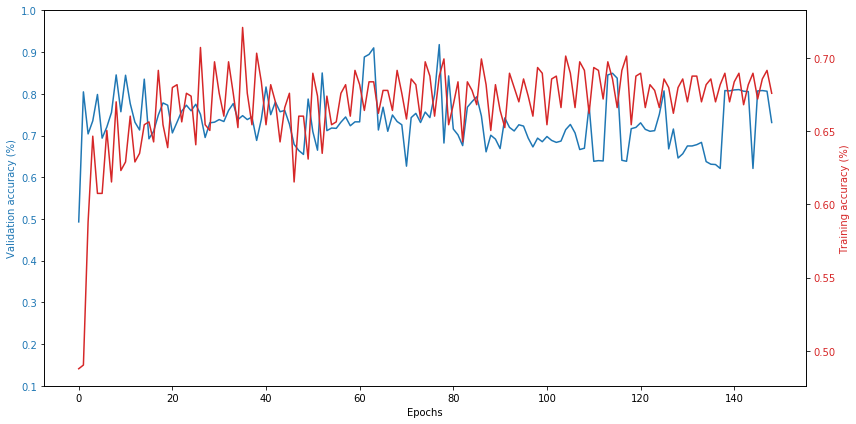

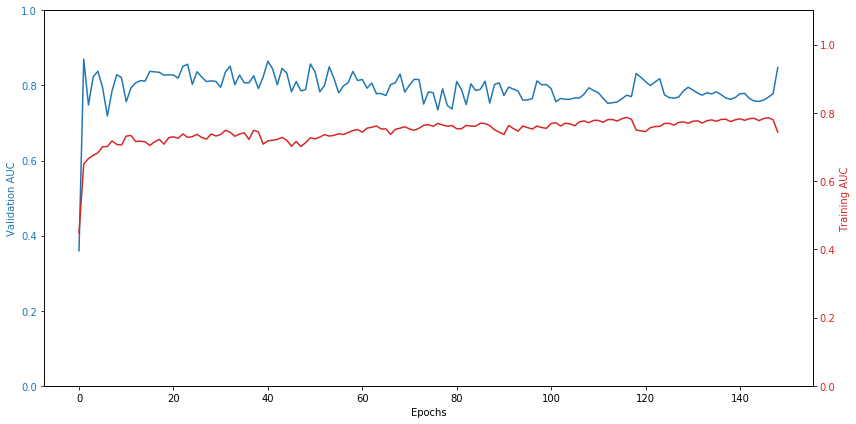

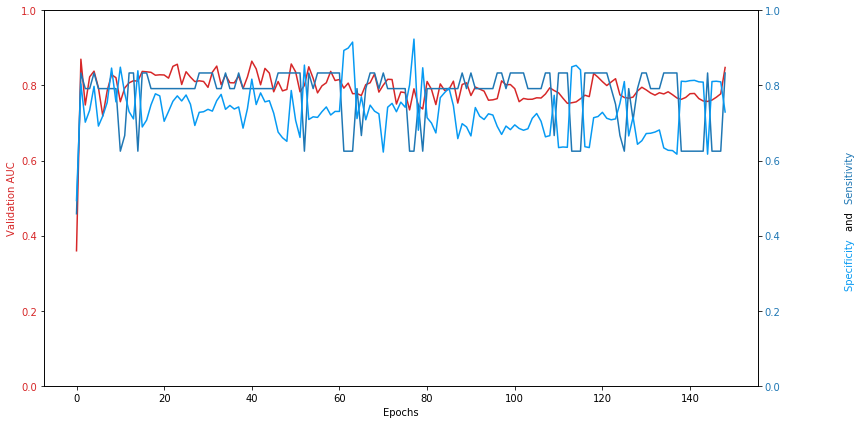


Fold  5
Number of confused training items before SMOTE:  316
Number of not_confused training items before SMOTE:  948
confused items in training set:  948
not_confused items in training set:  948
confused items in validation set:  24
not_confused items in validation set:  1260

Validation confused items:

['122a_V-SortTwoFactors-4-1.pkl', '122a_V-SortTwoFactors-4-2.pkl', '122a_V-SortTwoFactors-4-3.pkl', '122a_V-SortTwoFactors-4-4.pkl', '142a_V-CDV-15-1.pkl', '142a_V-CDV-15-2.pkl', '142a_V-CDV-15-3.pkl', '142a_V-CDV-15-4.pkl', '142b_H-CDV-22-1.pkl', '142b_H-CDV-22-2.pkl', '142b_H-CDV-22-3.pkl', '142b_H-CDV-22-4.pkl', '25a_H-RV-22-1.pkl', '25a_H-RV-22-2.pkl', '25a_H-RV-22-3.pkl', '25a_H-RV-22-4.pkl', '32a_V-SortTwoFactors-11-1.pkl', '32a_V-SortTwoFactors-11-2.pkl', '32a_V-SortTwoFactors-11-3.pkl', '32a_V-SortTwoFactors-11-4.pkl', '82a_V-SortTwoFactors-4-1.pkl', '82a_V-SortTwoFactors-4-2.pkl', '82a_V-SortTwoFactors-4-3.pkl', '82a_V-SortTwoFactors-4-4.pkl']

Training data:  Dataset Datase

[epoch: 15, batches:     2] loss: 0.62352 | accuracy: 0.65430
[epoch: 15, batches:     4] loss: 0.58207 | accuracy: 0.68164
[epoch: 15, batches:     6] loss: 0.60207 | accuracy: 0.67578
Training accuracy for epoch:  0.67578125
validation accuracy:  0.91875
validation loss:  0.6098130464553833
validation recall:  0.4166666666666667
validation specificity:  0.928343949044586
validation AUC:  0.4936637473460722
Epochs without improvement:  14
[epoch: 16, batches:     2] loss: 0.59681 | accuracy: 0.67969
[epoch: 16, batches:     4] loss: 0.57620 | accuracy: 0.69336
[epoch: 16, batches:     6] loss: 0.60118 | accuracy: 0.67578
Training accuracy for epoch:  0.6847098214285714
validation accuracy:  0.92265625
validation loss:  0.5388099610805511
validation recall:  0.4166666666666667
validation specificity:  0.9323248407643312
validation AUC:  0.5098527070063695
Epochs without improvement:  15
[epoch: 17, batches:     2] loss: 0.59994 | accuracy: 0.66211
[epoch: 17, batches:     4] loss: 0.56

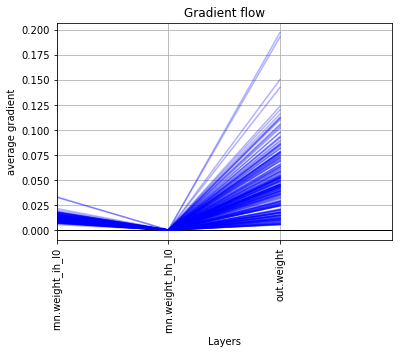

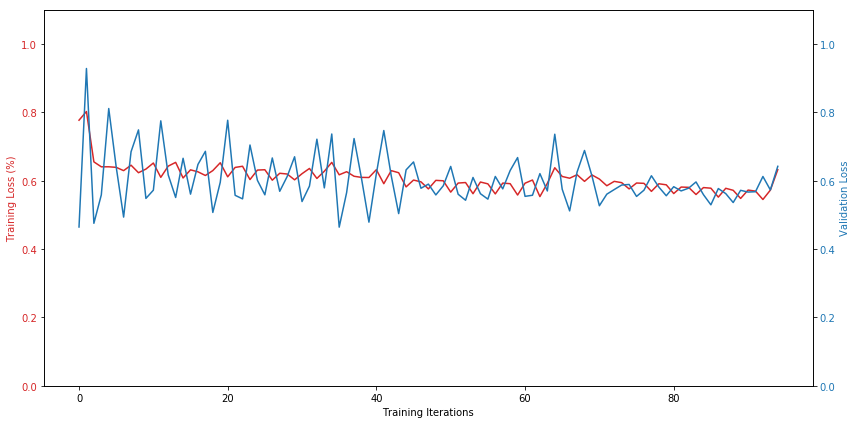

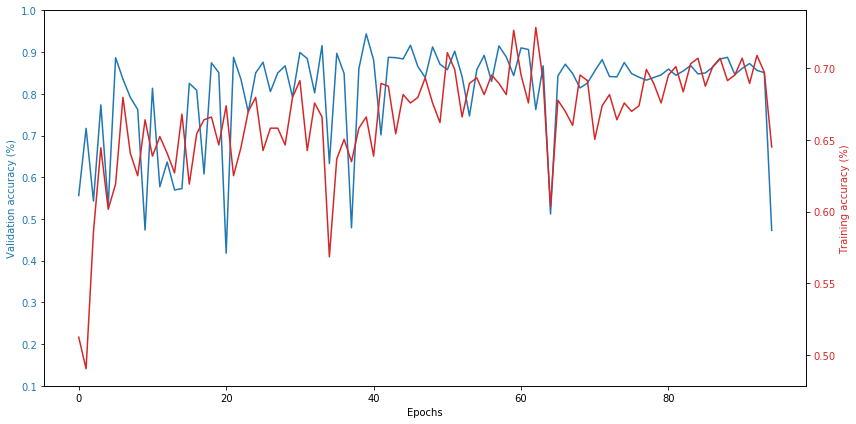

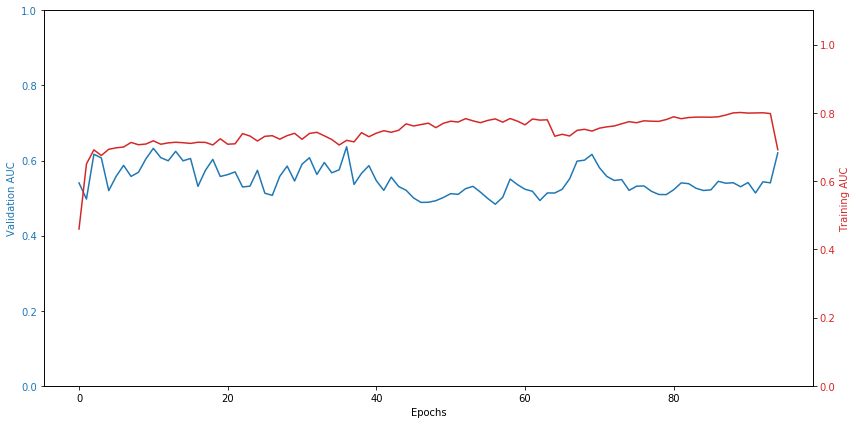

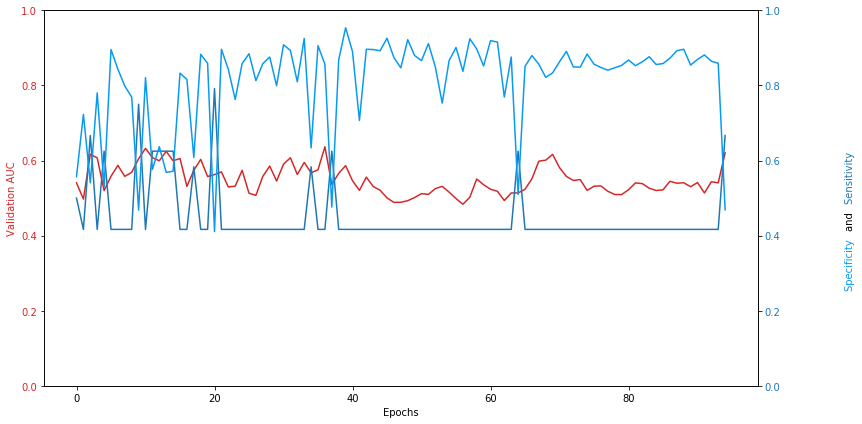


Fold  6
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1272

Validation confused items:

['10a_V-CDV-2-1.pkl', '10a_V-CDV-2-2.pkl', '10a_V-CDV-2-3.pkl', '10a_V-CDV-2-4.pkl', '12b_H-CDV-5-1.pkl', '12b_H-CDV-5-2.pkl', '12b_H-CDV-5-3.pkl', '12b_H-CDV-5-4.pkl', '3a_H-SortTwoFactors-11-1.pkl', '3a_H-SortTwoFactors-11-2.pkl', '3a_H-SortTwoFactors-11-3.pkl', '3a_H-SortTwoFactors-11-4.pkl', '9a_H-SortTwoFactors-12-1.pkl', '9a_H-SortTwoFactors-12-2.pkl', '9a_H-SortTwoFactors-12-3.pkl', '9a_H-SortTwoFactors-12-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1288
    Root Loca

[epoch: 16, batches:     2] loss: 0.58437 | accuracy: 0.69727
[epoch: 16, batches:     4] loss: 0.58637 | accuracy: 0.67188
[epoch: 16, batches:     6] loss: 0.58016 | accuracy: 0.68555
Training accuracy for epoch:  0.6808035714285714
validation accuracy:  0.79453125
validation loss:  0.5745189547538757
validation recall:  0.75
validation specificity:  0.7950949367088608
validation AUC:  0.7783326740506329
Epochs without improvement:  4
[epoch: 17, batches:     2] loss: 0.58277 | accuracy: 0.70898
[epoch: 17, batches:     4] loss: 0.58430 | accuracy: 0.67578
[epoch: 17, batches:     6] loss: 0.58168 | accuracy: 0.66992
Training accuracy for epoch:  0.6808035714285714
validation accuracy:  0.8390625
validation loss:  0.5467964231967926
validation recall:  0.75
validation specificity:  0.8401898734177216
validation AUC:  0.7309632120253164
Epochs without improvement:  5
[epoch: 18, batches:     2] loss: 0.57997 | accuracy: 0.70117
[epoch: 18, batches:     4] loss: 0.58100 | accuracy: 0.6

[epoch: 34, batches:     2] loss: 0.56157 | accuracy: 0.69336
[epoch: 34, batches:     4] loss: 0.55472 | accuracy: 0.70117
[epoch: 34, batches:     6] loss: 0.56100 | accuracy: 0.68945
Training accuracy for epoch:  0.6936383928571429
validation accuracy:  0.85703125
validation loss:  0.5711860537528992
validation recall:  0.75
validation specificity:  0.8583860759493671
validation AUC:  0.7878263449367088
Epochs without improvement:  6
[epoch: 35, batches:     2] loss: 0.56026 | accuracy: 0.71289
[epoch: 35, batches:     4] loss: 0.54938 | accuracy: 0.70898
[epoch: 35, batches:     6] loss: 0.55633 | accuracy: 0.70703
Training accuracy for epoch:  0.7098214285714286
validation accuracy:  0.83671875
validation loss:  0.5519095659255981
validation recall:  0.75
validation specificity:  0.8378164556962026
validation AUC:  0.80078125
Epochs without improvement:  7
[epoch: 36, batches:     2] loss: 0.55763 | accuracy: 0.71094
[epoch: 36, batches:     4] loss: 0.54906 | accuracy: 0.69922
[e

[epoch: 52, batches:     2] loss: 0.56361 | accuracy: 0.70898
[epoch: 52, batches:     4] loss: 0.55991 | accuracy: 0.70312
[epoch: 52, batches:     6] loss: 0.56128 | accuracy: 0.69531
Training accuracy for epoch:  0.69921875
validation accuracy:  0.86171875
validation loss:  0.5909064054489136
validation recall:  0.75
validation specificity:  0.8631329113924051
validation AUC:  0.806912579113924
Epochs without improvement:  24
[epoch: 53, batches:     2] loss: 0.56095 | accuracy: 0.71094
[epoch: 53, batches:     4] loss: 0.55806 | accuracy: 0.70117
[epoch: 53, batches:     6] loss: 0.56007 | accuracy: 0.70117
Training accuracy for epoch:  0.7014508928571429
validation accuracy:  0.86953125
validation loss:  0.593170428276062
validation recall:  0.75
validation specificity:  0.8710443037974683
validation AUC:  0.8111155063291139
Epochs without improvement:  25
[epoch: 54, batches:     2] loss: 0.55942 | accuracy: 0.70898
[epoch: 54, batches:     4] loss: 0.55582 | accuracy: 0.70312
[e

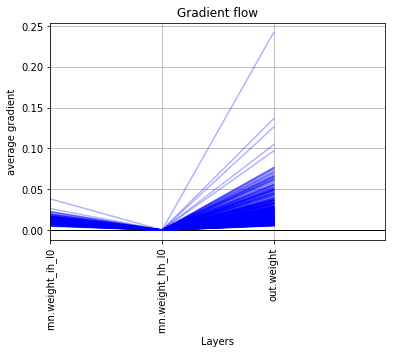

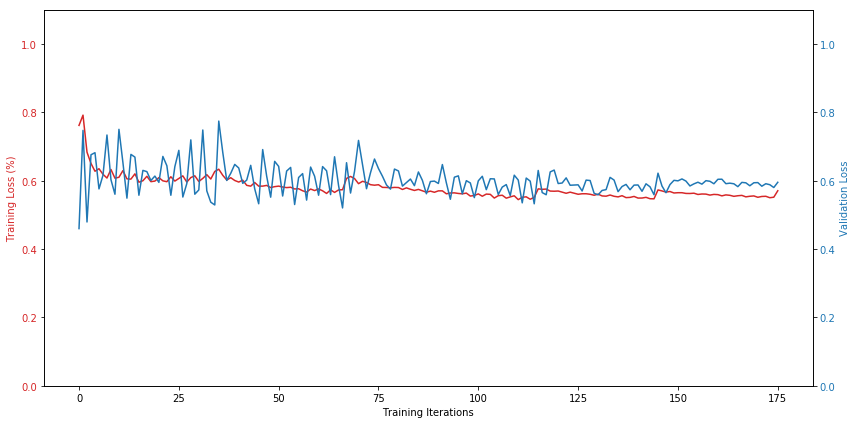

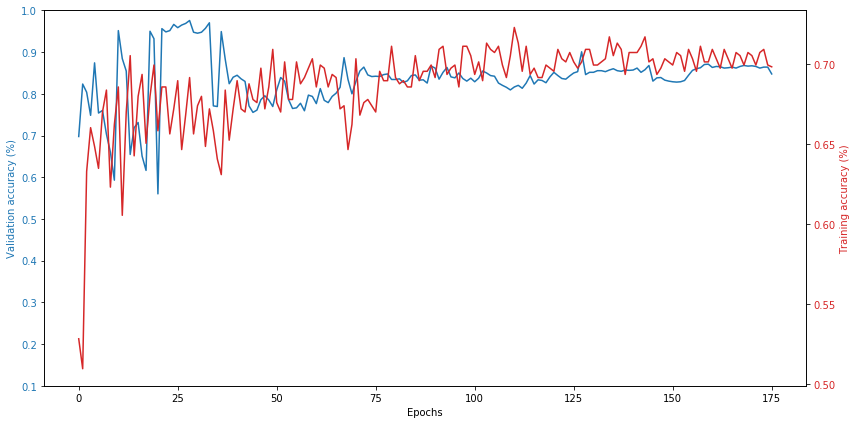

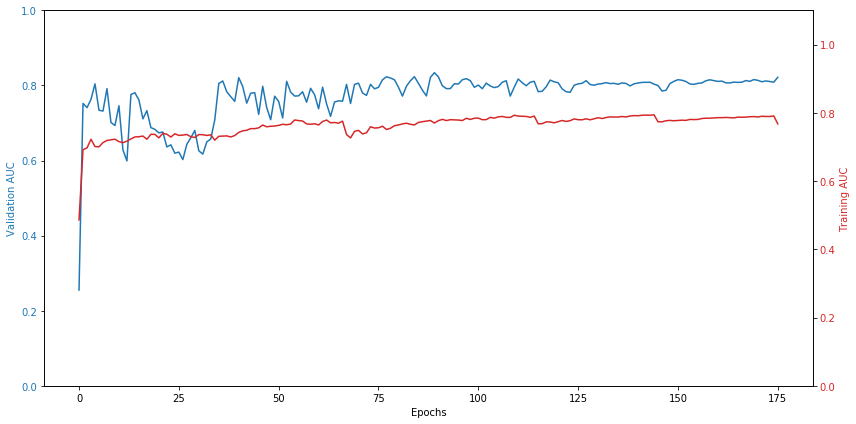

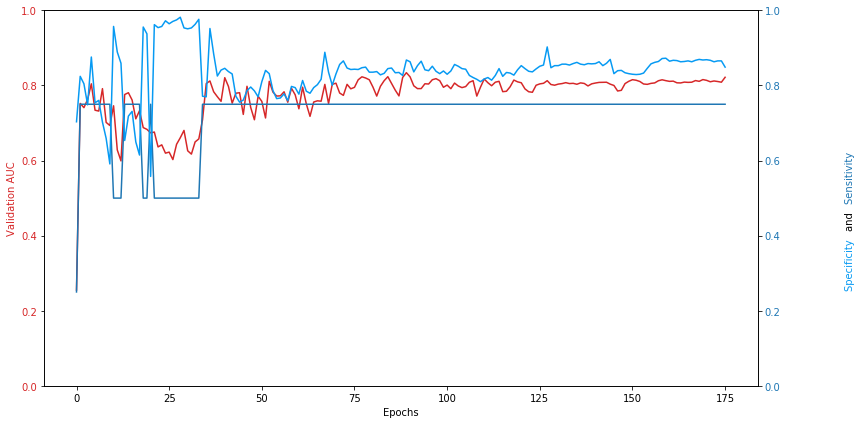


Fold  7
Number of confused training items before SMOTE:  296
Number of not_confused training items before SMOTE:  888
confused items in training set:  888
not_confused items in training set:  888
confused items in validation set:  44
not_confused items in validation set:  1240

Validation confused items:

['105a_H-FE-17-1.pkl', '105a_H-FE-17-2.pkl', '105a_H-FE-17-3.pkl', '105a_H-FE-17-4.pkl', '105a_H-RV-22-1.pkl', '105a_H-RV-22-2.pkl', '105a_H-RV-22-3.pkl', '105a_H-RV-22-4.pkl', '105a_H-RV-8-1.pkl', '105a_H-RV-8-2.pkl', '105a_H-RV-8-3.pkl', '105a_H-RV-8-4.pkl', '105b_V-FE-20-1.pkl', '105b_V-FE-20-2.pkl', '105b_V-FE-20-3.pkl', '105b_V-FE-20-4.pkl', '105b_V-FE-8-1.pkl', '105b_V-FE-8-2.pkl', '105b_V-FE-8-3.pkl', '105b_V-FE-8-4.pkl', '105b_V-RV-5-1.pkl', '105b_V-RV-5-2.pkl', '105b_V-RV-5-3.pkl', '105b_V-RV-5-4.pkl', '134b_H-CDV-15-1.pkl', '134b_H-CDV-15-2.pkl', '134b_H-CDV-15-3.pkl', '134b_H-CDV-15-4.pkl', '134b_H-CDV-4-1.pkl', '134b_H-CDV-4-2.pkl', '134b_H-CDV-4-3.pkl', '134b_H-CDV-4-4.p

[epoch: 14, batches:     2] loss: 0.61689 | accuracy: 0.62695
[epoch: 14, batches:     4] loss: 0.63937 | accuracy: 0.61523
[epoch: 14, batches:     6] loss: 0.59732 | accuracy: 0.67578
Training accuracy for epoch:  0.6393229166666666
validation accuracy:  0.83125
validation loss:  0.5703318178653717
validation recall:  0.6136363636363636
validation specificity:  0.8389967637540453
validation AUC:  0.6344513092085908
Epochs without improvement:  2
[epoch: 15, batches:     2] loss: 0.61597 | accuracy: 0.63672
[epoch: 15, batches:     4] loss: 0.63918 | accuracy: 0.61523
[epoch: 15, batches:     6] loss: 0.58574 | accuracy: 0.68750
Training accuracy for epoch:  0.646484375
validation accuracy:  0.67109375
validation loss:  0.5989604115486145
validation recall:  0.7272727272727273
validation specificity:  0.669093851132686
validation AUC:  0.6571969696969697
Epochs without improvement:  3
[epoch: 16, batches:     2] loss: 0.61248 | accuracy: 0.62305
[epoch: 16, batches:     4] loss: 0.636

[epoch: 32, batches:     2] loss: 0.58737 | accuracy: 0.66016
[epoch: 32, batches:     4] loss: 0.60149 | accuracy: 0.64453
[epoch: 32, batches:     6] loss: 0.56598 | accuracy: 0.69727
Training accuracy for epoch:  0.6673177083333334
validation accuracy:  0.67890625
validation loss:  0.5901918172836303
validation recall:  0.7045454545454546
validation specificity:  0.6779935275080906
validation AUC:  0.6871966019417476
No increase in validation AUC score in 10 epochs. Reducing learning rate.
Old learning rate: 0.0015
New learning rate: 0.00075
Validation AUC:  0.7075334657252133
Validation Loss:  0.631666612625122
Epochs without improvement:  20
[epoch: 33, batches:     2] loss: 0.61788 | accuracy: 0.60742
[epoch: 33, batches:     4] loss: 0.63167 | accuracy: 0.61133
[epoch: 33, batches:     6] loss: 0.58878 | accuracy: 0.65430
Training accuracy for epoch:  0.6243489583333334
validation accuracy:  0.78515625
validation loss:  0.5401438772678375
validation recall:  0.6136363636363636
v

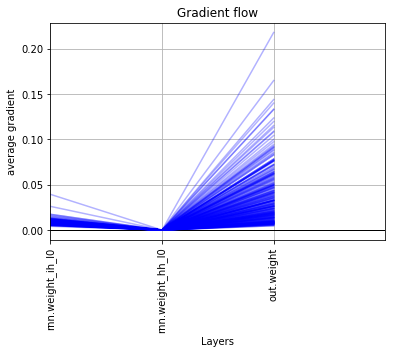

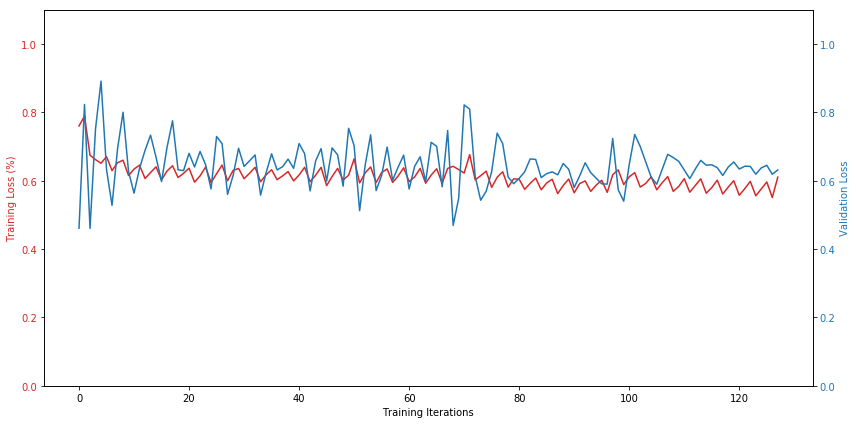

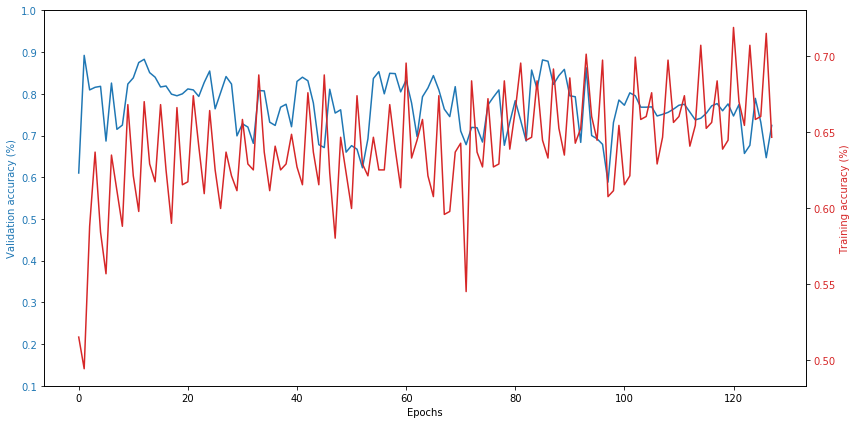

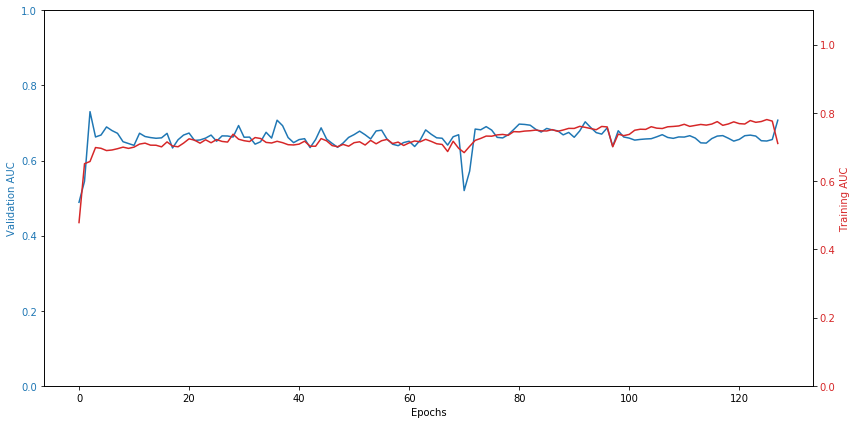

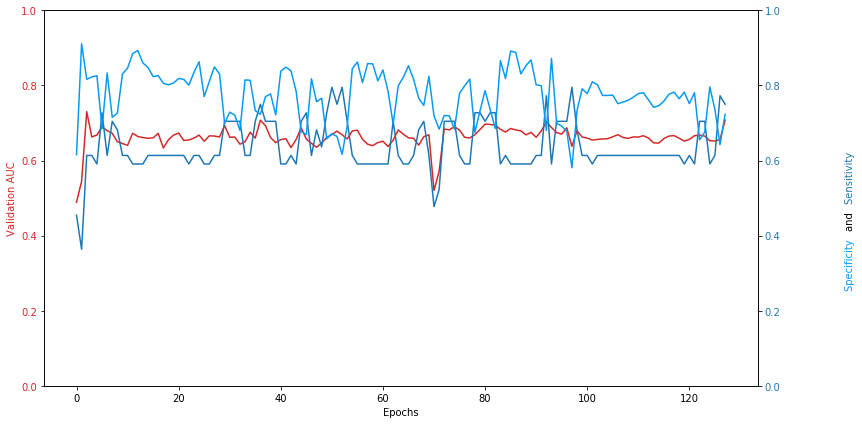


Fold  8
Number of confused training items before SMOTE:  304
Number of not_confused training items before SMOTE:  912
confused items in training set:  912
not_confused items in training set:  912
confused items in validation set:  36
not_confused items in validation set:  1248

Validation confused items:

['121a_H-CDV-9-1.pkl', '121a_H-CDV-9-2.pkl', '121a_H-CDV-9-3.pkl', '121a_H-CDV-9-4.pkl', '121a_H-SortTwoFactors-20-1.pkl', '121a_H-SortTwoFactors-20-2.pkl', '121a_H-SortTwoFactors-20-3.pkl', '121a_H-SortTwoFactors-20-4.pkl', '121b_V-FE-2-1.pkl', '121b_V-FE-2-2.pkl', '121b_V-FE-2-3.pkl', '121b_V-FE-2-4.pkl', '121b_V-SortTwoFactors-11-1.pkl', '121b_V-SortTwoFactors-11-2.pkl', '121b_V-SortTwoFactors-11-3.pkl', '121b_V-SortTwoFactors-11-4.pkl', '129b_V-SortTwoFactors-23-1.pkl', '129b_V-SortTwoFactors-23-2.pkl', '129b_V-SortTwoFactors-23-3.pkl', '129b_V-SortTwoFactors-23-4.pkl', '141a_H-RV-18-1.pkl', '141a_H-RV-18-2.pkl', '141a_H-RV-18-3.pkl', '141a_H-RV-18-4.pkl', '141a_H-SortTwoFactors-

[epoch: 14, batches:     2] loss: 0.57265 | accuracy: 0.70117
[epoch: 14, batches:     4] loss: 0.60803 | accuracy: 0.65820
[epoch: 14, batches:     6] loss: 0.58475 | accuracy: 0.67188
Training accuracy for epoch:  0.6802455357142857
validation accuracy:  0.61796875
validation loss:  0.6432403802871705
validation recall:  0.5277777777777778
validation specificity:  0.6205787781350482
validation AUC:  0.5584137191854235
Epochs without improvement:  13
[epoch: 15, batches:     2] loss: 0.56435 | accuracy: 0.71094
[epoch: 15, batches:     4] loss: 0.58989 | accuracy: 0.67578
[epoch: 15, batches:     6] loss: 0.58297 | accuracy: 0.67578
Training accuracy for epoch:  0.6875
validation accuracy:  0.70078125
validation loss:  0.5890858054161072
validation recall:  0.5833333333333334
validation specificity:  0.7041800643086816
validation AUC:  0.5850750267952841
Epochs without improvement:  14
[epoch: 16, batches:     2] loss: 0.55762 | accuracy: 0.71289
[epoch: 16, batches:     4] loss: 0.58

validation accuracy:  0.578125
validation loss:  0.7591316223144531
validation recall:  0.7777777777777778
validation specificity:  0.572347266881029
validation AUC:  0.6513933547695605


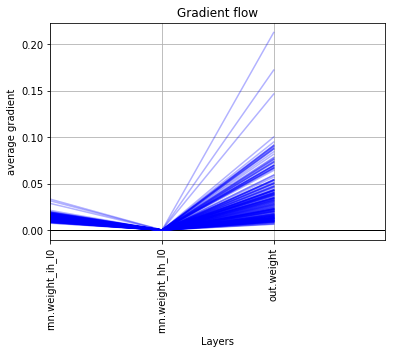

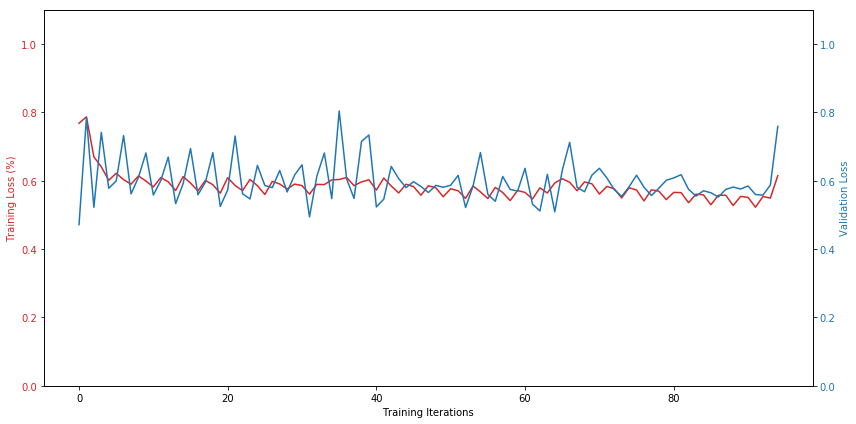

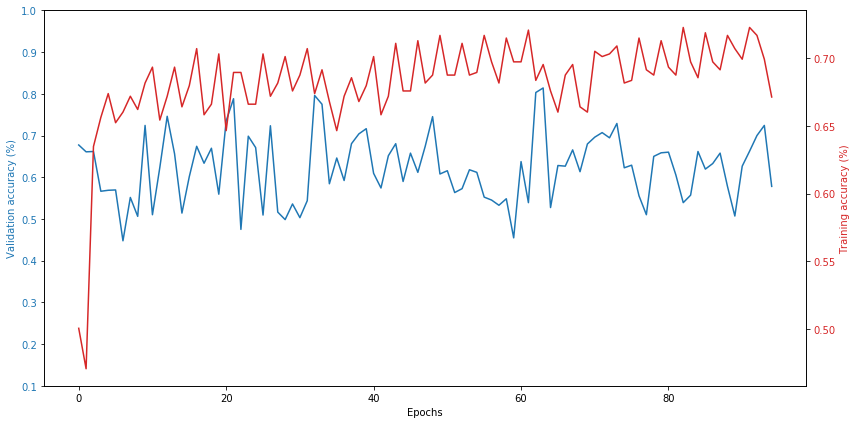

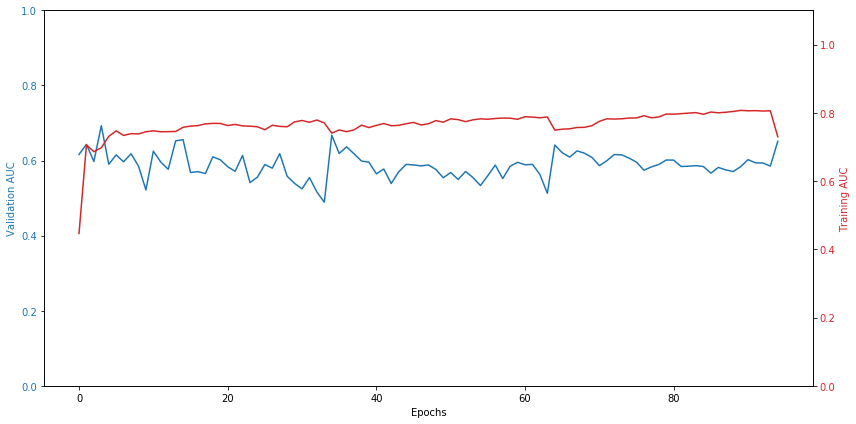

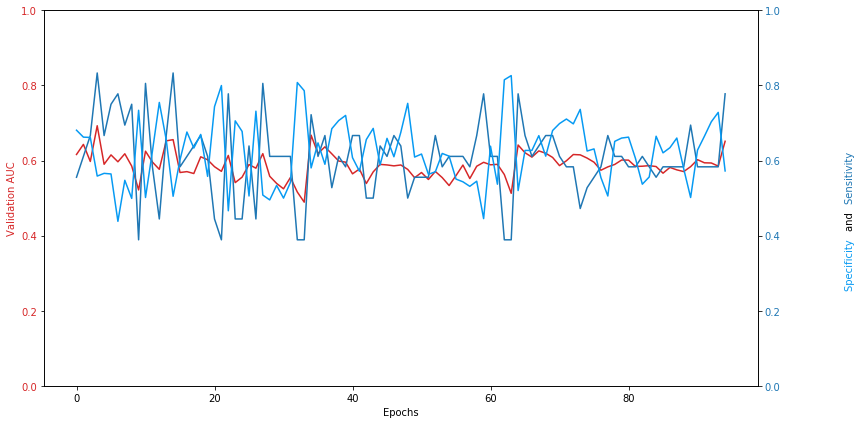


Fold  9
Number of confused training items before SMOTE:  324
Number of not_confused training items before SMOTE:  972
confused items in training set:  972
not_confused items in training set:  972
confused items in validation set:  16
not_confused items in validation set:  1268

Validation confused items:

['103a_H-CDV-12-1.pkl', '103a_H-CDV-12-2.pkl', '103a_H-CDV-12-3.pkl', '103a_H-CDV-12-4.pkl', '103a_H-CDV-17-1.pkl', '103a_H-CDV-17-2.pkl', '103a_H-CDV-17-3.pkl', '103a_H-CDV-17-4.pkl', '11a_H-SortTwoFactors-5-1.pkl', '11a_H-SortTwoFactors-5-2.pkl', '11a_H-SortTwoFactors-5-3.pkl', '11a_H-SortTwoFactors-5-4.pkl', '143a_H-CDV-17-1.pkl', '143a_H-CDV-17-2.pkl', '143a_H-CDV-17-3.pkl', '143a_H-CDV-17-4.pkl']

Training data:  Dataset DatasetFolder
    Number of datapoints: 1944
    Root Location: ./dataset/augmented/train/
    Transforms (if any): None
    Target Transforms (if any): None
Validation data:  Dataset DatasetFolder
    Number of datapoints: 1284
    Root Location: ./dataset/augm

[epoch: 15, batches:     6] loss: 0.61683 | accuracy: 0.66602
Training accuracy for epoch:  0.6551339285714286
validation accuracy:  0.921875
validation loss:  0.4791396617889404
validation recall:  0.4375
validation specificity:  0.928006329113924
validation AUC:  0.4691950158227848
Epochs without improvement:  8
[epoch: 16, batches:     2] loss: 0.60546 | accuracy: 0.66602
[epoch: 16, batches:     4] loss: 0.61603 | accuracy: 0.66016
[epoch: 16, batches:     6] loss: 0.61806 | accuracy: 0.64648
Training accuracy for epoch:  0.6529017857142857
validation accuracy:  0.91875
validation loss:  0.5035724759101867
validation recall:  0.4375
validation specificity:  0.9248417721518988
validation AUC:  0.4532238924050632
Epochs without improvement:  9
[epoch: 17, batches:     2] loss: 0.61574 | accuracy: 0.66992
[epoch: 17, batches:     4] loss: 0.62088 | accuracy: 0.66797
[epoch: 17, batches:     6] loss: 0.62222 | accuracy: 0.66797
Training accuracy for epoch:  0.65625
validation accuracy:

[epoch: 33, batches:     2] loss: 0.57580 | accuracy: 0.66602
[epoch: 33, batches:     4] loss: 0.58205 | accuracy: 0.68555
[epoch: 33, batches:     6] loss: 0.58307 | accuracy: 0.68555
Training accuracy for epoch:  0.6768973214285714
validation accuracy:  0.91328125
validation loss:  0.553984397649765
validation recall:  0.4375
validation specificity:  0.9193037974683544
validation AUC:  0.4713212025316455
Epochs without improvement:  5
[epoch: 34, batches:     2] loss: 0.57549 | accuracy: 0.67773
[epoch: 34, batches:     4] loss: 0.57929 | accuracy: 0.68555
[epoch: 34, batches:     6] loss: 0.57748 | accuracy: 0.68750
Training accuracy for epoch:  0.6813616071428571
validation accuracy:  0.89609375
validation loss:  0.5458570003509522
validation recall:  0.4375
validation specificity:  0.9018987341772152
validation AUC:  0.466524920886076
Epochs without improvement:  6
[epoch: 35, batches:     2] loss: 0.56858 | accuracy: 0.68164
[epoch: 35, batches:     4] loss: 0.57482 | accuracy: 

[epoch: 51, batches:     2] loss: 0.58032 | accuracy: 0.66797
[epoch: 51, batches:     4] loss: 0.58846 | accuracy: 0.67773
[epoch: 51, batches:     6] loss: 0.59131 | accuracy: 0.66992
Training accuracy for epoch:  0.6702008928571429
validation accuracy:  0.91015625
validation loss:  0.5581340551376343
validation recall:  0.4375
validation specificity:  0.9161392405063291
validation AUC:  0.4993571993670886
Epochs without improvement:  23
[epoch: 52, batches:     2] loss: 0.58166 | accuracy: 0.67578
[epoch: 52, batches:     4] loss: 0.58559 | accuracy: 0.67773
[epoch: 52, batches:     6] loss: 0.59112 | accuracy: 0.66797
Training accuracy for epoch:  0.6724330357142857
validation accuracy:  0.8859375
validation loss:  0.57817223072052
validation recall:  0.4375
validation specificity:  0.8916139240506329
validation AUC:  0.4904074367088607
Epochs without improvement:  24
[epoch: 53, batches:     2] loss: 0.57783 | accuracy: 0.66797
[epoch: 53, batches:     4] loss: 0.58355 | accuracy:

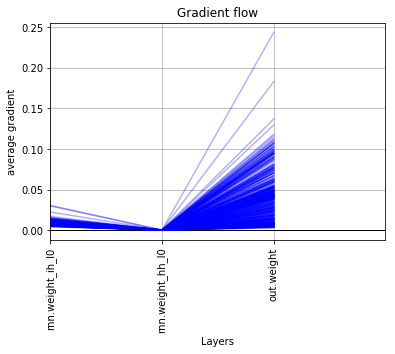

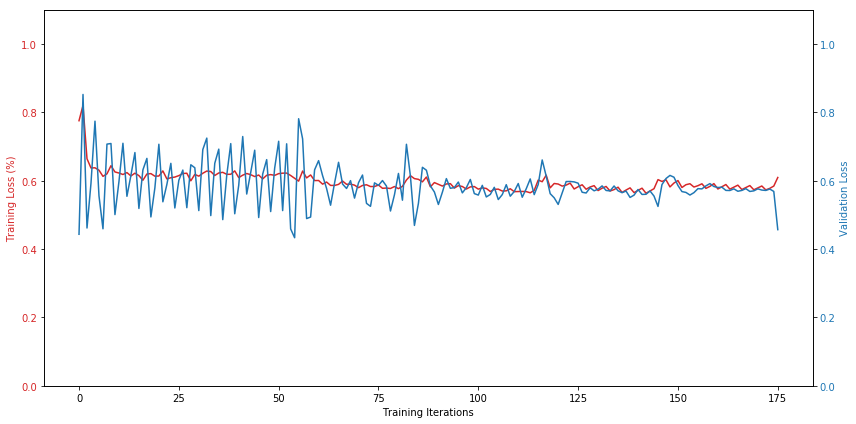

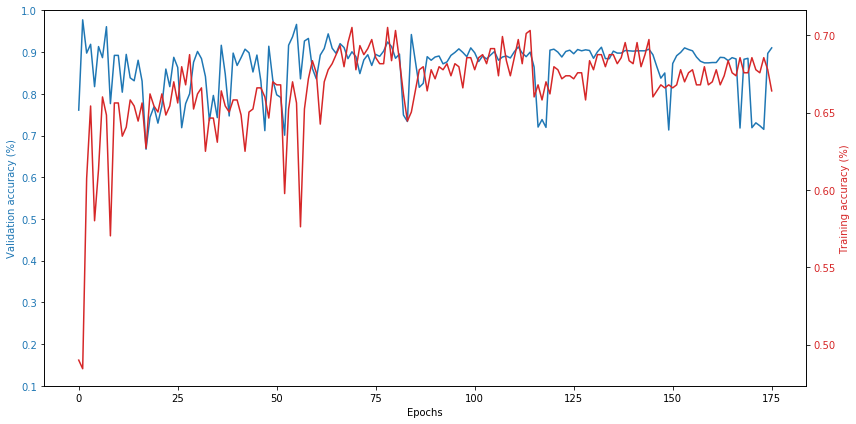

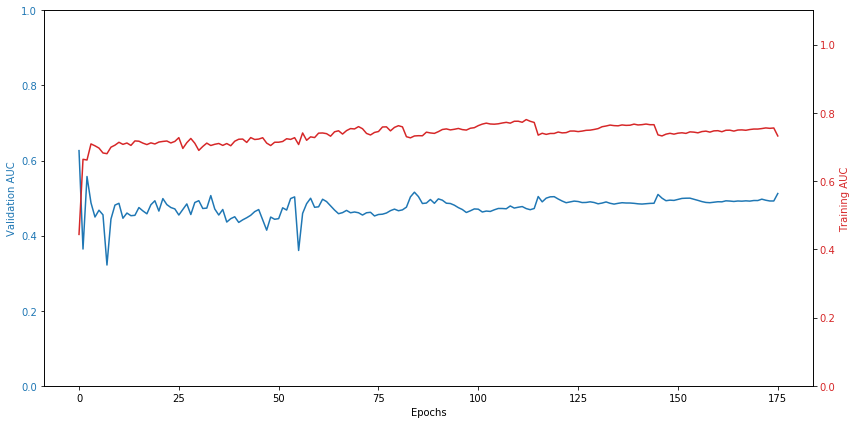

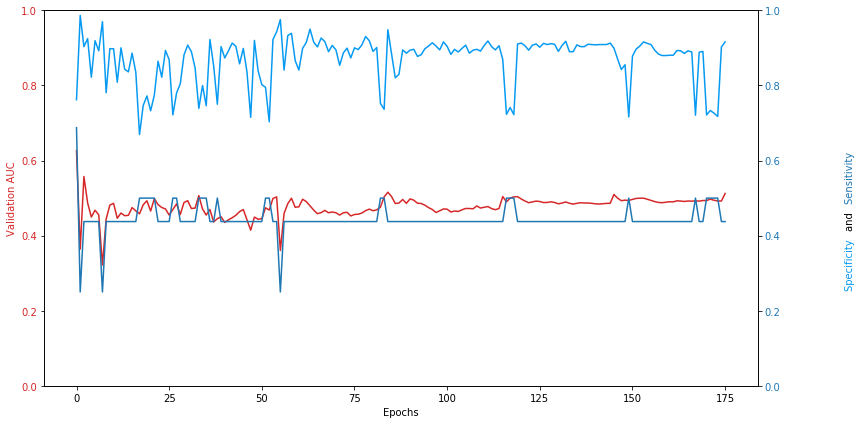


Fold  10
Number of confused training items before SMOTE:  288
Number of not_confused training items before SMOTE:  864
confused items in training set:  864
not_confused items in training set:  864
confused items in validation set:  52
not_confused items in validation set:  1228

Validation confused items:

['112a_V-SortTwoFactors-5-1.pkl', '112a_V-SortTwoFactors-5-2.pkl', '112a_V-SortTwoFactors-5-3.pkl', '112a_V-SortTwoFactors-5-4.pkl', '114a_V-SortTwoFactors-12-1.pkl', '114a_V-SortTwoFactors-12-2.pkl', '114a_V-SortTwoFactors-12-3.pkl', '114a_V-SortTwoFactors-12-4.pkl', '130a_V-RV-10-1.pkl', '130a_V-RV-10-2.pkl', '130a_V-RV-10-3.pkl', '130a_V-RV-10-4.pkl', '35a_H-SortTwoFactors-15-1.pkl', '35a_H-SortTwoFactors-15-2.pkl', '35a_H-SortTwoFactors-15-3.pkl', '35a_H-SortTwoFactors-15-4.pkl', '35a_H-SortTwoFactors-22-1.pkl', '35a_H-SortTwoFactors-22-2.pkl', '35a_H-SortTwoFactors-22-3.pkl', '35a_H-SortTwoFactors-22-4.pkl', '35a_H-SortTwoFactors-4-1.pkl', '35a_H-SortTwoFactors-4-2.pkl', '35a_H

[epoch: 12, batches:     6] loss: 0.60208 | accuracy: 0.67578
Training accuracy for epoch:  0.65625
validation accuracy:  0.8640625
validation loss:  0.5831536293029785
validation recall:  0.7692307692307693
validation specificity:  0.8680781758957655
validation AUC:  0.8358102605863192
Epochs without improvement:  4
[epoch: 13, batches:     2] loss: 0.63120 | accuracy: 0.65039
[epoch: 13, batches:     4] loss: 0.62246 | accuracy: 0.66602
[epoch: 13, batches:     6] loss: 0.60301 | accuracy: 0.66797
Training accuracy for epoch:  0.6614583333333334
validation accuracy:  0.88984375
validation loss:  0.5961599826812745
validation recall:  0.7692307692307693
validation specificity:  0.8949511400651465
validation AUC:  0.8484793911300426
Epochs without improvement:  5
[epoch: 14, batches:     2] loss: 0.63324 | accuracy: 0.64453
[epoch: 14, batches:     4] loss: 0.62354 | accuracy: 0.64648
[epoch: 14, batches:     6] loss: 0.60304 | accuracy: 0.68750
Training accuracy for epoch:  0.65950520

[epoch: 30, batches:     2] loss: 0.61930 | accuracy: 0.64648
[epoch: 30, batches:     4] loss: 0.60418 | accuracy: 0.65039
[epoch: 30, batches:     6] loss: 0.58894 | accuracy: 0.66406
Training accuracy for epoch:  0.6536458333333334
validation accuracy:  0.89140625
validation loss:  0.5827827334403992
validation recall:  0.7692307692307693
validation specificity:  0.8965798045602605
validation AUC:  0.8159922325231771
Epochs without improvement:  22
[epoch: 31, batches:     2] loss: 0.61146 | accuracy: 0.65820
[epoch: 31, batches:     4] loss: 0.59872 | accuracy: 0.66797
[epoch: 31, batches:     6] loss: 0.58764 | accuracy: 0.65234
Training accuracy for epoch:  0.6595052083333334
validation accuracy:  0.89296875
validation loss:  0.532594895362854
validation recall:  0.7692307692307693
validation specificity:  0.8982084690553745
validation AUC:  0.8409311576046106
Epochs without improvement:  23
[epoch: 32, batches:     2] loss: 0.60623 | accuracy: 0.66211
[epoch: 32, batches:     4]

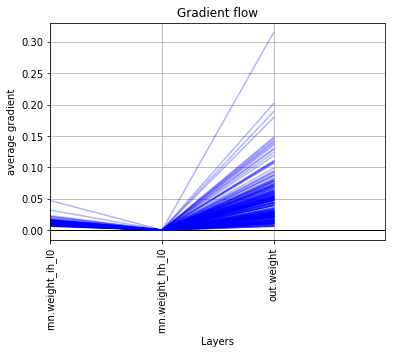

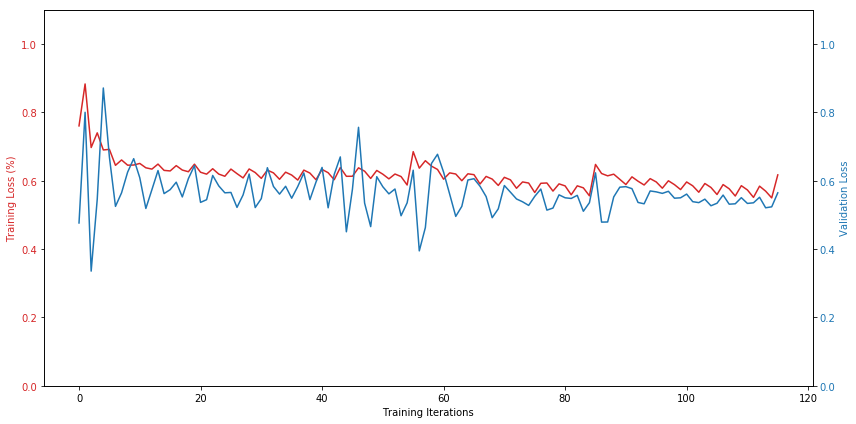

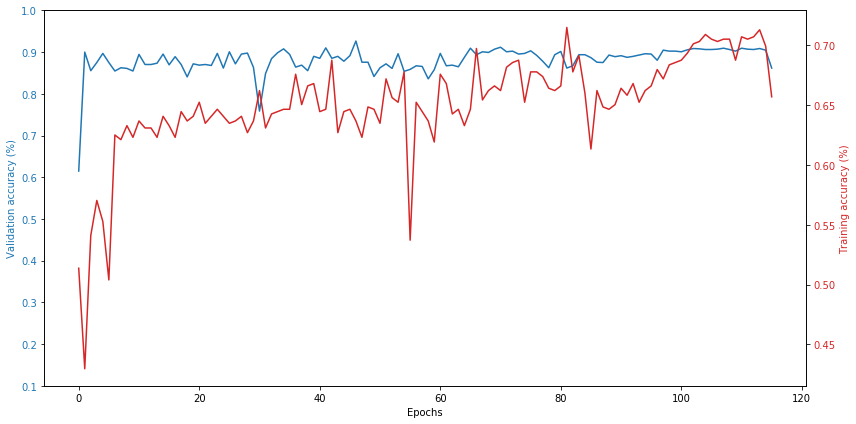

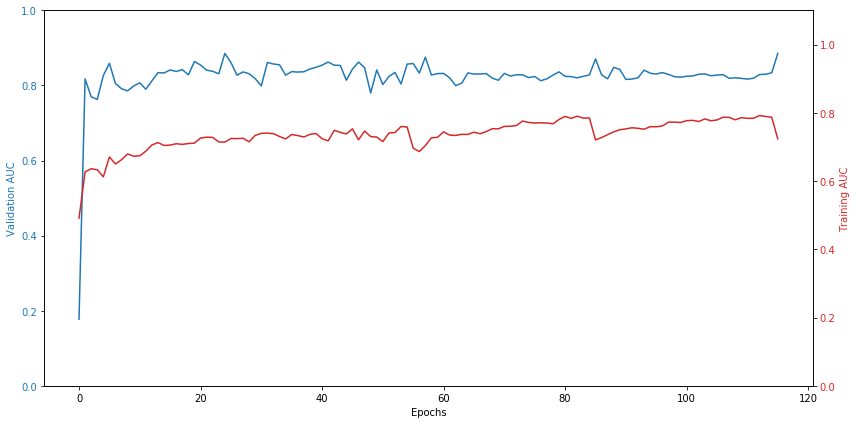

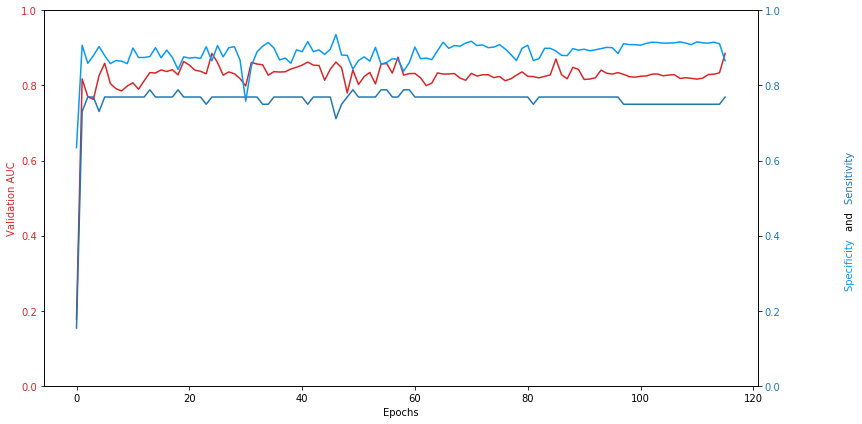


10-fold CV accuracy: 0.700234
10-fold CV sensitivity: 0.706576 
10-fold CV specificity: 0.699211 
10-fold CV AUC: 0.702982 


([0.53671875,
  0.7109375,
  0.62890625,
  0.73125,
  0.47265625,
  0.84765625,
  0.72421875,
  0.578125,
  0.91015625,
  0.86171875],
 [0.75,
  0.78125,
  0.55,
  0.8333333333333334,
  0.6666666666666666,
  0.75,
  0.75,
  0.7777777777777778,
  0.4375,
  0.7692307692307693],
 [0.5269607843137255,
  0.7091346153846154,
  0.6314516129032258,
  0.7292993630573248,
  0.46894904458598724,
  0.8488924050632911,
  0.7233009708737864,
  0.572347266881029,
  0.9161392405063291,
  0.8656351791530945],
 [0.6735089869281046,
  0.707782451923077,
  0.6017137096774194,
  0.8479299363057324,
  0.6205214968152868,
  0.821845332278481,
  0.7075334657252133,
  0.6513933547695605,
  0.5122132120253164,
  0.8853749060385868])

In [15]:
np.random.seed(MANUAL_SEED)
random.seed(MANUAL_SEED)
torch.manual_seed(MANUAL_SEED)

cross_validate(model_type='rnn',
                   folds=10,
                   epochs=300,
                   criterion_type='NLLLoss',
                   optimizer_type='Adam',
                   confused_path='./dataset/augmented/confused_highly_valid/',
                   not_confused_path='./dataset/augmented/not_confused_highly_valid/',
                   print_every=2,
                   plot_every=2,
                   hidden_size=256,
                   num_layers=1,
                   early_stopping=True,
                   early_stopping_patience=30,
                   rate_decay=True,
                   rate_decay_patience=10,
                   initial_learning_rate=0.003,
                   verbose=True)